In [32]:
import pandas as pd
from plotnine import *
from plotnine.data import *
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix, precision_recall_curve
import numpy as np

dfPoliticsNew = pd.read_csv('data/politics_stats_new.csv')
dfPoliticsNew['dataset']="politics"
dfPoliticsNew['isInterstingStrict'] = (dfPoliticsNew['interestingnessEvidence']>0) & (dfPoliticsNew['hasChangeAfterTrainPeriod'])
dfPoliticsNew



,Vertex1ID,Vertex2ID,trainEndDate,remainsValid,hasChangeAfterTrainPeriod,interestingnessEvidence,strongPositive_count,weakPositive_count,neutral_count,weakNegative_count,strongNegative_count,strongPositive_count.1,weakPositive_count.1,neutral_count.1,weakNegative_count.1,strongNegative_count.1,dataset,isInterstingStrict
0,infobox_politician||2568491||177756823-0||term...,infobox_politician||7811761||68743818-0||term_...,2011-05-07,False,False,3,0,0,341,22,70,0.0,0.0,341.0,22.0,70.0,politics,False
1,infobox election||1512195||270049553-0||party2,infobox election||21066447||364425076-0||party2,2016-04-30,False,False,4,0,0,675,74,44,0.0,0.0,675.0,74.0,44.0,politics,False
2,infobox election||1512195||270049553-0||party2,infobox election||21066447||364425076-0||party2,2011-05-07,False,True,4,0,0,368,46,18,0.0,0.0,368.0,46.0,18.0,politics,True
3,infobox election||1512195||270049553-0||party2,infobox election||21066447||364425076-0||party2,2013-05-04,False,False,4,0,0,675,74,44,0.0,0.0,675.0,74.0,44.0,politics,False
4,infobox election||1512195||270049553-0||party2,infobox election||21066447||364425076-0||party2,2012-05-05,False,True,4,0,0,675,74,44,0.0,0.0,675.0,74.0,44.0,politics,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3461046,infobox political party||2529151||245480083-0|...,infobox_president||209191||67897669-0||vicepre...,2011-05-07,True,False,0,0,0,357,45,26,0.0,0.0,357.0,45.0,26.0,politics,False
3461047,infobox political party||2529151||245480083-0|...,infobox_president||209191||67897669-0||vicepre...,2013-05-04,True,False,0,0,0,664,83,48,0.0,0.0,664.0,83.0,48.0,politics,False
3461048,infobox political party||2529151||245480083-0|...,infobox_president||209191||67897669-0||vicepre...,2012-05-05,True,False,0,0,0,664,83,48,0.0,0.0,664.0,83.0,48.0,politics,False
3461049,infobox political party||2529151||245480083-0|...,infobox_president||209191||67897669-0||vicepre...,2015-05-02,True,False,0,0,0,664,83,48,0.0,0.0,664.0,83.0,48.0,politics,False


In [33]:
def printDFInfo(curDf):
    print("----------------------------------------------------------------------------------------")
    print(curDf['dataset'].iloc[0],curDf['trainEndDate'].iloc[0])
    validRowsStrict = curDf[curDf['remainsValid']]
    #validRowsContainment = curDf[curDf['remainsValidContainment']]
    #validRowsPercentage = curDf[curDf['remainsValid_0_9_PercentageOfTime']]
    hasChangeAfterTrainPeriod = curDf[curDf['hasChangeAfterTrainPeriod']]
    isInterstingStrict = curDf[(curDf['interestingnessEvidence']>0) & (curDf['hasChangeAfterTrainPeriod'])]
    #nonNumericRows = curDf[np.invert(curDf['isNumeric'])]
    print("Total Row Count is", len(curDf.index), "of which ",len(validRowsStrict.index),"are valid (strict) - ",100*len(validRowsStrict.index)/len(curDf.index),"%"  )
    #print("Total Row Count is", len(curDf.index), "of which ",len(validRowsContainment.index),"are valid (containment) - ",100*len(validRowsContainment.index)/len(curDf.index),"%"  )
    #print("Total Row Count is", len(curDf.index), "of which ",len(validRowsPercentage.index),"are valid (90% of time)- ",100*len(validRowsPercentage.index)/len(curDf.index),"%"  )    
    print("Total Row Count is", len(curDf.index), "of which ",len(hasChangeAfterTrainPeriod.index),"are interesting (old) - ",100*len(hasChangeAfterTrainPeriod.index)/len(curDf.index),"%"  )
    print("Total Row Count is", len(curDf.index), "of which ",len(isInterstingStrict.index),"are interesting (new) - ",100*len(isInterstingStrict.index)/len(curDf.index),"%"  )
    #print("Total Row Count is", len(curDf.index), "of which ",len(nonNumericRows.index),"are non-numeric - ",100*len(nonNumericRows.index)/len(curDf.index),"%"  )
    validityInterestingnessConfusionMatrix = pd.crosstab(curDf['remainsValid'], curDf['hasChangeAfterTrainPeriod'])
    print(validityInterestingnessConfusionMatrix)
    
byTrainTimeEnd = dfPoliticsNew.groupby('trainEndDate')    
dfs = [byTrainTimeEnd.get_group(x) for x in byTrainTimeEnd.groups]
for curDf in dfs:
    printDFInfo(curDf)

#printDFInfo(dfPoliticsNew)

----------------------------------------------------------------------------------------
politics 2011-05-07
Total Row Count is 570221 of which  322618 are valid (strict) -  56.57771285168382 %
Total Row Count is 570221 of which  369396 are interesting (old) -  64.78119886850888 %
Total Row Count is 570221 of which  250851 are interesting (new) -  43.99189086336701 %
hasChangeAfterTrainPeriod   False   True 
remainsValid                             
False                       36883  210720
True                       163942  158676
----------------------------------------------------------------------------------------
politics 2012-05-05
Total Row Count is 475065 of which  322618 are valid (strict) -  67.9102859608685 %
Total Row Count is 475065 of which  251902 are interesting (old) -  53.024743982402406 %
Total Row Count is 475065 of which  145701 are interesting (new) -  30.66969783082315 %
hasChangeAfterTrainPeriod   False   True 
remainsValid                             
False   

In [34]:
#Filters:
dfPoliticsNew=dfPoliticsNew[dfPoliticsNew['trainEndDate']=='2011-05-07']
dfPoliticsNew = dfPoliticsNew[dfPoliticsNew['isInterstingStrict']]

In [101]:
from random import random

def createScore(weights,name):
    numTransitionsTotal=870
    weightsRelative = [weights[0]/numTransitionsTotal,weights[1]/numTransitionsTotal,weights[2],weights[3]/numTransitionsTotal,weights[4]/numTransitionsTotal]
    dfPoliticsNew[name]=(dfPoliticsNew['strongPositive_count.1']*weightsRelative[0] + 
                        dfPoliticsNew['weakPositive_count.1']*weightsRelative[1] +
                        dfPoliticsNew['neutral_count.1']*weightsRelative[2] +
                        dfPoliticsNew['weakNegative_count.1']*weightsRelative[3] +
                        dfPoliticsNew['strongNegative_count.1']*weightsRelative[4])
    return dfPoliticsNew[name]
    
nScores=1000
allWeights={}
for i in range(nScores):
    weights = [random(),random(),0,-random(),-random()]
    scoreName="score_"+str(i)
    allWeights[scoreName]=weights
    createScore(weights,scoreName)
    
#manual statistic based tuning:
weights = [1.0,0.2,0,-0.00665749,-0.000647724]
scoreName="score_Statistics"
allWeights[scoreName]=weights
createScore(weights,scoreName)
                     
scoreNames=["score_"+str(i) for i in range(nScores)]
scoreNames.append("score_Statistics")


In [76]:
allWeights['score_1']

[0.9050973654197426,
 0.6431418918481661,
 0,
 -0.32596752847216204,
 -0.0703810120284698]

In [102]:
def getF1DF(truthLabel,predScores,datasetNames):
    finalDf = pd.DataFrame()
    #f1Df = pd.DataFrame()
    rows_listF1 = []
    for dsName in  datasetNames:
        dfForThisDs = df[df['dataset']==dsName]
        for predScore in predScores:
            dfForThisDsAndScore = dfForThisDs[dfForThisDs[predScore].notnull()]
            y_test = dfForThisDsAndScore[truthLabel]
            y_pred = dfForThisDsAndScore[predScore]
            scoreName = predScore
            precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
            indices = (precision !=0) | (recall!=0)
            precision = precision[indices]
            recall = recall[indices]
            thresholds = thresholds[indices[0:len(indices)-1]]
            f1_scores = 2*recall*precision/(recall+precision)
            f1_scores=f1_scores[0:len(f1_scores)-1]
            bestThresholdIndex=np.argmax(f1_scores)
            precision=precision[0:len(precision)-1]
            recall=recall[0:len(recall)-1]
            pd.DataFrame(data=f1_scores).describe()
            curWeights=allWeights[scoreName]
            dict1 = {"scoreName": scoreName, 
                     "bestThreshold": thresholds[bestThresholdIndex],
                     "best_F1":f1_scores[bestThresholdIndex],#np.max(f1_scores),
                     "precision":precision[bestThresholdIndex],
                     "recall":recall[bestThresholdIndex],
                     "strongPositiveWeight":curWeights[0],
                     "weakPositiveWeight":curWeights[1],
                     "neutralWeight":curWeights[2],
                     "weakNegativeWeight":curWeights[3],
                     "strongNegativeWeight":curWeights[4]}
            rows_listF1.append(dict1)
            d = {'thresholds': thresholds, 'f1': f1_scores,'precision': precision, 'recall': recall}
            prdf = pd.DataFrame(data=d)
            prdf['scoreName'] = scoreName
            finalDf = finalDf.append(prdf)
    f1Df = pd.DataFrame(rows_listF1)
    #print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='f1',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName)) 
    #print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='precision',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName))  
    #print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='recall',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName)) 
    return f1Df

truthLabel='remainsValid'
datasetNames = df.dataset.unique()
#datasetNames = ['socrata_maryland','socrata_austin']
#pd.set_option('display.max_colwidth', None)
pd.reset_option('display.max_colwidth')
for dsName in datasetNames:
    dsNames = [dsName]
    #print(comparePrCurves(truthLabel,scoreNames,dsNames))
    dfF1 = getF1DF(truthLabel,scoreNames,dsNames)
    #pd.set_option('display.max_rows', None)
    #pd.set_option('display.max_colwidth', None)
    dfF1.sort_values(by=['best_F1'],inplace=True)
    print(dfF1)
    pd.reset_option('^display.', silent=True)

     scoreName  bestThreshold   best_F1  precision    recall  \
886  score_886      -0.049438  0.276589   0.160957  0.982208   
628  score_628      -0.070696  0.276591   0.160957  0.982258   
638  score_638      -0.048527  0.276591   0.160958  0.982233   
323  score_323      -0.076447  0.276592   0.160959  0.982208   
141  score_141      -0.029025  0.276593   0.160959  0.982233   
..         ...            ...       ...        ...       ...   
465  score_465      -0.026802  0.340418   0.228868  0.664100   
740  score_740      -0.021634  0.340425   0.228854  0.664275   
833  score_833      -0.010021  0.340481   0.228898  0.664324   
140  score_140      -0.015899  0.340604   0.237257  0.603474   
144  score_144      -0.009929  0.340769   0.237343  0.603947   

     strongPositiveWeight  weakPositiveWeight  neutralWeight  \
886              0.008913            0.024376              0   
628              0.089320            0.708809              0   
638              0.425913            0.

     scoreName  bestThreshold   best_F1  precision    recall  \
886  score_886      -0.049438  0.276589   0.160957  0.982208   
628  score_628      -0.070696  0.276591   0.160957  0.982258   
638  score_638      -0.048527  0.276591   0.160958  0.982233   
323  score_323      -0.076447  0.276592   0.160959  0.982208   
141  score_141      -0.029025  0.276593   0.160959  0.982233   
..         ...            ...       ...        ...       ...   
465  score_465      -0.026802  0.340418   0.228868  0.664100   
740  score_740      -0.021634  0.340425   0.228854  0.664275   
833  score_833      -0.010021  0.340481   0.228898  0.664324   
140  score_140      -0.015899  0.340604   0.237257  0.603474   
144  score_144      -0.009929  0.340769   0.237343  0.603947   

     strongPositiveWeight  weakPositiveWeight  neutralWeight  \
886              0.008913            0.024376              0   
628              0.089320            0.708809              0   
638              0.425913            0.

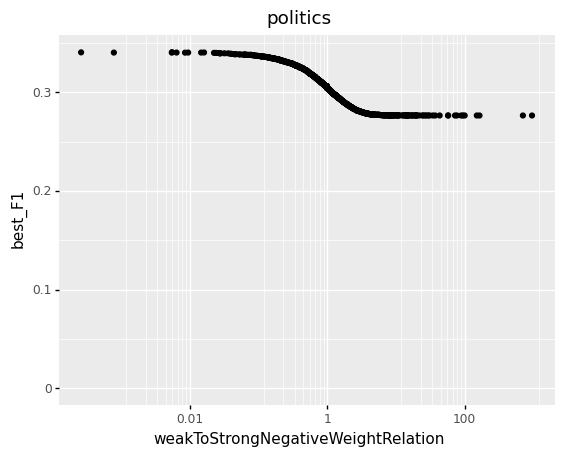

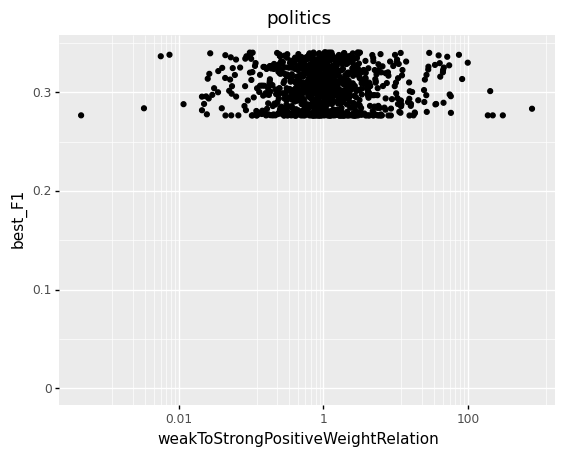

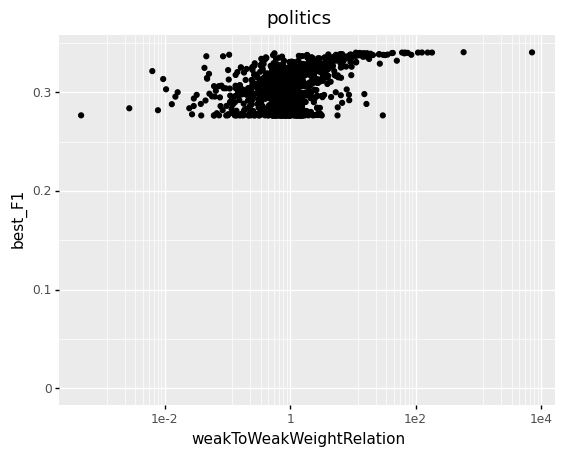

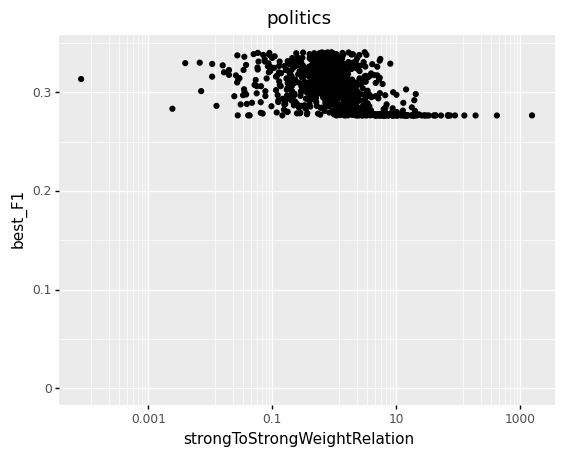

In [103]:
print(dfF1)
#TODO: plot something:
dfF1['weakToStrongNegativeWeightRelation']=dfF1['weakNegativeWeight']/dfF1['strongNegativeWeight']
dfF1['weakToStrongPositiveWeightRelation']=dfF1['weakPositiveWeight']/dfF1['strongPositiveWeight']
dfF1['weakToWeakWeightRelation']=dfF1['weakPositiveWeight']/(-dfF1['weakNegativeWeight'])
dfF1['strongToStrongWeightRelation']=dfF1['strongPositiveWeight']/(-dfF1['strongNegativeWeight'])


print(ggplot(dfF1, aes(x='weakToStrongNegativeWeightRelation',ymin=0, y='best_F1')) + scale_x_log10() + geom_point()  + labs(title=dsName))
print(ggplot(dfF1, aes(x='weakToStrongPositiveWeightRelation',ymin=0, y='best_F1')) + scale_x_log10() + geom_point()  + labs(title=dsName))
print(ggplot(dfF1, aes(x='weakToWeakWeightRelation',ymin=0, y='best_F1')) + scale_x_log10() + geom_point()  + labs(title=dsName))
print(ggplot(dfF1, aes(x='strongToStrongWeightRelation',ymin=0, y='best_F1')) + scale_x_log10() + geom_point()  + labs(title=dsName))

In [12]:
#dsName="politics"
#ggplot(dfPoliticsNew, aes(x='isInterstingStrict',ymin=0, y='remainsValid',group='trainEndDate',color='trainEndDate')) + geom_point() + labs(title=dsName)

TypeError: Discrete value supplied to continuous scale

In [1]:
import pandas as pd
from plotnine import *
from plotnine.data import *
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix, precision_recall_curve
import numpy as np


#Socrata
dfChicago = pd.read_csv('data/chicagoEdges.json_filtered_statsNew.csv')
dfChicago['dataset'] = 'socrata_chicago'
dfUtah = pd.read_csv('data/utah.json_filtered_statsNew.csv')
dfUtah['dataset'] = 'socrata_utah'
dfOregon = pd.read_csv('data/oregon.json_filtered_statsNew.csv')
dfOregon['dataset'] = 'socrata_oregon'
dfAustin = pd.read_csv('data/austintexas.json_filtered_statsNew.csv')
dfAustin['dataset'] = 'socrata_austin'
dfMaryland = pd.read_csv('data/gov.maryland.json_filtered_statsNew.csv')
dfMaryland['dataset'] = 'socrata_maryland'


#WIkipedia:
dfFootball = pd.read_csv('data/footballStatsSample.csv')
dfFootball['dataset'] = 'wikipedia_football'
#WIkipedia:
dfMilitary = pd.read_csv('data/militaryStatsSample.csv')
dfMilitary['dataset'] = 'wikipedia_military'
#WIkipedia:
dfPolitics = pd.read_csv('data/politicsStats.csv')
dfPolitics['dataset'] = 'wikipedia_politics'
dfMusic = pd.read_csv('data/musicStatsSample.csv')
dfMusic['dataset'] = 'wikipedia_music'
dfTVAndFilm = pd.read_csv('data/tv_and_film_StatsSample.csv')
dfTVAndFilm['dataset'] = 'wikipedia_tvAndFilm'
dfEducation = pd.read_csv('data/educationStatsSample.csv')
dfEducation['dataset'] = 'wikipedia_education'

df = (dfFootball
      .append(dfMilitary)
      .append(dfPolitics)
      .append(dfMusic)
      .append(dfTVAndFilm)
      .append(dfEducation)
      .append(dfChicago)
      .append(dfUtah)
      .append(dfOregon)
      .append(dfAustin)
      .append(dfMaryland))

allDfs = [dfMilitary,dfPolitics,dfMusic,dfTVAndFilm,dfEducation,dfChicago,dfUtah,dfOregon,dfAustin,dfMaryland]
#df = dfWikiConfirmMost#.append(dfWikiConfirmLittle)
print(df.dtypes)
#print("Socrata:",len(dfSocrata.index))
df.replace([np.inf, -np.inf], np.nan, inplace=True)




Vertex1ID                                                 object
Vertex2ID                                                 object
remainsValid                                                bool
remainsValidContainment                                     bool
remainsValid_0_9_PercentageOfTime                           bool
hasChangeAfterTrainPeriod                                   bool
interestingnessEvidence                                    int64
isNumeric                                                   bool
MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod    float64
MultipleEventWeightScore_NITWO_tfwON_LIN_TrainPeriod     float64
MultipleEventWeightScore_NITWO_tfwON_EXP_TrainPeriod     float64
MultipleEventWeightScore_NITWO_tfwON_DVD_TrainPeriod     float64
MultipleEventWeightScore_NIONE_tfwOFF_LIN_TrainPeriod    float64
MultipleEventWeightScore_NIONE_tfwON_LIN_TrainPeriod     float64
MultipleEventWeightScore_NIONE_tfwON_EXP_TrainPeriod     float64
MultipleEventWeightScore_

# Edge Filters:
in Wikipedia: Edges are filtered in the following way: We only consider edges (v,w), where v and w share one Transition A --> B where A!=B and (A!="" && B!="")
Transitions are constructed by ignoring interleaved Wildcards (--> every transition only consists of non-Wildcard values)

in Socrata: Edges are filtered by evidence >=1

# Validity and Interstingness

Validity of Edge (v,w): v and w are mergeable in the test period (2011-2019)

hasChangeAfterTrainPeriod of Edge (v,w): either v or w has a change A-->B (with B!=A and both A,B!=Wildcard) in the test period

In [9]:
def printDFInfo(curDf):
    print("----------------------------------------------------------------------------------------")
    print(curDf['dataset'].iloc[0])
    validRowsStrict = curDf[curDf['remainsValid']]
    validRowsContainment = curDf[curDf['remainsValidContainment']]
    validRowsPercentage = curDf[curDf['remainsValid_0_9_PercentageOfTime']]
    hasChangeAfterTrainPeriod = curDf[curDf['hasChangeAfterTrainPeriod']]
    isInterstingStrict = curDf[(curDf['interestingnessEvidence']>0) & (curDf['hasChangeAfterTrainPeriod'])]
    nonNumericRows = curDf[np.invert(curDf['isNumeric'])]
    print("Total Row Count is", len(curDf.index), "of which ",len(validRowsStrict.index),"are valid (strict) - ",100*len(validRowsStrict.index)/len(curDf.index),"%"  )
    print("Total Row Count is", len(curDf.index), "of which ",len(validRowsContainment.index),"are valid (containment) - ",100*len(validRowsContainment.index)/len(curDf.index),"%"  )
    print("Total Row Count is", len(curDf.index), "of which ",len(validRowsPercentage.index),"are valid (90% of time)- ",100*len(validRowsPercentage.index)/len(curDf.index),"%"  )    
    print("Total Row Count is", len(curDf.index), "of which ",len(hasChangeAfterTrainPeriod.index),"are interesting (old) - ",100*len(hasChangeAfterTrainPeriod.index)/len(curDf.index),"%"  )
    print("Total Row Count is", len(curDf.index), "of which ",len(isInterstingStrict.index),"are interesting (new) - ",100*len(isInterstingStrict.index)/len(curDf.index),"%"  )
    print("Total Row Count is", len(curDf.index), "of which ",len(nonNumericRows.index),"are non-numeric - ",100*len(nonNumericRows.index)/len(curDf.index),"%"  )
    validityInterestingnessConfusionMatrix = pd.crosstab(curDf['remainsValid'], curDf['hasChangeAfterTrainPeriod'])
    print(validityInterestingnessConfusionMatrix)


for curDf in allDfs:
    printDFInfo(curDf)

----------------------------------------------------------------------------------------
wikipedia_military
Total Row Count is 1000000 of which  604047 are valid (strict) -  60.4047 %
Total Row Count is 1000000 of which  642008 are valid (containment) -  64.2008 %
Total Row Count is 1000000 of which  984554 are valid (90% of time)-  98.4554 %
Total Row Count is 1000000 of which  552667 are interesting (old) -  55.2667 %
Total Row Count is 1000000 of which  460486 are interesting (new) -  46.0486 %
Total Row Count is 1000000 of which  998139 are non-numeric -  99.8139 %
hasChangeAfterTrainPeriod   False   True 
remainsValid                             
False                       73143  322810
True                       374190  229857
----------------------------------------------------------------------------------------
wikipedia_politics
Total Row Count is 575801 of which  322618 are valid (strict) -  56.02942683322884 %
Total Row Count is 575801 of which  336198 are valid (containme

In [11]:
#we only keep those that are interesting for the evaluation:
df['isInterstingStrict'] = (df['interestingnessEvidence']>0) & (df['hasChangeAfterTrainPeriod'])
df = df[df['isInterstingStrict']]
#df = df[np.invert(df['isNumeric'])]
display(df)
df.describe()

,Vertex1ID,Vertex2ID,remainsValid,remainsValidContainment,remainsValid_0_9_PercentageOfTime,hasChangeAfterTrainPeriod,interestingnessEvidence,isNumeric,MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_LIN_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_EXP_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_DVD_TrainPeriod,MultipleEventWeightScore_NIONE_tfwOFF_LIN_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_LIN_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_EXP_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_DVD_TrainPeriod,dataset,isInterstingStrict
2,football player infobox||16932429||205633148-0...,infobox football biography 2||28287932||377666...,False,False,True,True,25,True,0.477931,0.477831,0.476514,0.471725,0.477931,0.477831,0.476514,0.471725,wikipedia_football,True
4,football club infobox||8039613||89113524-0||sh...,football club infobox||16195384||197016275-0||...,False,False,True,True,2,False,0.432184,0.432184,0.432184,0.432184,0.432184,0.432184,0.432184,0.432184,wikipedia_football,True
5,football club infobox||2310698||19626528-0||le...,football club infobox||2568815||33051468-0||so...,False,False,True,True,8,False,0.410575,0.410545,0.410183,0.409425,0.410575,0.410545,0.410183,0.409425,wikipedia_football,True
6,infobox football biography||15790387||21766402...,infobox football biography 2||28324588||378245...,False,False,False,True,30,True,0.464828,0.464823,0.464762,0.464368,0.464828,0.464823,0.464762,0.464368,wikipedia_football,True
8,football club infobox||1258026||9159567-0||sho...,infobox football club||30623750||409930435-0||...,False,False,True,True,9,False,0.402069,0.402069,0.402069,0.402069,0.402069,0.402069,0.402069,0.402069,wikipedia_football,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96259,gov.maryland_gov.maryland.mhft-5t5y.0_2_141,gov.maryland_gov.maryland.mhft-5t5y.0_33_24,False,False,False,True,2,True,0.536464,0.532750,0.495472,0.461622,0.533702,0.530023,0.493227,0.461584,socrata_maryland,True
96260,gov.maryland_gov.maryland.mhft-5t5y.0_2_110,gov.maryland_gov.maryland.mhft-5t5y.0_33_11,True,True,True,True,2,True,0.536464,0.528932,0.476647,0.461467,0.533702,0.526279,0.475183,0.461454,socrata_maryland,True
96261,gov.maryland_gov.maryland.mhft-5t5y.0_2_65,gov.maryland_gov.maryland.mhft-5t5y.0_33_24,False,False,False,True,2,True,0.536464,0.532750,0.495472,0.461622,0.533702,0.530023,0.493227,0.461584,socrata_maryland,True
96262,gov.maryland_gov.maryland.mhft-5t5y.0_2_19,gov.maryland_gov.maryland.mhft-5t5y.0_33_19,False,False,False,True,2,True,0.536464,0.533293,0.499766,0.461876,0.533702,0.530535,0.497083,0.461625,socrata_maryland,True


,interestingnessEvidence,MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_LIN_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_EXP_TrainPeriod,MultipleEventWeightScore_NITWO_tfwON_DVD_TrainPeriod,MultipleEventWeightScore_NIONE_tfwOFF_LIN_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_LIN_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_EXP_TrainPeriod,MultipleEventWeightScore_NIONE_tfwON_DVD_TrainPeriod
count,2.520320e+06,2.516921e+06,2.516921e+06,2.516921e+06,2.516921e+06,2.516921e+06,2.516921e+06,2.516921e+06,2.516921e+06
mean,7.141360e+00,4.669143e-01,4.660416e-01,4.605587e-01,4.474599e-01,4.600647e-01,4.598557e-01,4.587255e-01,4.474140e-01
std,1.323731e+01,5.759712e-02,5.490270e-02,4.434424e-02,3.281880e-02,4.385252e-02,4.373325e-02,4.297897e-02,3.273927e-02
min,1.000000e+00,5.524862e-03,5.522732e-03,5.490751e-03,2.765424e-03,5.524862e-03,5.522732e-03,5.490751e-03,2.765424e-03
25%,1.000000e+00,4.404598e-01,4.404516e-01,4.401874e-01,4.365519e-01,4.402299e-01,4.402256e-01,4.397701e-01,4.365518e-01
50%,3.000000e+00,4.577011e-01,4.577008e-01,4.574713e-01,4.503264e-01,4.572414e-01,4.572401e-01,4.565517e-01,4.503264e-01
75%,6.000000e+00,4.758621e-01,4.758621e-01,4.741578e-01,4.618446e-01,4.740230e-01,4.733285e-01,4.714631e-01,4.617630e-01
max,1.820000e+02,9.182320e-01,9.182320e-01,9.182320e-01,9.182320e-01,9.182320e-01,9.182320e-01,9.182320e-01,9.182320e-01


In [64]:
print(dfMaryland[np.invert(dfMaryland['isNumeric'])])
print(dfMaryland[dfMaryland['isNumeric']])

                                          Vertex1ID  \
0        gov.maryland_gov.maryland.ief7-i74z.0_3_24   
39     gov.maryland_gov.maryland.65du-s3qu.0_20_150   
40     gov.maryland_gov.maryland.65du-s3qu.0_20_152   
41       gov.maryland_gov.maryland.ief7-i74z.0_9_24   
42       gov.maryland_gov.maryland.mhft-5t5y.0_28_4   
...                                             ...   
95806   gov.maryland_gov.maryland.mhft-5t5y.0_17_13   
95807    gov.maryland_gov.maryland.mhft-5t5y.0_17_3   
95808    gov.maryland_gov.maryland.mhft-5t5y.0_17_3   
95812   gov.maryland_gov.maryland.4jem-ugpy.0_18_11   
95813    gov.maryland_gov.maryland.evyv-ezm8.0_0_22   

                                          Vertex2ID  remainsValid  \
0        gov.maryland_gov.maryland.ief7-i74z.0_6_24          True   
39     gov.maryland_gov.maryland.65du-s3qu.0_27_464         False   
40     gov.maryland_gov.maryland.65du-s3qu.0_27_464         False   
41       gov.maryland_gov.maryland.q7q7-usgm.0_5_25          Tr

# Score Comparisons (PR-Curves and Max-F1)

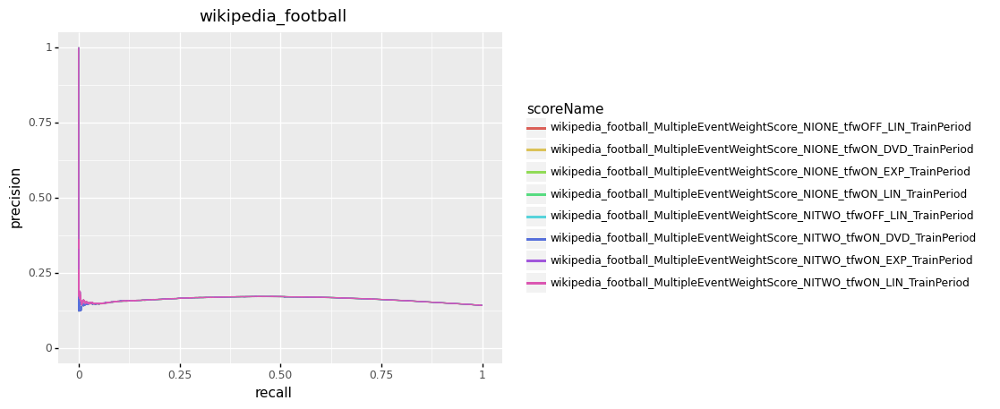

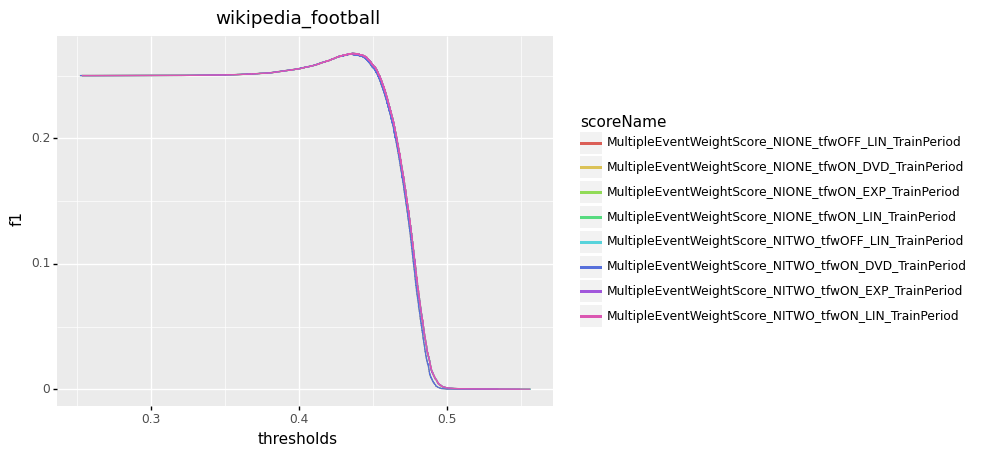

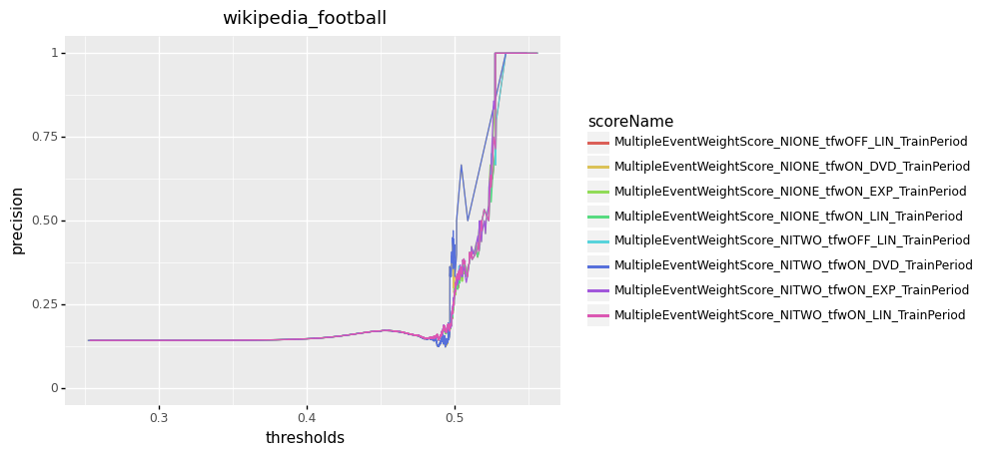

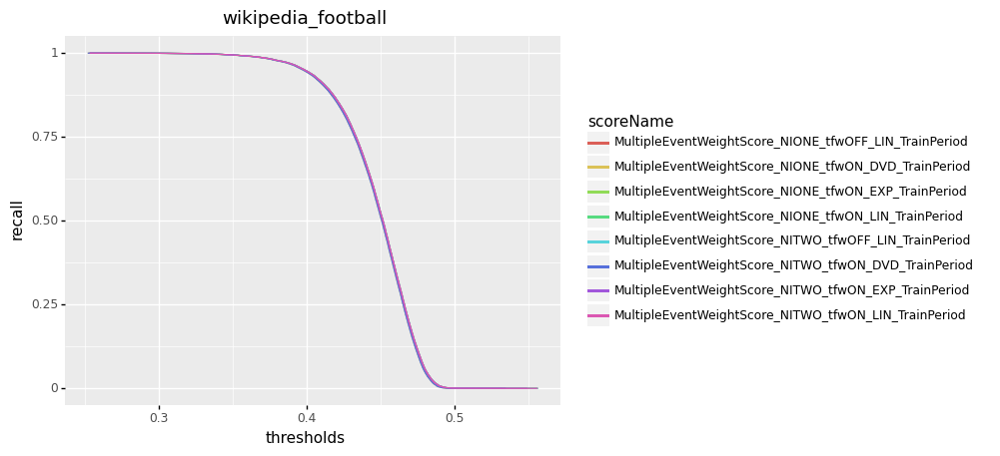


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.436092  0.267820   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.436310  0.267921   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.436149  0.267981   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.435632  0.267372   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.436092  0.267821   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.436310  0.267922   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.436149  0.267982   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.434943  0.267369   

   precision    recall  
0   0.164633  0.717559  
1   0.164750  0.716798  
2   0.164798  0.716750  
3   0.164524  0.713230  
4   0.164635  0.717559  
5   0.164751  0.716798  
6   0.164799  0.716750  
7   0.164091  0.721428  


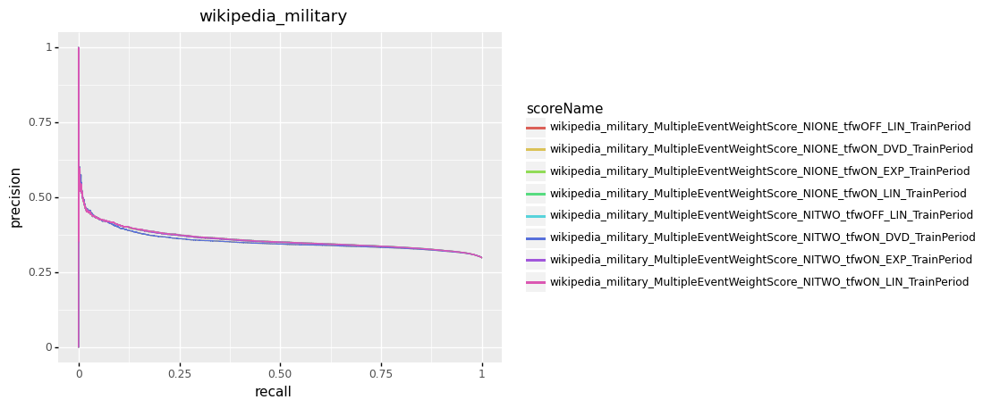

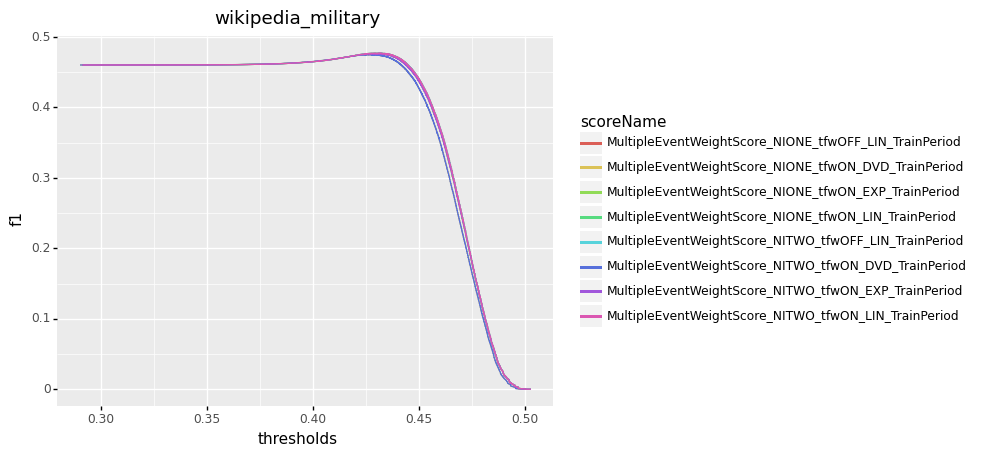

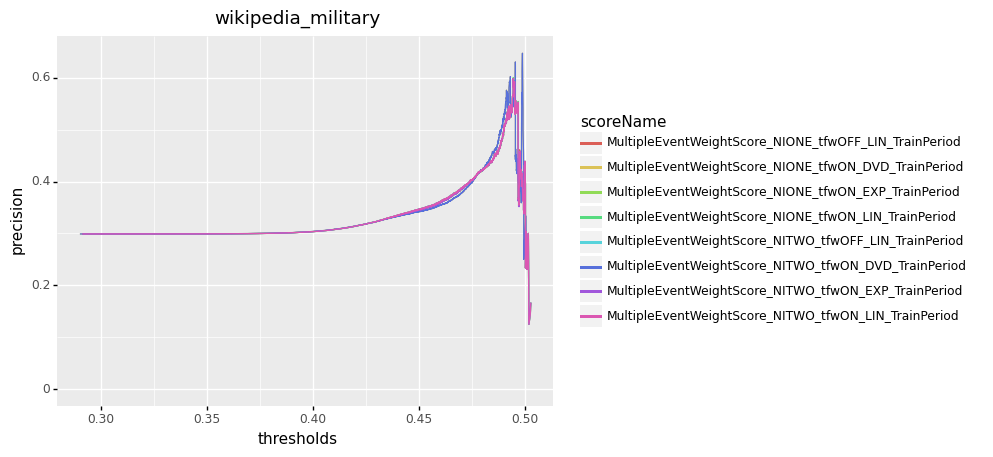

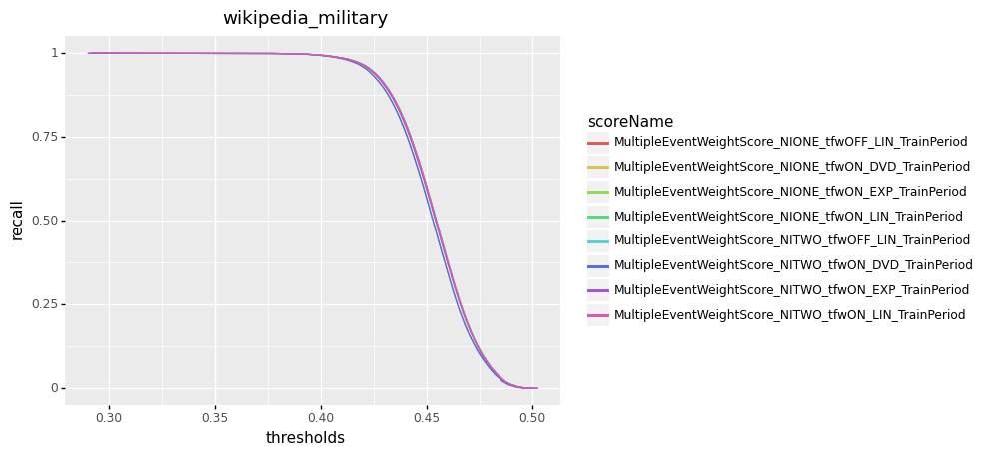


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.432184  0.477050   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.431329  0.477045   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.431269  0.476159   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.426207  0.474799   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.432184  0.477048   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.431329  0.477045   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.431269  0.476159   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.426207  0.474799   

   precision    recall  
0   0.325672  0.891375  
1   0.324829  0.897724  
2   0.324468  0.894208  
3   0.319416  0.924555  
4   0.325671  0.891368  
5   0.324829  0.897716  
6   0.324469  0.894201  
7   0.319416  0.924555  


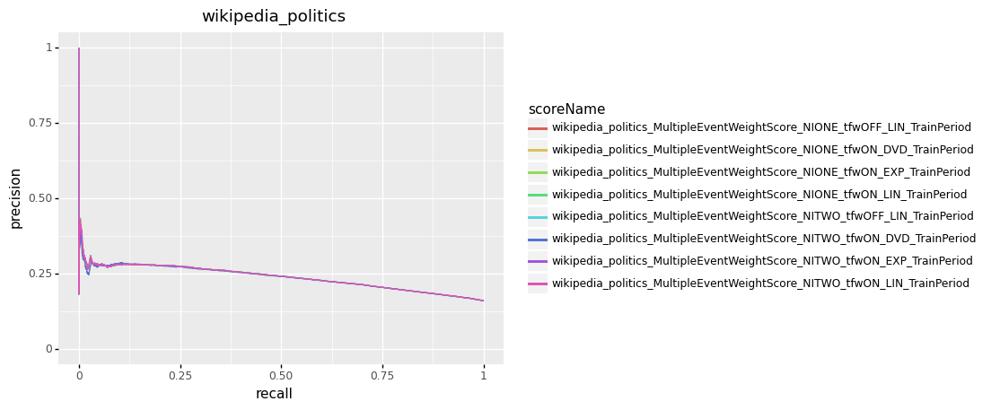

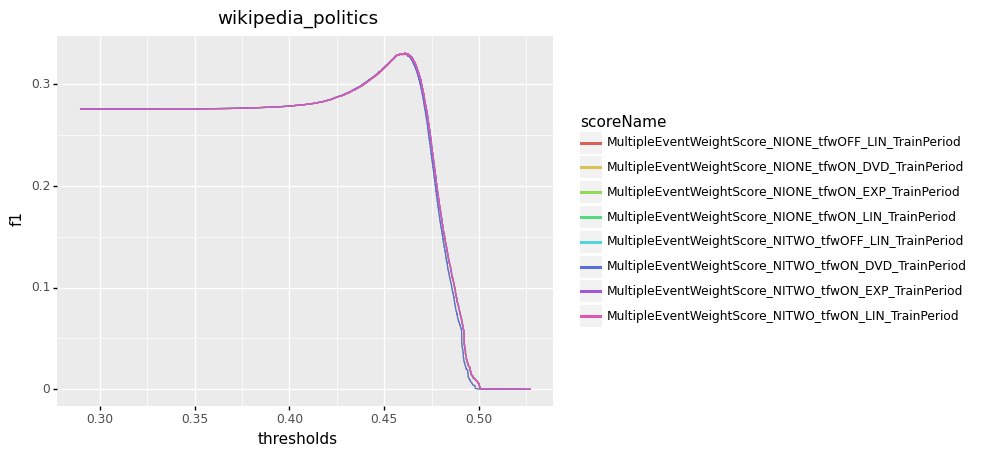

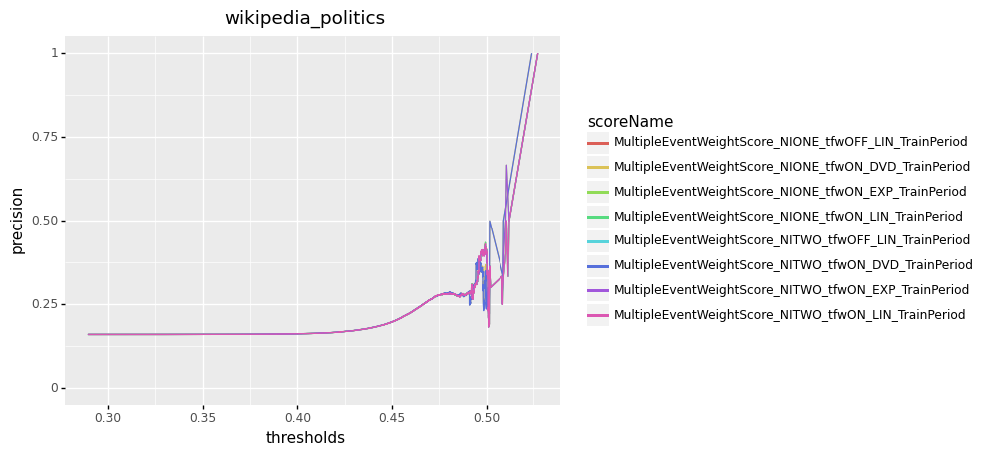

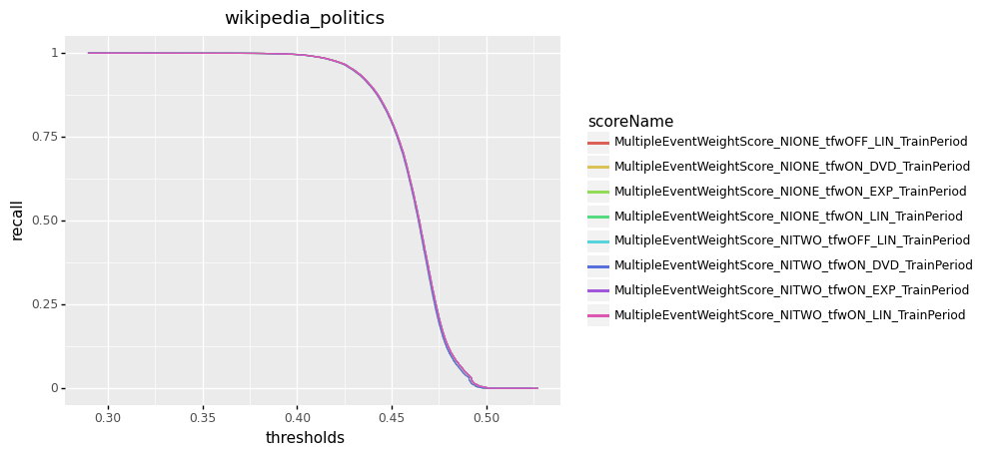


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.461149  0.330687   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.461135  0.330699   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.460927  0.330701   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.460230  0.330049   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.461149  0.330696   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.461135  0.330707   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.460927  0.330710   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.460230  0.330049   

   precision    recall  
0   0.229239  0.593207  
1   0.229250  0.593207  
2   0.229252  0.593207  
3   0.227495  0.600957  
4   0.229262  0.593108  
5   0.229273  0.593108  
6   0.229275  0.593108  
7   0.227495  0.600957  


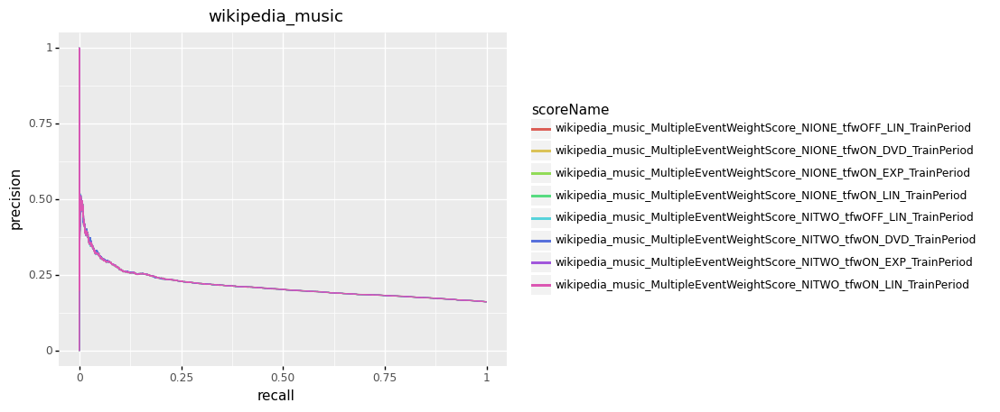

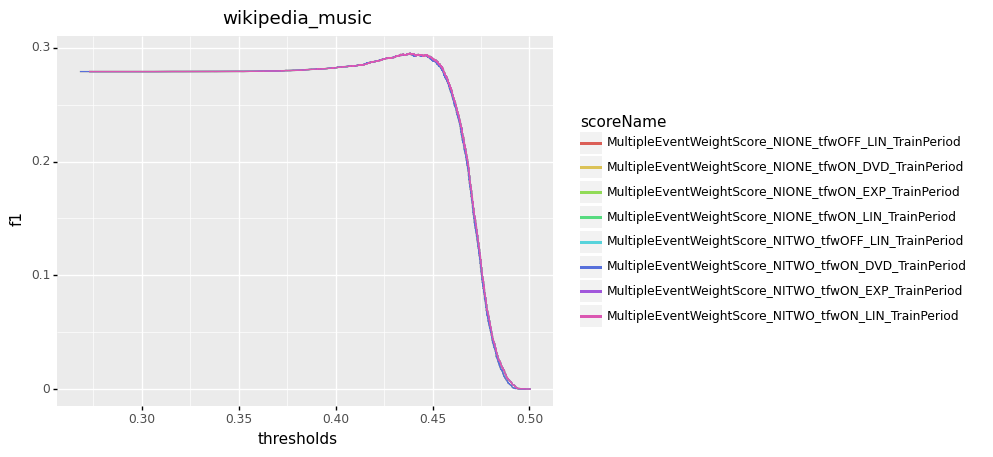

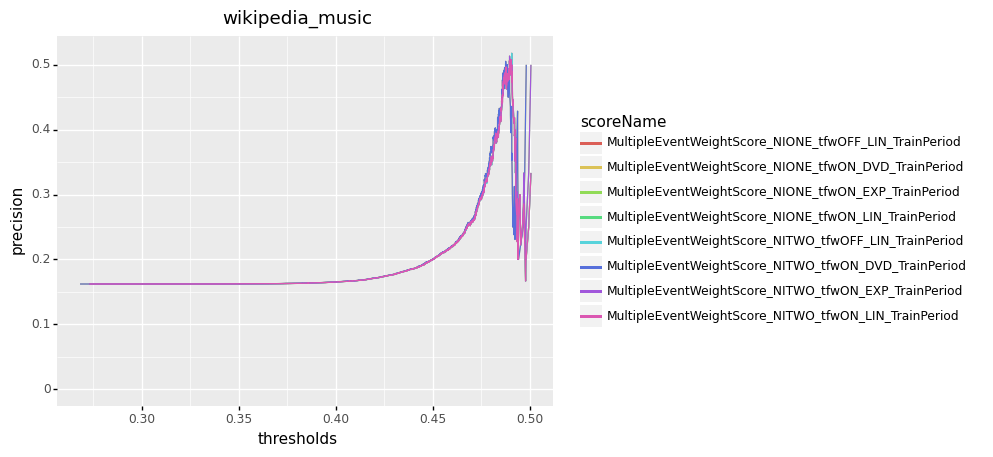

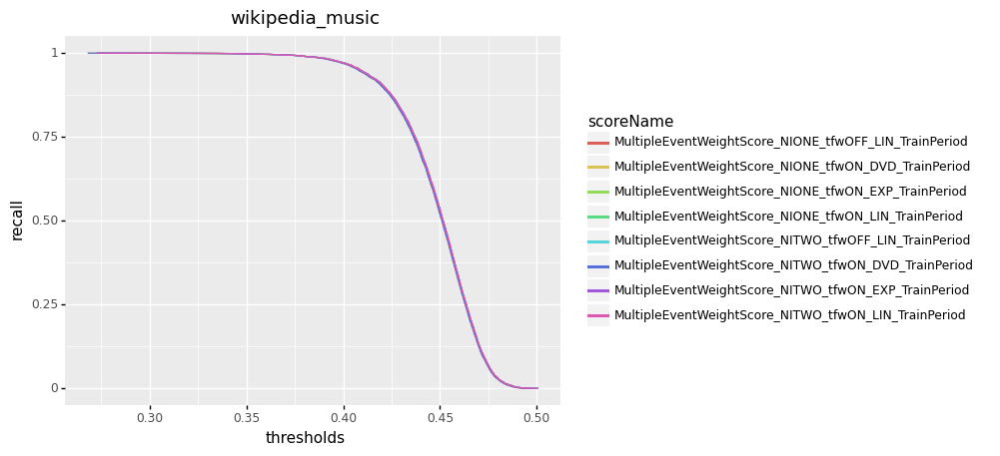


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.438391  0.295088   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.438384  0.295161   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.438277  0.295182   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.437931  0.294547   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.438391  0.295088   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.438384  0.295161   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.438277  0.295182   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.437931  0.294547   

   precision    recall  
0   0.184504  0.736534  
1   0.184574  0.736336  
2   0.184609  0.736038  
3   0.184489  0.730086  
4   0.184504  0.736534  
5   0.184574  0.736336  
6   0.184609  0.736038  
7   0.184489  0.730086  


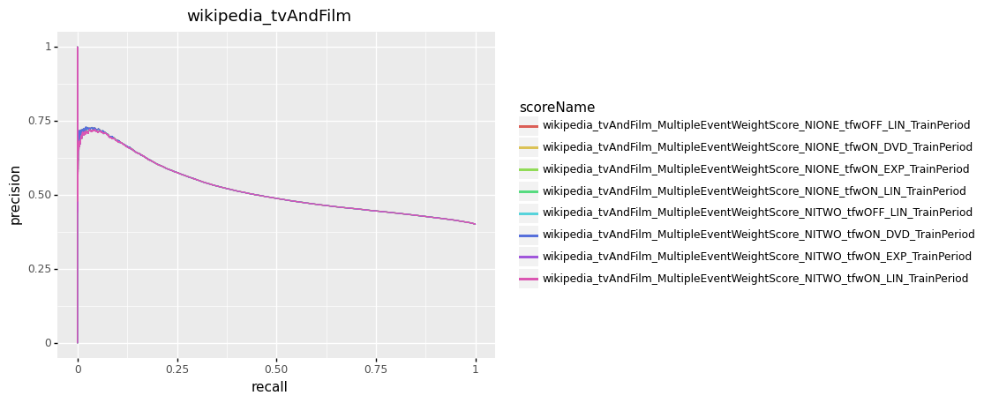

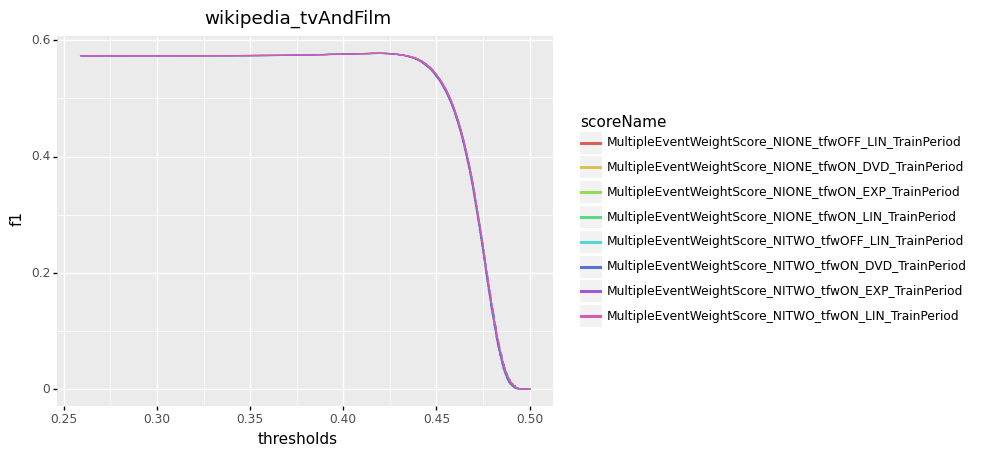

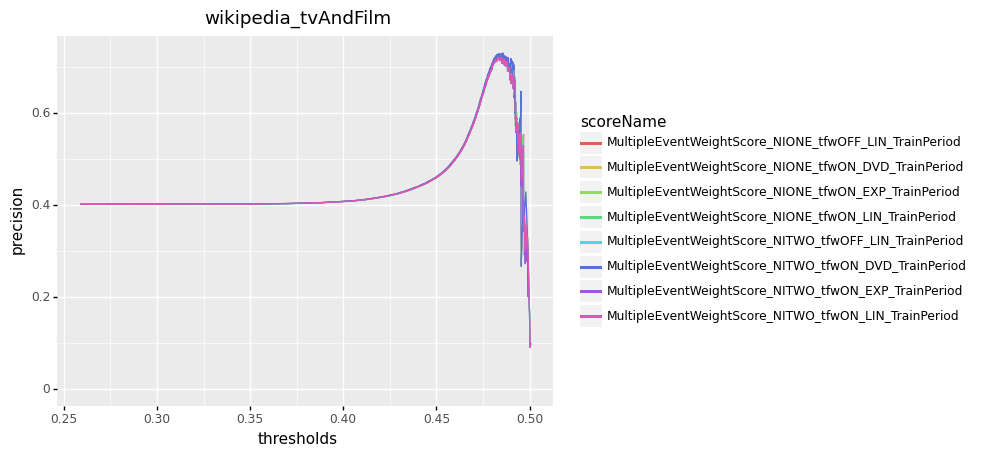

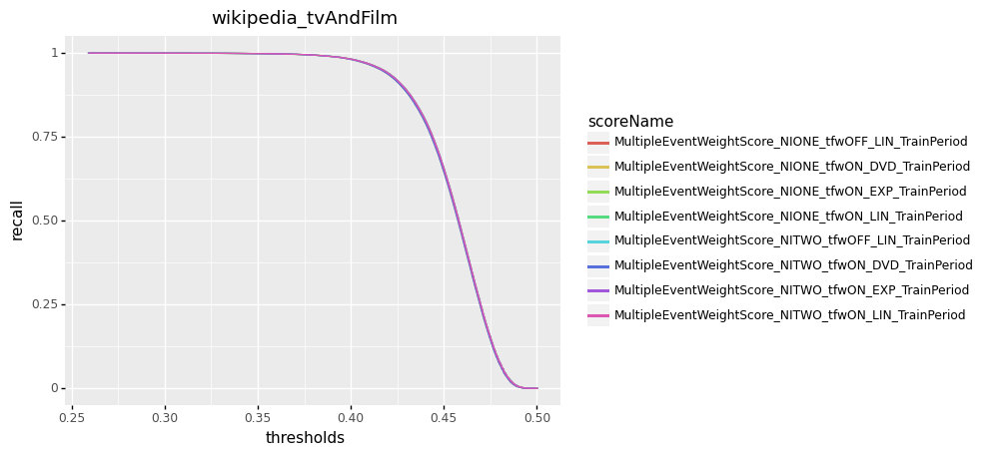


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.417931  0.577699   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.417725  0.577701   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.417755  0.577690   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.416782  0.577750   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.417931  0.577702   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.417725  0.577704   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.417726  0.577690   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.416782  0.577750   

   precision    recall  
0   0.415306  0.948636  
1   0.415309  0.948629  
2   0.415470  0.947730  
3   0.415411  0.948361  
4   0.415309  0.948636  
5   0.415312  0.948629  
6   0.415458  0.947798  
7   0.415411  0.948361  


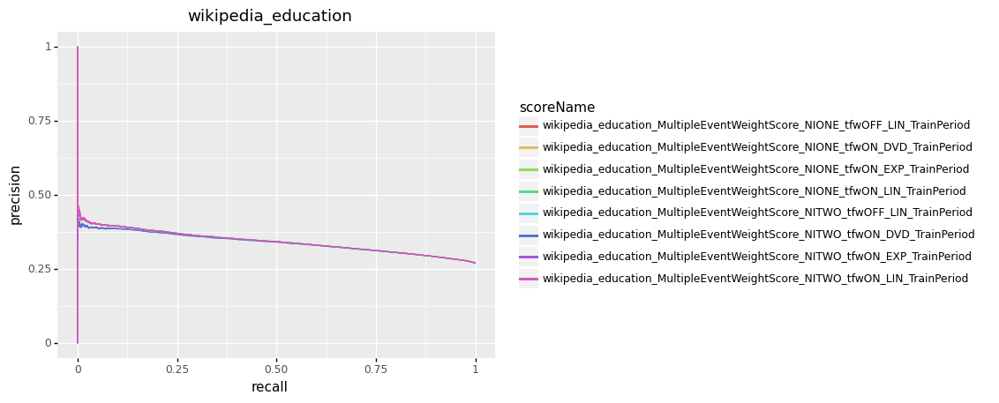

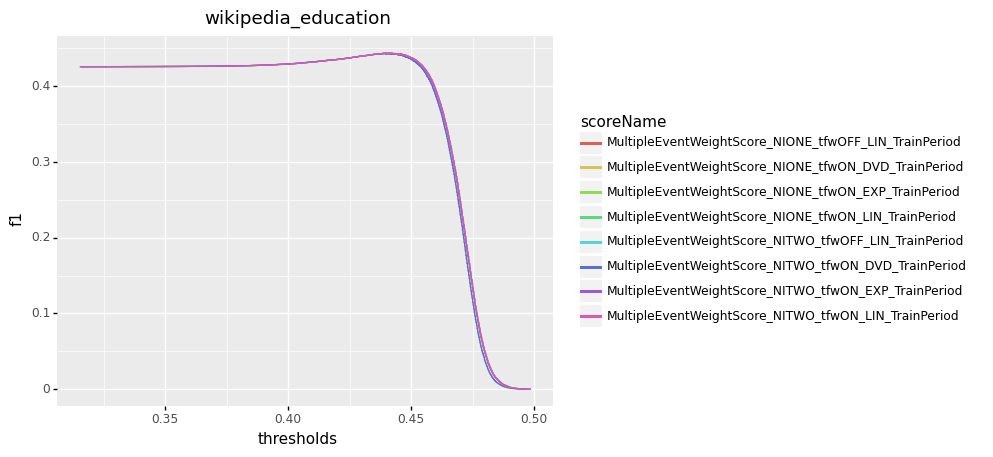

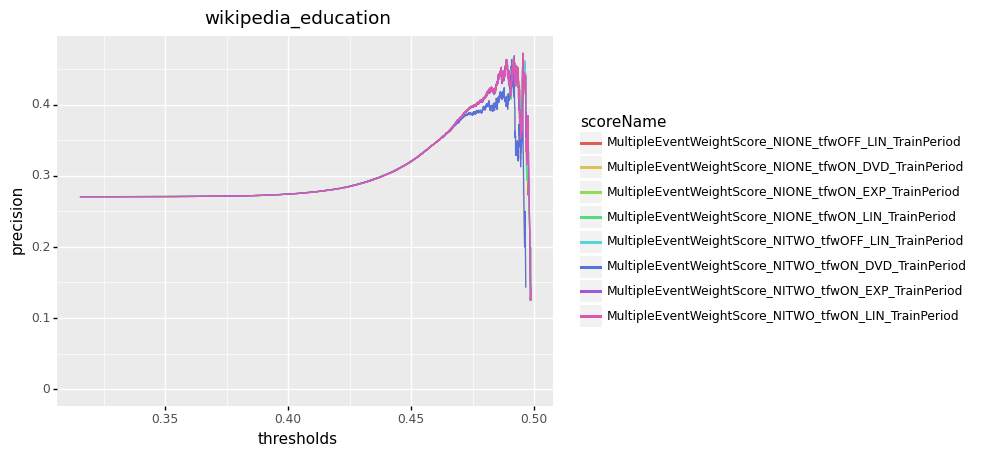

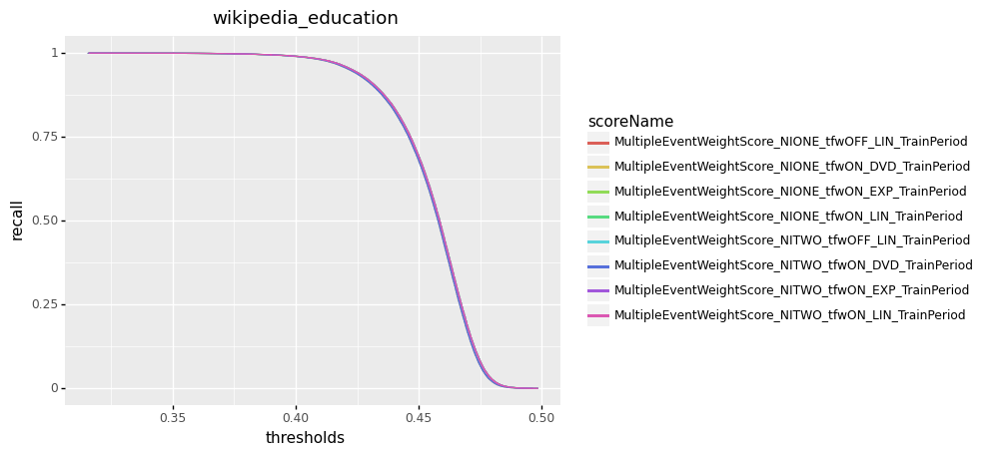


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.440000  0.443683   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.439770  0.443689   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.439794  0.443629   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.438851  0.443204   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.440000  0.443683   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.439770  0.443689   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.439794  0.443629   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.438851  0.443204   

   precision    recall  
0   0.301527  0.839443  
1   0.301523  0.839512  
2   0.301585  0.838605  
3   0.300790  0.841739  
4   0.301527  0.839443  
5   0.301523  0.839512  
6   0.301585  0.838605  
7   0.300790  0.841739  


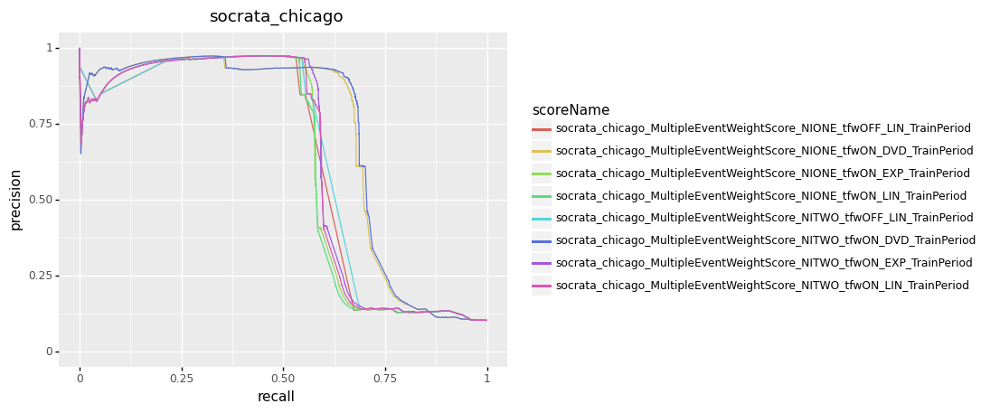

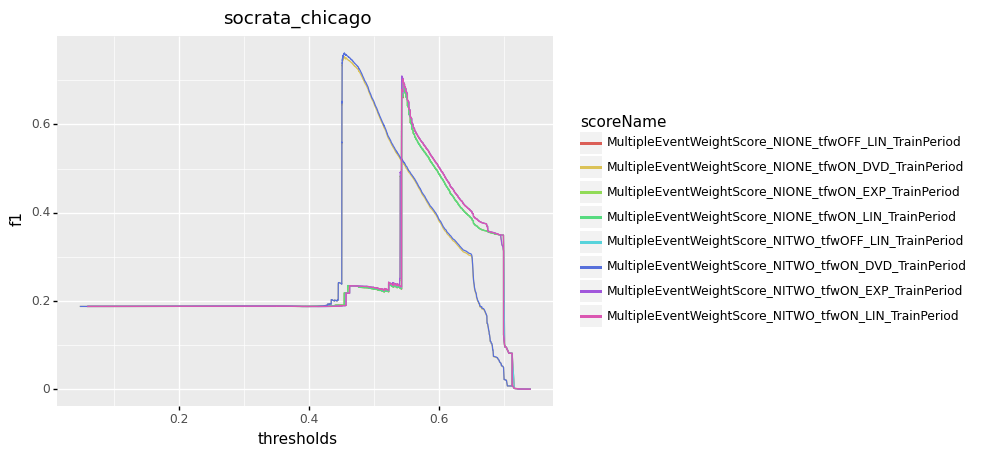

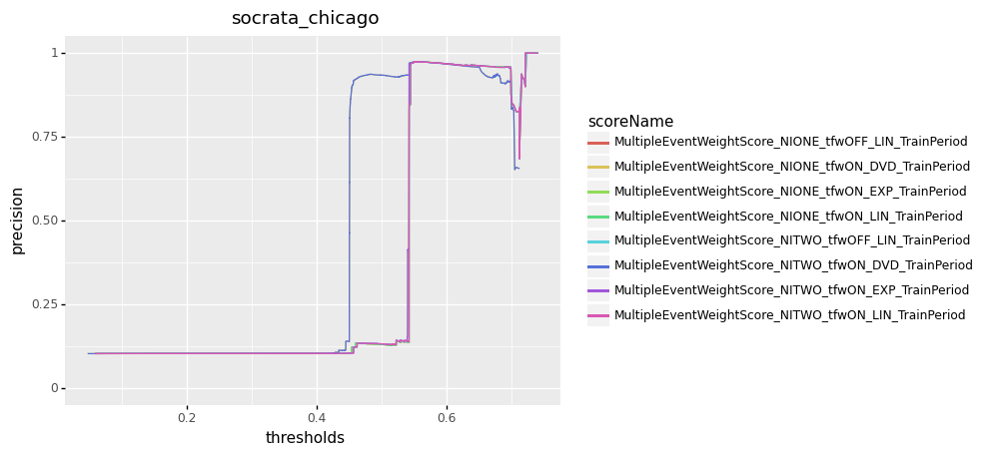

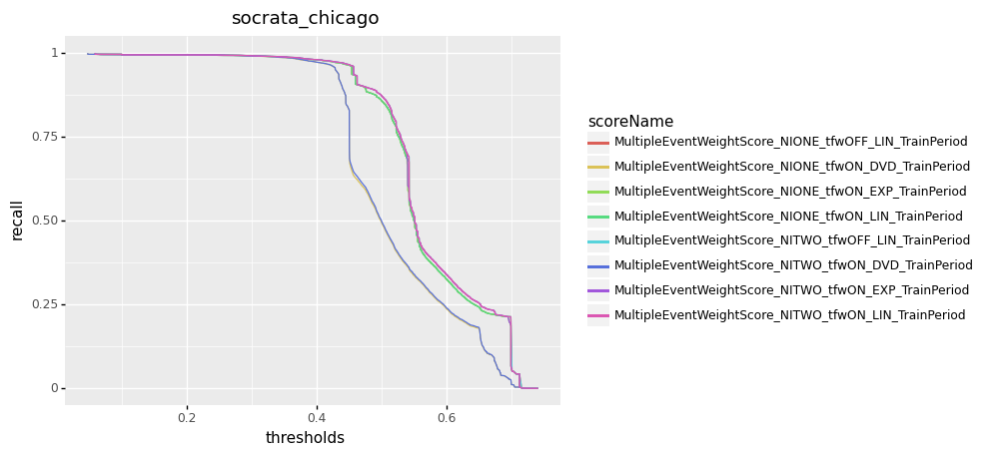


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.544751  0.697876   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.544744  0.703359   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.542971  0.709964   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.454273  0.761556   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.544751  0.686346   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.544744  0.691961   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.542971  0.698467   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.453984  0.753863   

   precision    recall  
0   0.968912  0.545330  
1   0.964724  0.553425  
2   0.964000  0.561893  
3   0.900697  0.659651  
4   0.969108  0.531320  
5   0.964807  0.539415  
6   0.964356  0.547509  
7   0.896993  0.650125  


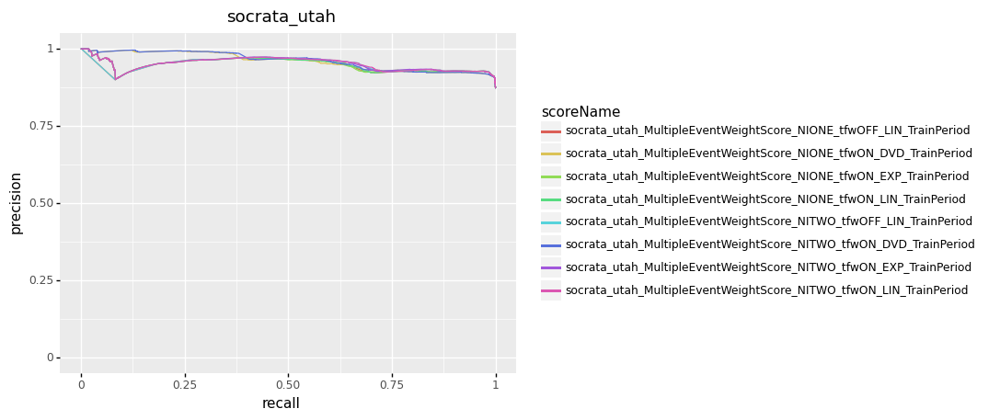

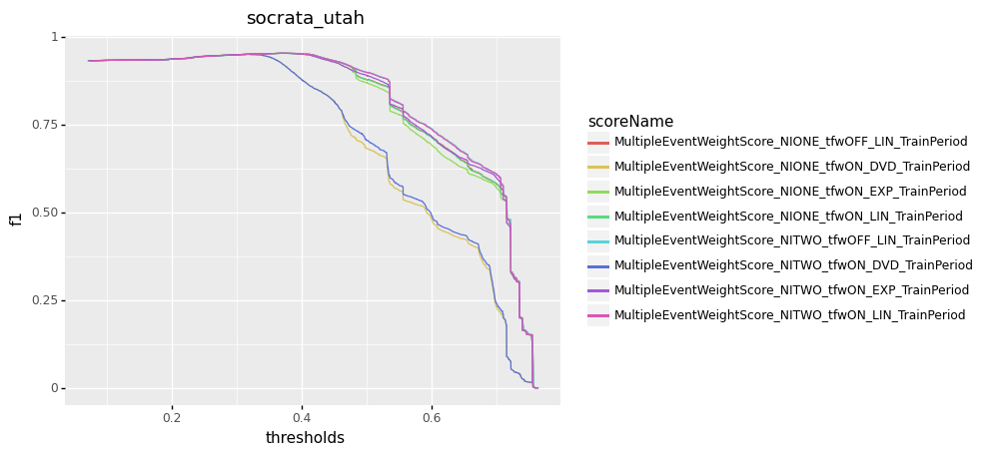

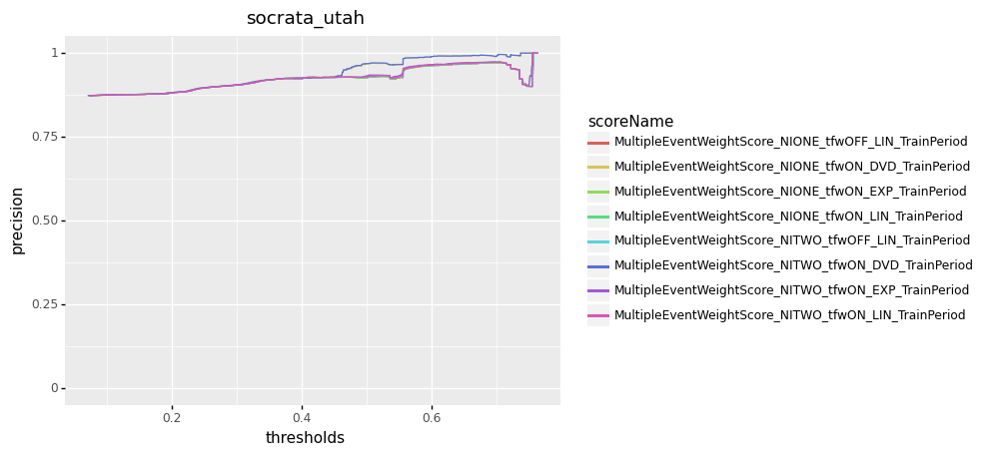

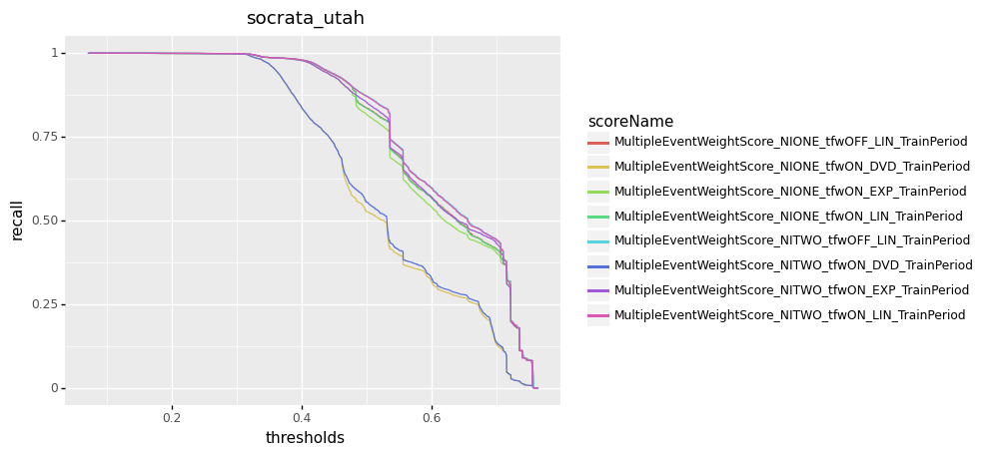


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.369061  0.953906   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.367846  0.953839   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.368486  0.953743   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.314746  0.951067   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.367956  0.953988   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.367846  0.953988   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.368486  0.953817   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.314746  0.951067   

   precision    recall  
0   0.924160  0.985631  
1   0.923892  0.985793  
2   0.924137  0.985308  
3   0.909774  0.996287  
4   0.924171  0.985793  
5   0.924171  0.985793  
6   0.924277  0.985308  
7   0.909774  0.996287  


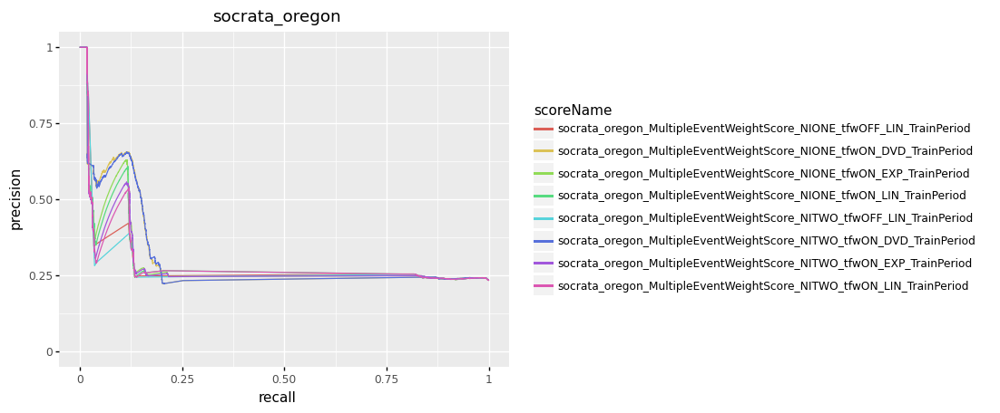

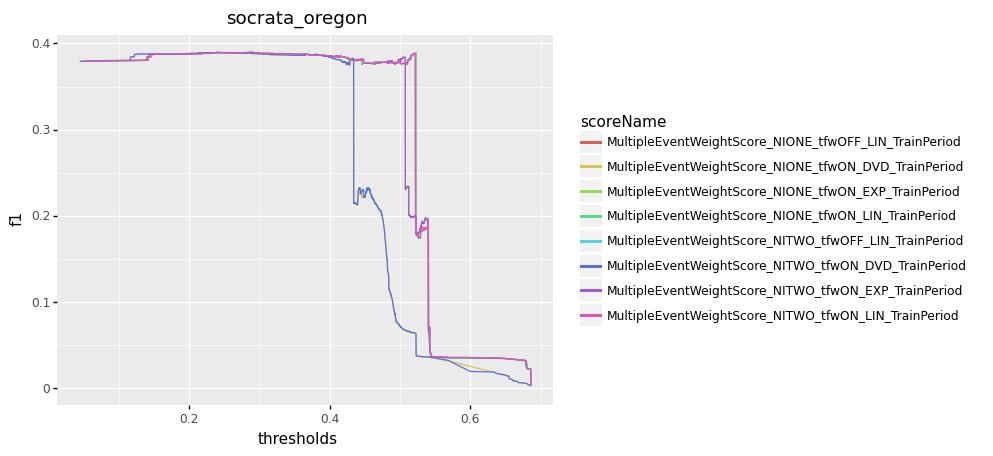

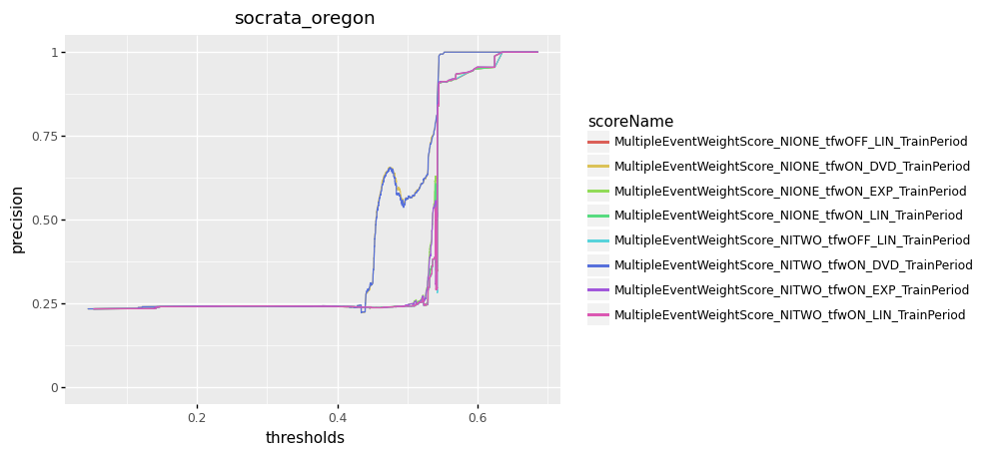

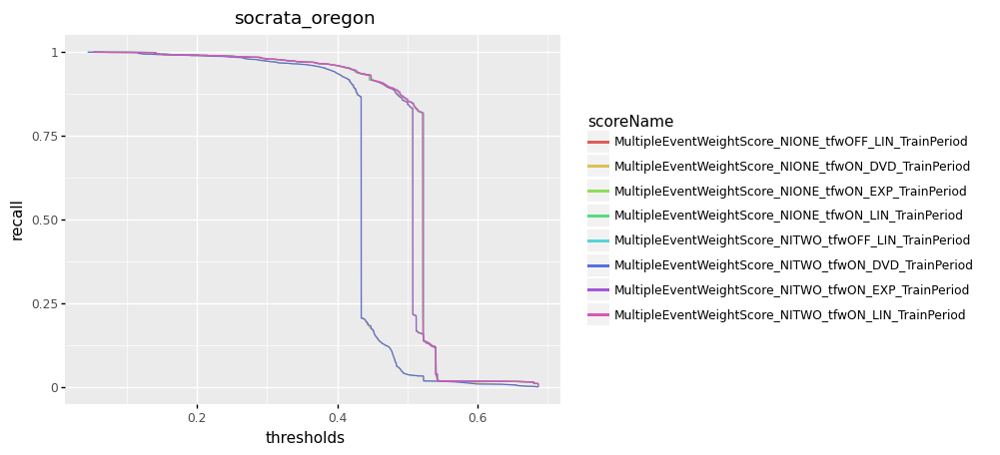


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.290608  0.389744   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.290530  0.389730   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.285426  0.389734   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.238705  0.389874   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.290608  0.389744   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.290530  0.389730   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.285426  0.389734   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.238705  0.389874   

   precision    recall  
0   0.242997  0.983963  
1   0.242974  0.984174  
2   0.242957  0.984490  
3   0.242906  0.987128  
4   0.242997  0.983963  
5   0.242974  0.984174  
6   0.242957  0.984490  
7   0.242906  0.987128  


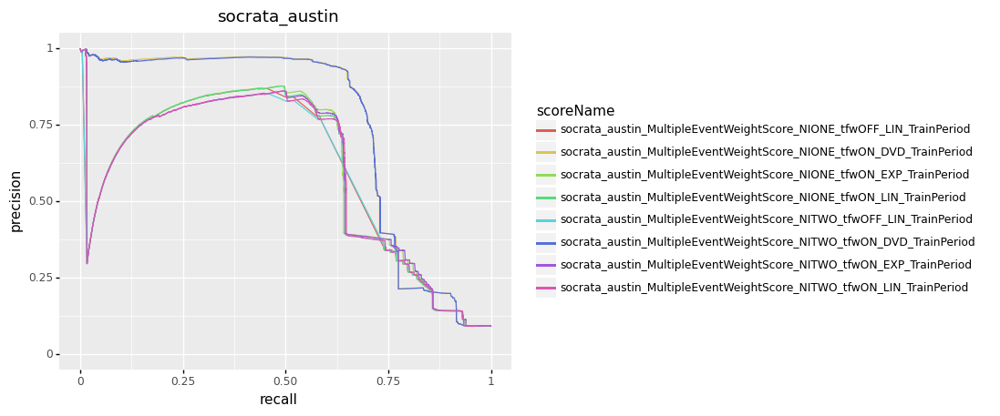

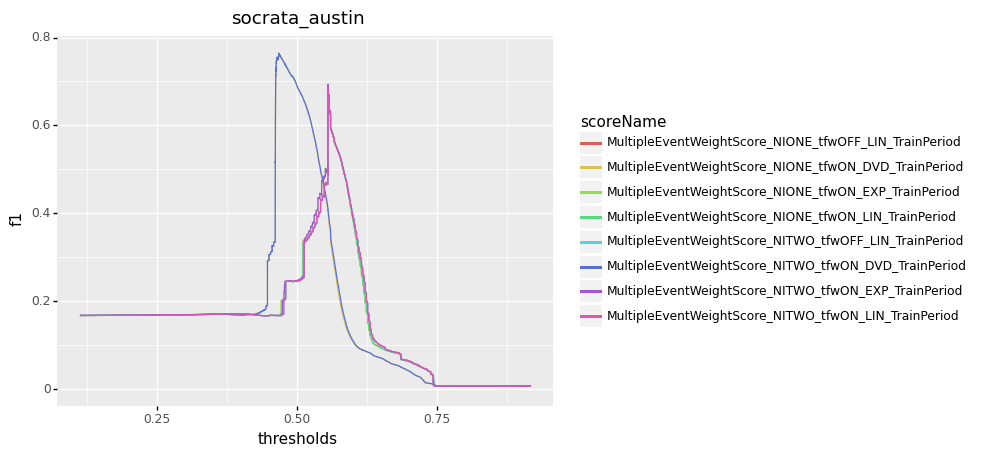

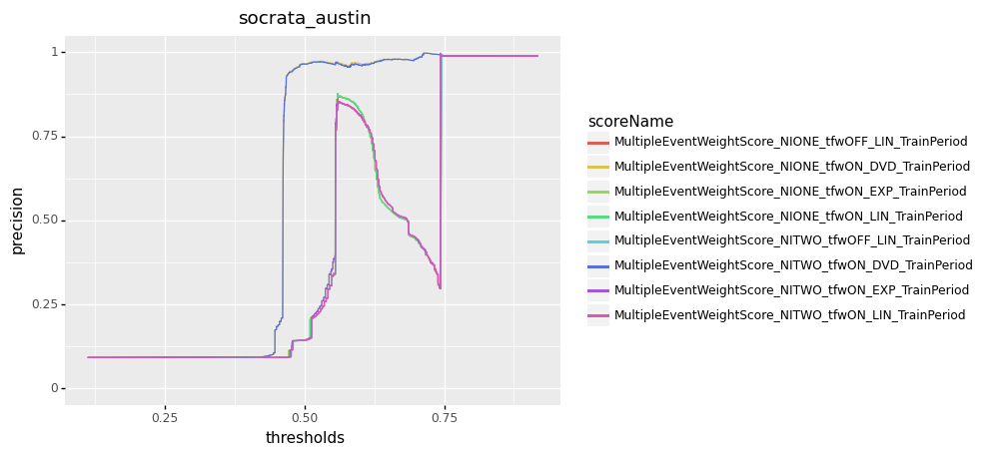

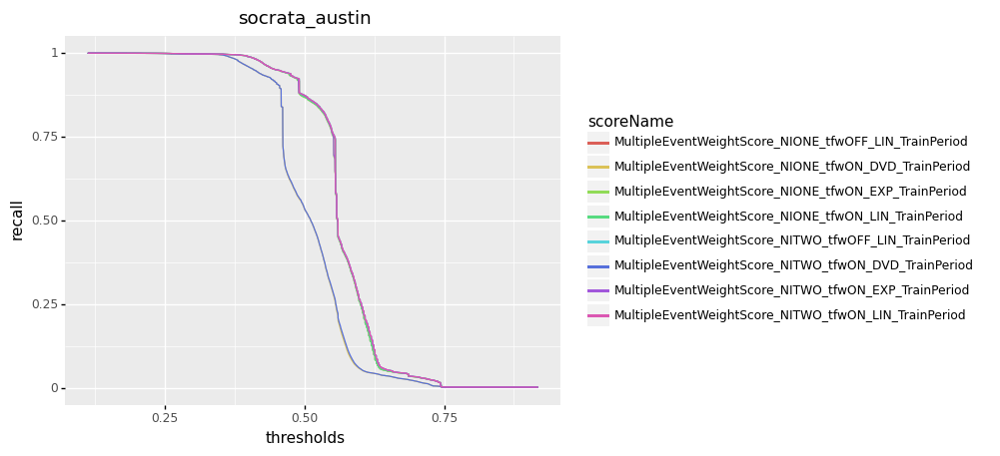


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.555801  0.665495   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.555799  0.687775   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.555765  0.692707   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.467535  0.764317   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.555801  0.666991   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.555799  0.689445   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.555765  0.694519   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.467535  0.763824   

   precision    recall  
0   0.769201  0.586431  
1   0.761981  0.626740  
2   0.779304  0.623430  
3   0.923752  0.651816  
4   0.780025  0.582570  
5   0.771941  0.622878  
6   0.789961  0.619654  
7   0.926596  0.649695  


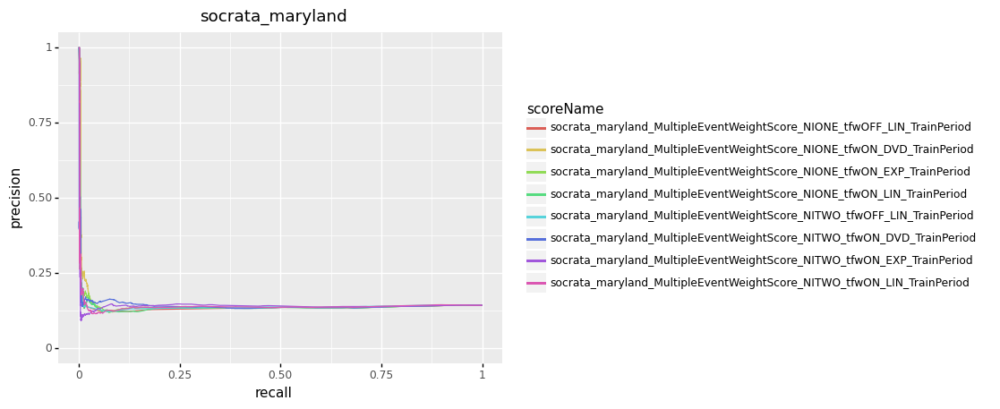

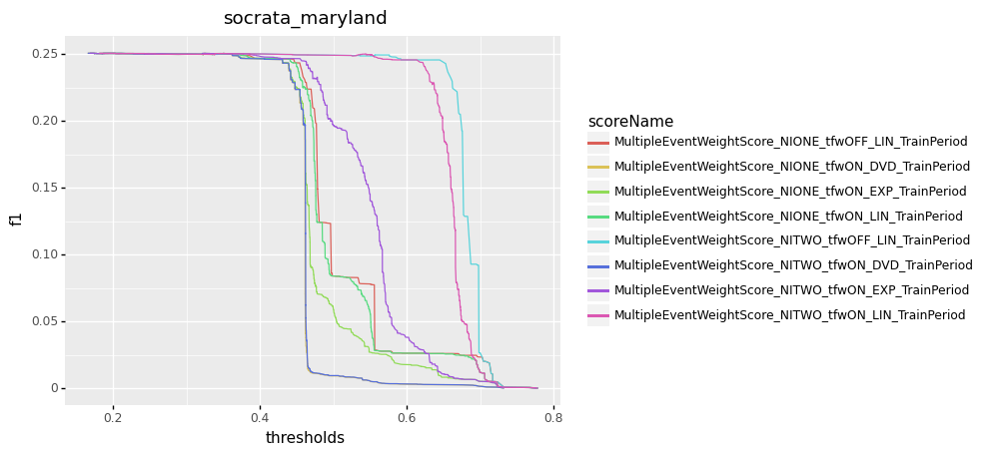

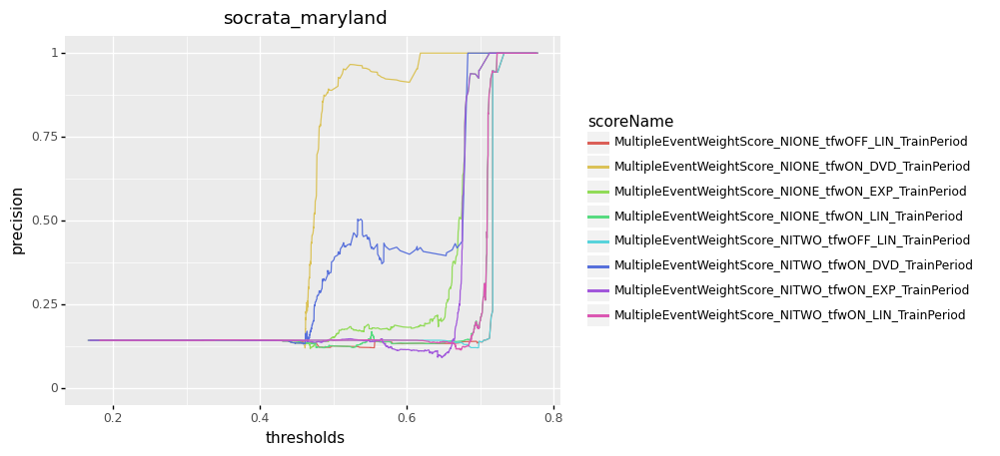

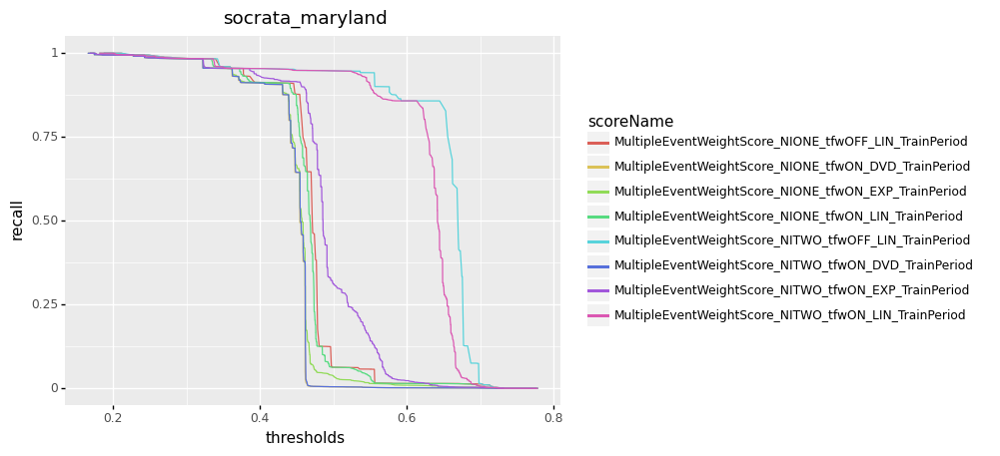


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.186740  0.250737   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.201442  0.250758   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.325043  0.250779   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.174065  0.250756   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.186740  0.250737   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.201442  0.250758   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.325043  0.250779   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.174065  0.250756   

   precision    recall  
0   0.143340  0.999927  
1   0.143368  0.999267  
2   0.144267  0.958245  
3   0.143365  0.999341  
4   0.143340  0.999927  
5   0.143368  0.999267  
6   0.144267  0.958245  
7   0.143365  0.999341  


In [12]:
def comparePrCurves(truthLabel,predScores,datasetNames):
    finalDf = pd.DataFrame()
    for dsName in  datasetNames:
        dfForThisDs = df[df['dataset']==dsName]
        for predScore in predScores:
            dfForThisDsAndScore = dfForThisDs[dfForThisDs[predScore].notnull()]
            #dfForThisDsAndScore.replace([np.inf, -np.inf], np.nan, inplace=True)
            #dfForThisDsAndScore.replace([np.inf, -np.inf], np.nan, inplace=True).dropna(subset=[predScore], how="all")
            y_test = dfForThisDsAndScore[truthLabel]
            y_pred = dfForThisDsAndScore[predScore]
            precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
            d = {'precision': precision, 'recall': recall}
            prdf = pd.DataFrame(data=d)
            prdf['scoreName'] = dsName + '_' + predScore
            finalDf = finalDf.append(prdf)
    return ggplot(finalDf, aes(x='recall',ymin=0, y='precision',group='scoreName',color='scoreName')) + geom_line() + labs(title=dsName)

def compareF1Curves(truthLabel,predScores,datasetNames):
    finalDf = pd.DataFrame()
    #f1Df = pd.DataFrame()
    rows_listF1 = []
    for dsName in  datasetNames:
        dfForThisDs = df[df['dataset']==dsName]
        for predScore in predScores:
            dfForThisDsAndScore = dfForThisDs[dfForThisDs[predScore].notnull()]
            y_test = dfForThisDsAndScore[truthLabel]
            y_pred = dfForThisDsAndScore[predScore]
            scoreName = predScore
            precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
            indices = (precision !=0) | (recall!=0)
            precision = precision[indices]
            recall = recall[indices]
            thresholds = thresholds[indices[0:len(indices)-1]]
            f1_scores = 2*recall*precision/(recall+precision)
            f1_scores=avgEvidencePerEdge[0:len(f1_scores)-1]
            bestThresholdIndex=np.argmax(f1_scores)
            precision=precision[0:len(precision)-1]
            recall=recall[0:len(recall)-1]
            pd.DataFrame(data=f1_scores).describe()
            dict1 = {"scoreName": scoreName, 
                     "bestThreshold": thresholds[bestThresholdIndex],
                     "best_F1":f1_scores[bestThresholdIndex],#np.max(f1_scores),
                     "precision":precision[bestThresholdIndex],
                     "recall":recall[bestThresholdIndex]}
            rows_listF1.append(dict1)
            d = {'thresholds': thresholds, 'f1': f1_scores,'precision': precision, 'recall': recall}
            prdf = pd.DataFrame(data=d)
            prdf['scoreName'] = scoreName
            finalDf = finalDf.append(prdf)
    f1Df = pd.DataFrame(rows_listF1)
    print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='f1',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName)) 
    print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='precision',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName))  
    print(ggplot(finalDf, aes(x='thresholds',ymin=0, y='recall',group='scoreName',color='scoreName')) + geom_line()+ labs(title=dsName)) 
    return f1Df

#scoreNames = df.columns[4:13]
#scoreNames.delete('MultipleEventWeightScore_TrainPeriod.1')
#scoreNames.delete('MultipleEventWeightScore_TrainPeriod.2')
#print(scoreNames)

scoreNames = pd.array(['MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod', 
                       'MultipleEventWeightScore_NITWO_tfwON_LIN_TrainPeriod',
                       'MultipleEventWeightScore_NITWO_tfwON_EXP_TrainPeriod',
                       'MultipleEventWeightScore_NITWO_tfwON_DVD_TrainPeriod',
                       'MultipleEventWeightScore_NIONE_tfwOFF_LIN_TrainPeriod',
                       'MultipleEventWeightScore_NIONE_tfwON_LIN_TrainPeriod',
                      'MultipleEventWeightScore_NIONE_tfwON_EXP_TrainPeriod',
                      'MultipleEventWeightScore_NIONE_tfwON_DVD_TrainPeriod'], dtype="string")
truthLabel='remainsValid'
datasetNames = df.dataset.unique()
#datasetNames = ['socrata_maryland','socrata_austin']
#pd.set_option('display.max_colwidth', None)
pd.reset_option('display.max_colwidth')
for dsName in datasetNames:
    dsNames = [dsName]
    print(comparePrCurves(truthLabel,scoreNames,dsNames))
    dfF1 = compareF1Curves(truthLabel,scoreNames,dsNames)
    print(dfF1)
#socrataNameArray=pd.array(['socrata_chicago'], dtype="string")
#wikipediaNameArray=pd.array(['wikipedia'], dtype="string")
#print(comparePrCurves(truthLabel,scoreNames,wikipediaNameArray))
#print(compareF1Curves(truthLabel,scoreNames,wikipediaNameArray))
#print(comparePrCurves(truthLabel,scoreNames,socrataNameArray))
#print(compareF1Curves(truthLabel,scoreNames,socrataNameArray))

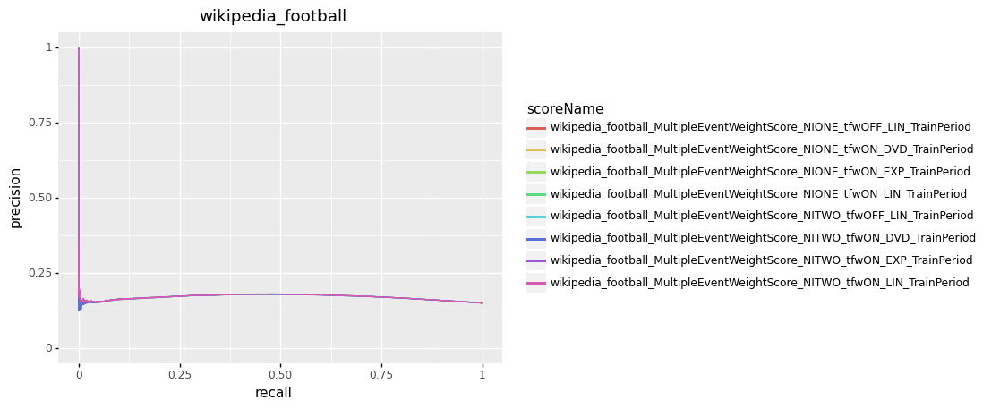

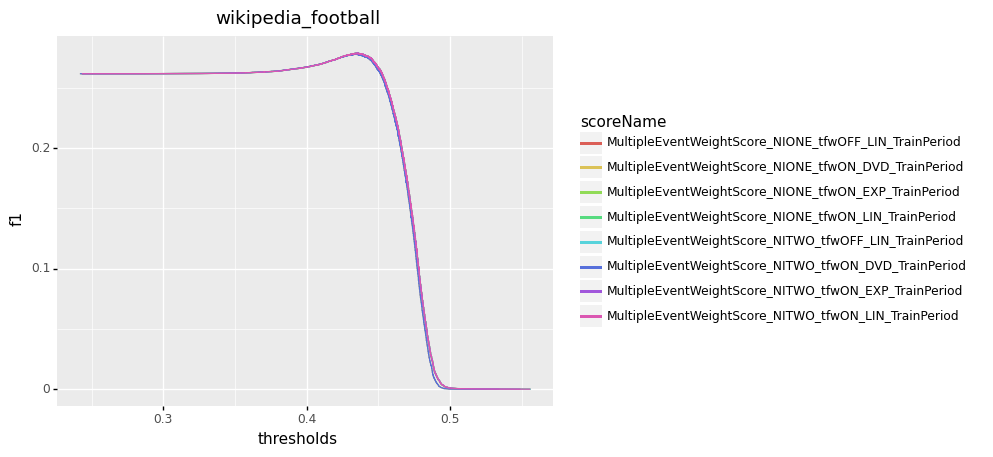

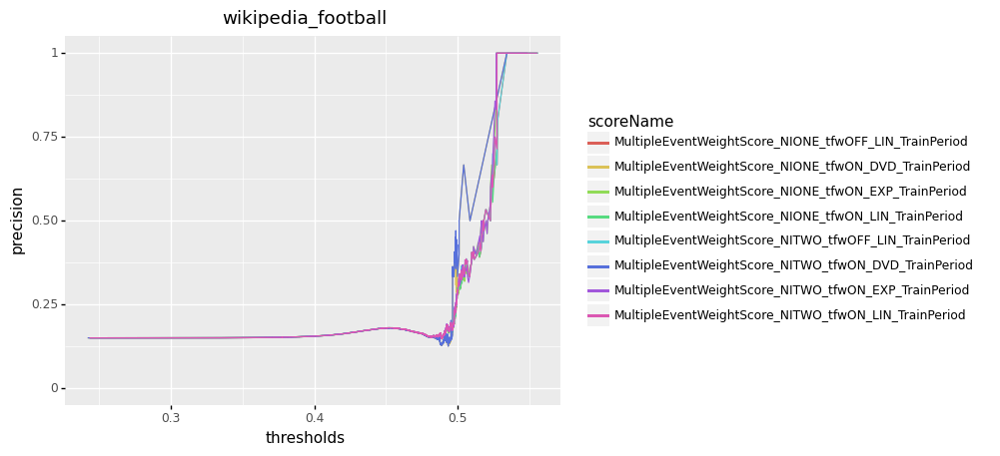

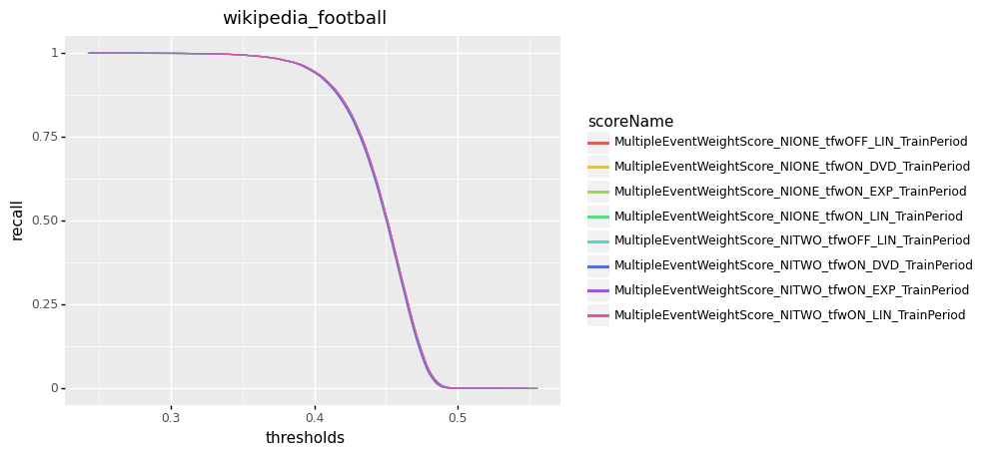


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.434253  0.278618   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.434465  0.278672   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.434390  0.278730   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.434023  0.278053   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.434253  0.278617   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.434465  0.278670   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.434390  0.278729   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.434023  0.278053   

   precision    recall  
0   0.171801  0.736608  
1   0.171859  0.736276  
2   0.171942  0.735584  
3   0.171746  0.729757  
4   0.171800  0.736592  
5   0.171859  0.736261  
6   0.171941  0.735569  
7   0.171746  0.729757  


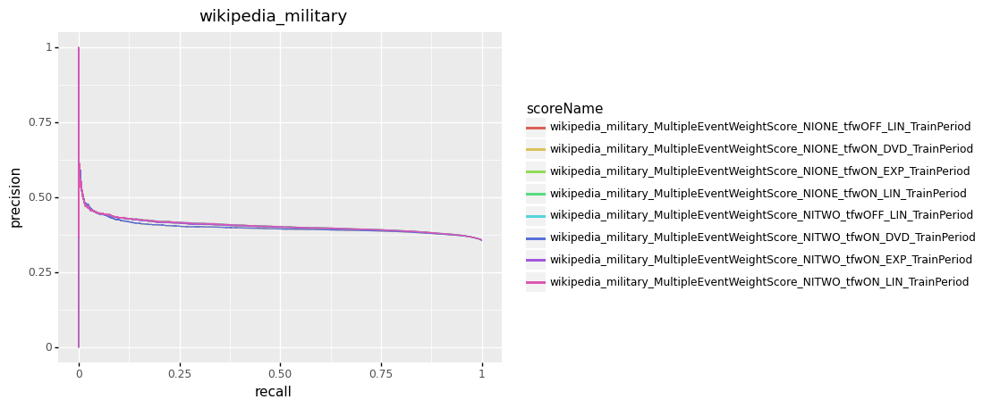

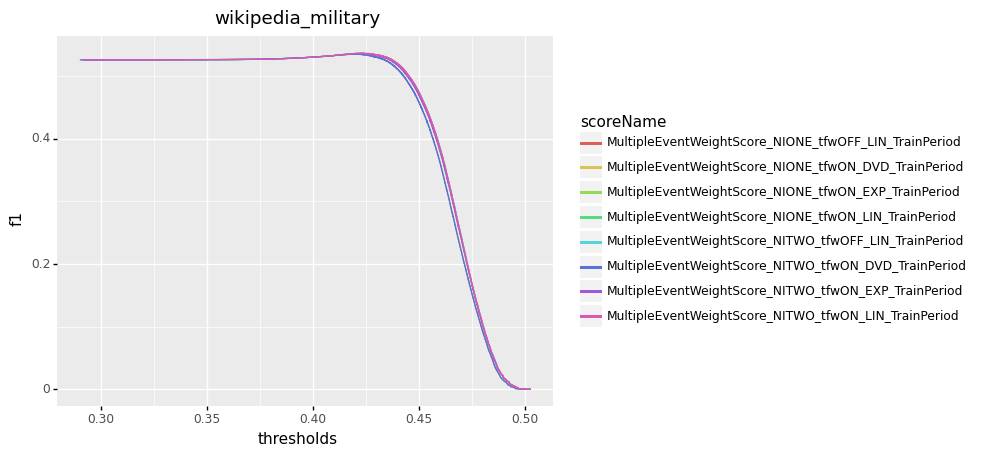

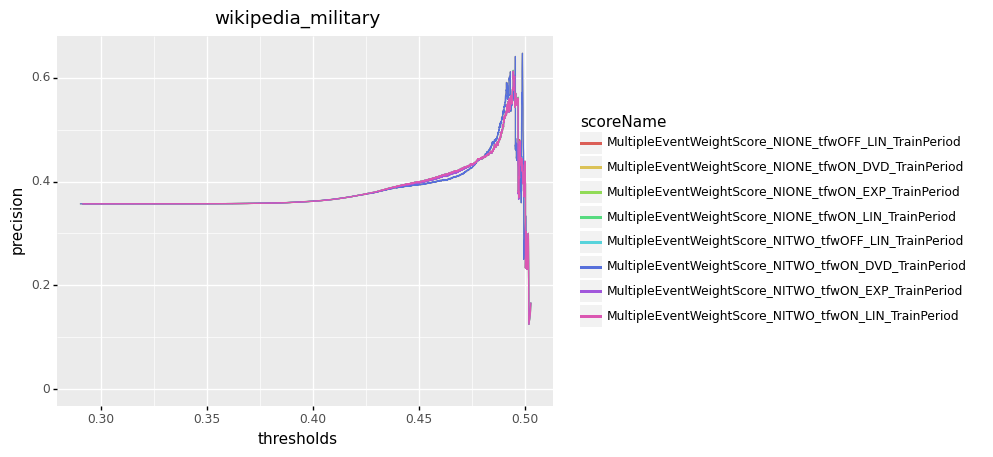

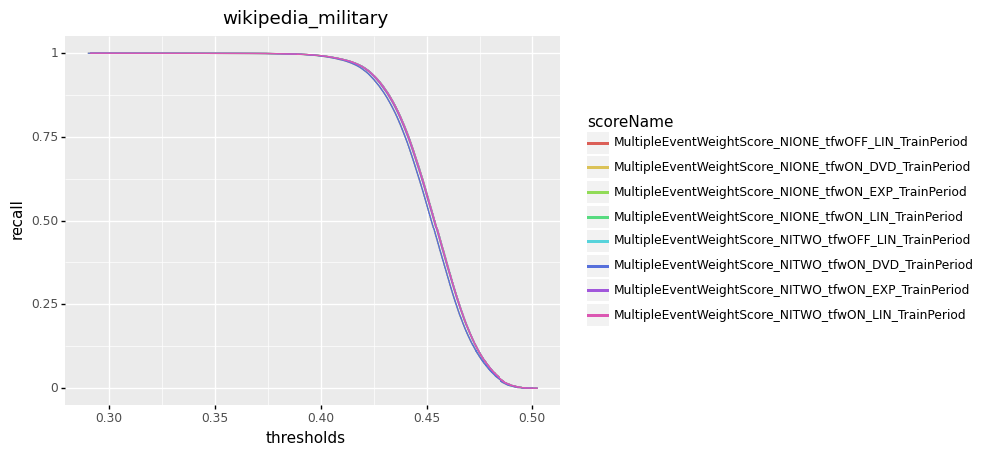


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.422759  0.536762   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.422590  0.536750   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.422533  0.536164   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.421380  0.535219   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.422759  0.536762   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.422590  0.536750   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.422533  0.536164   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.421380  0.535219   

   precision    recall  
0   0.374416  0.947665  
1   0.374404  0.947671  
2   0.374152  0.945633  
3   0.373336  0.944970  
4   0.374416  0.947665  
5   0.374404  0.947671  
6   0.374152  0.945633  
7   0.373336  0.944970  


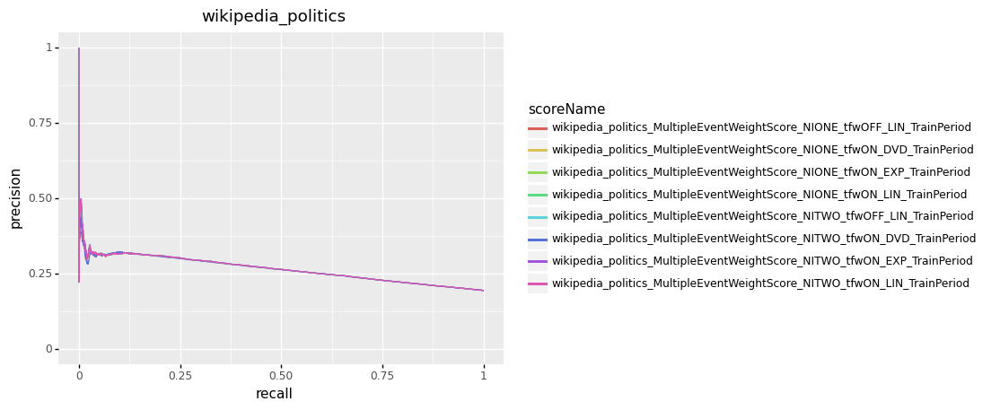

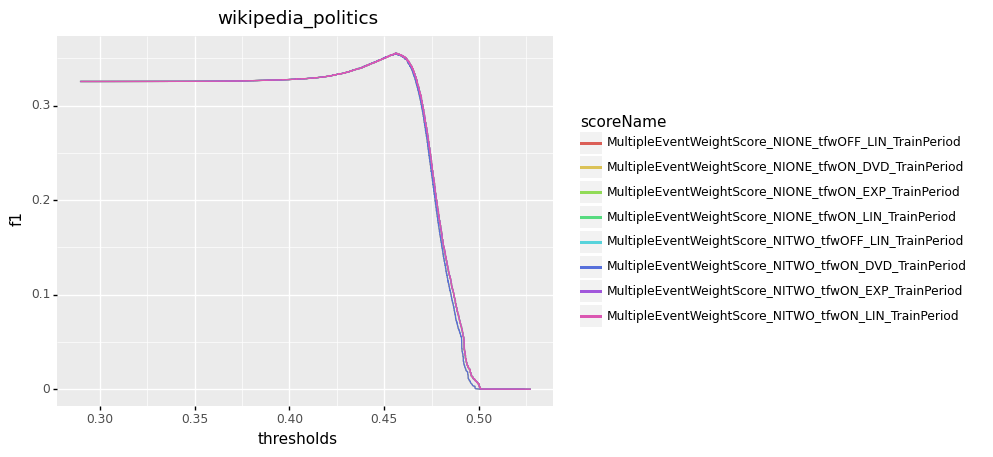

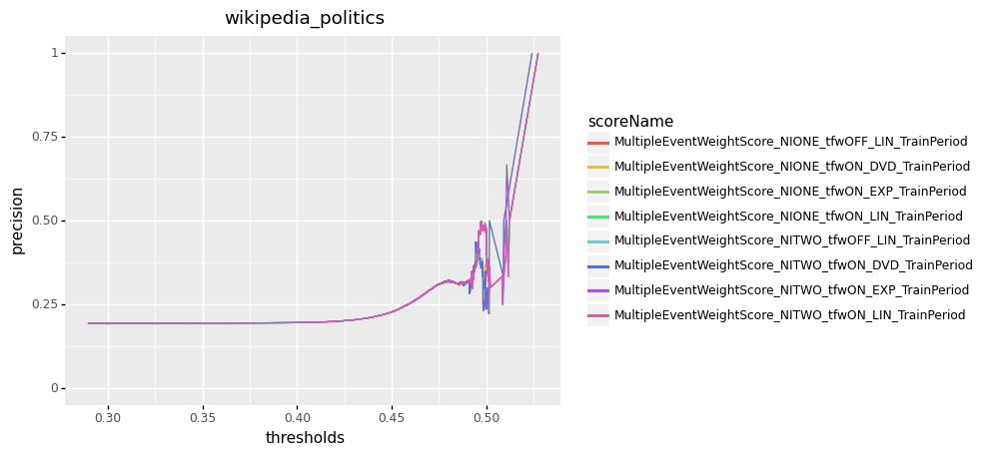

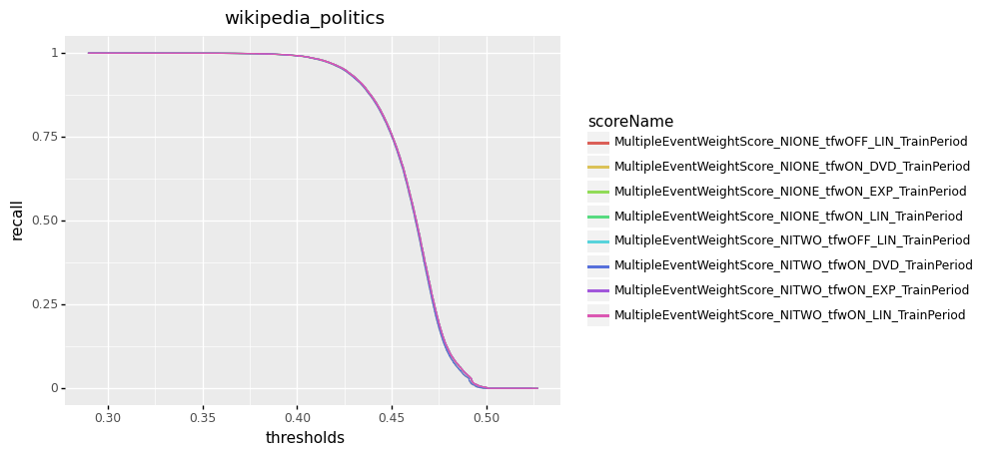


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.456092  0.355275   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.456317  0.355317   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.456231  0.355318   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.455862  0.355154   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.456092  0.355296   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.456317  0.355323   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.456231  0.355324   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.455862  0.355154   

   precision    recall  
0   0.242911  0.661066  
1   0.243602  0.656287  
2   0.243600  0.656307  
3   0.243653  0.654810  
4   0.242936  0.661025  
5   0.243616  0.656225  
6   0.243615  0.656246  
7   0.243653  0.654810  


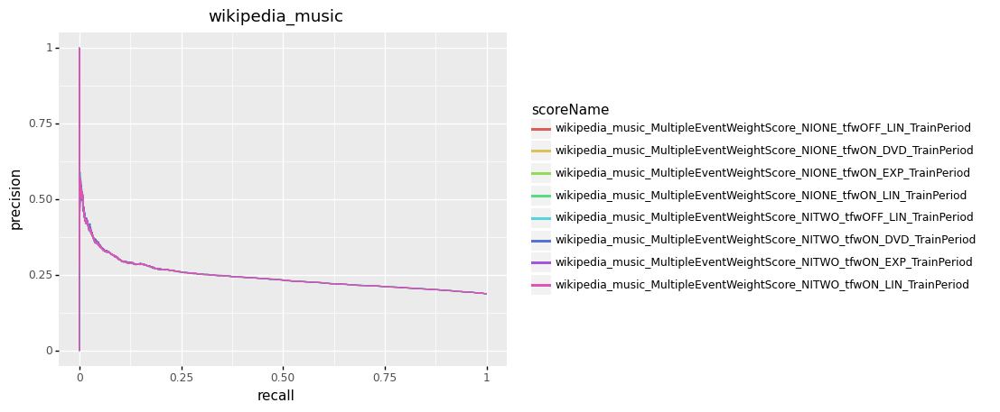

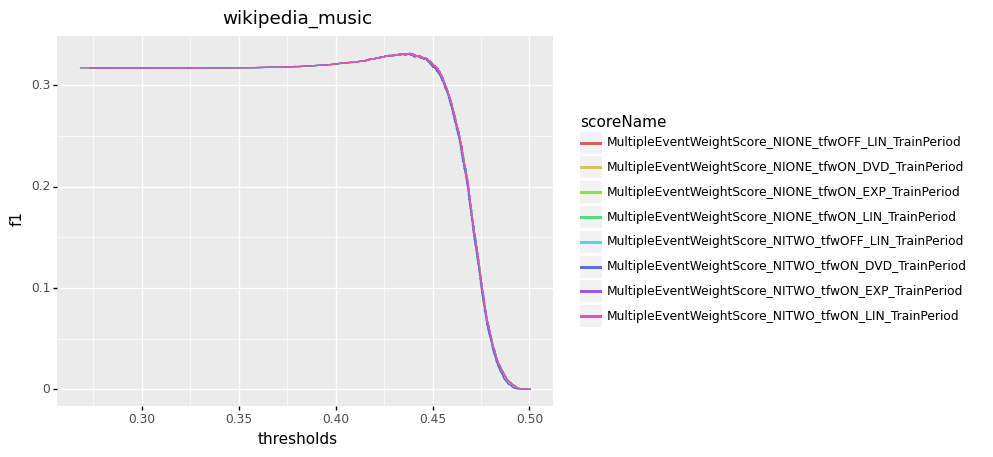

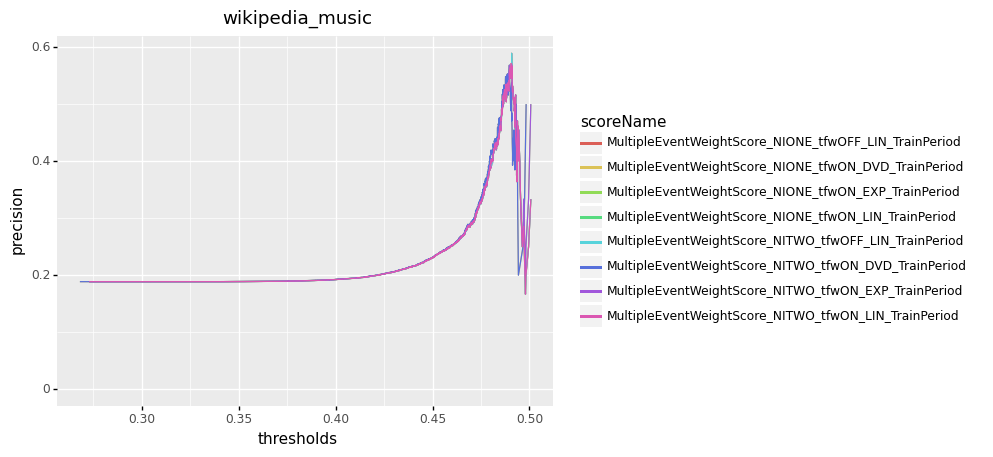

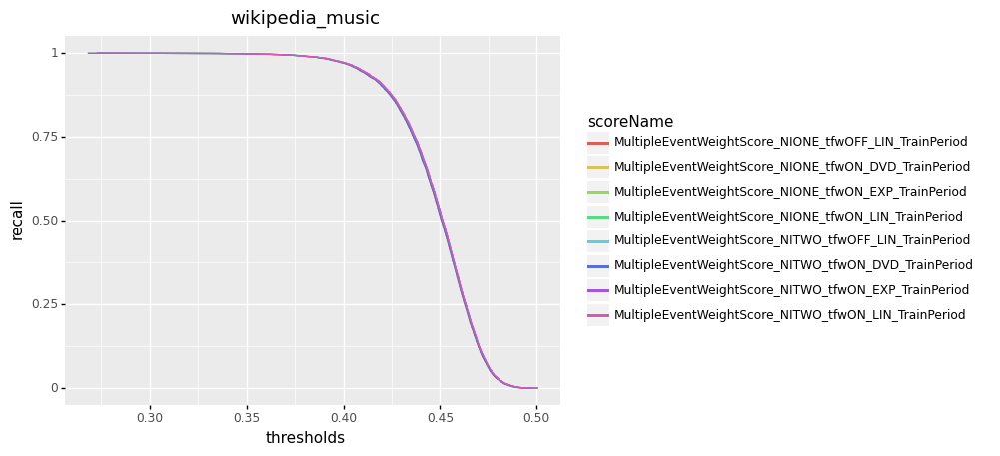


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.438391  0.331724   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.438384  0.331832   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.438277  0.331869   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.437931  0.331157   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.438391  0.331724   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.438384  0.331832   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.438277  0.331869   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.437931  0.331157   

   precision    recall  
0   0.214176  0.735267  
1   0.214287  0.735011  
2   0.214341  0.734755  
3   0.214243  0.728955  
4   0.214176  0.735267  
5   0.214287  0.735011  
6   0.214341  0.734755  
7   0.214243  0.728955  


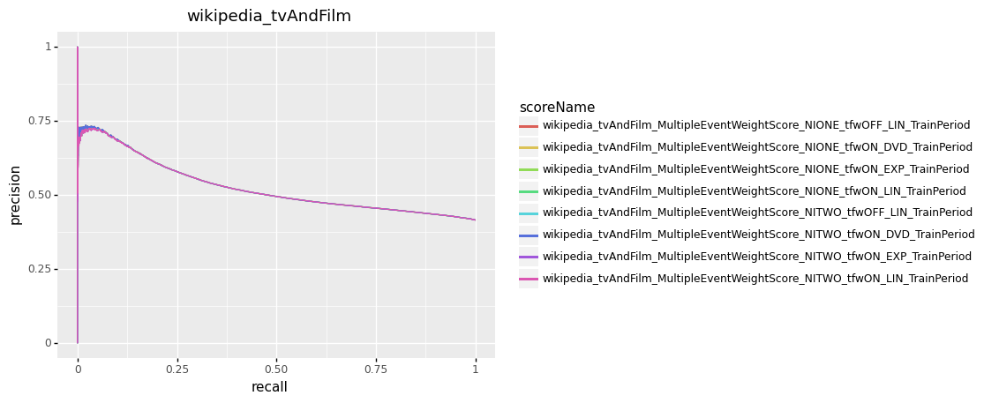

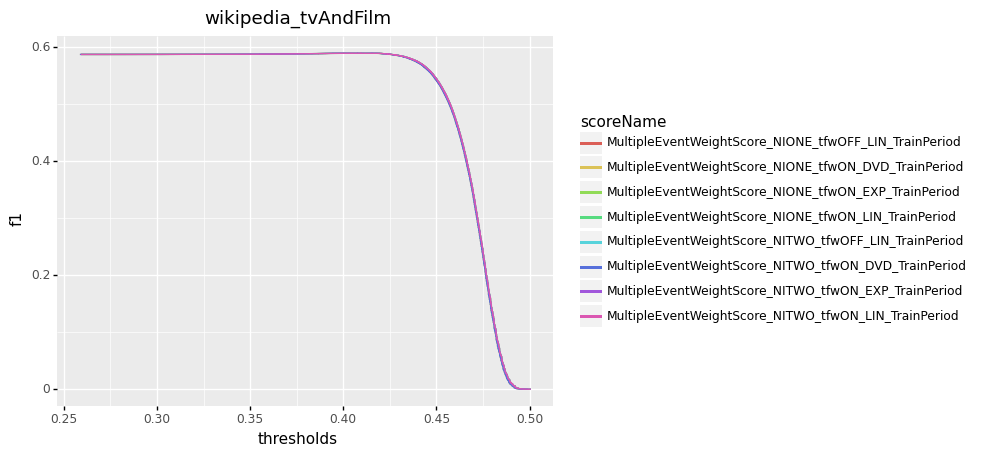

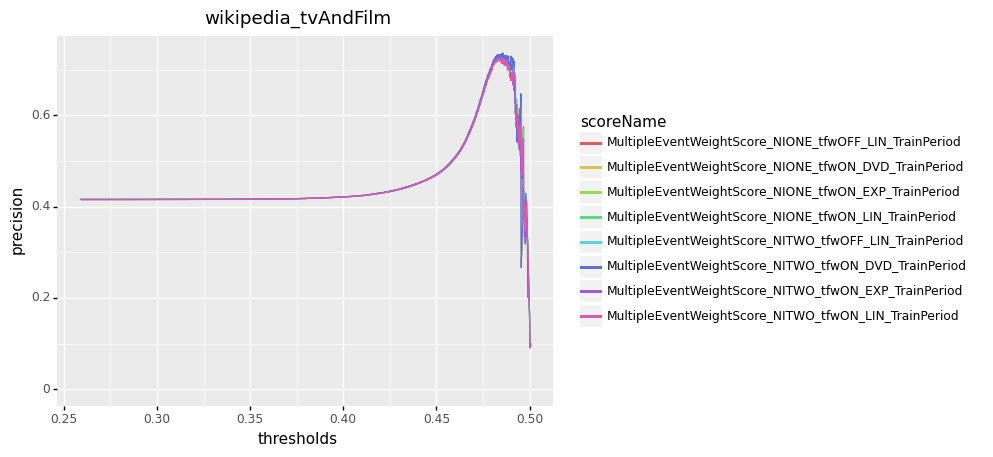

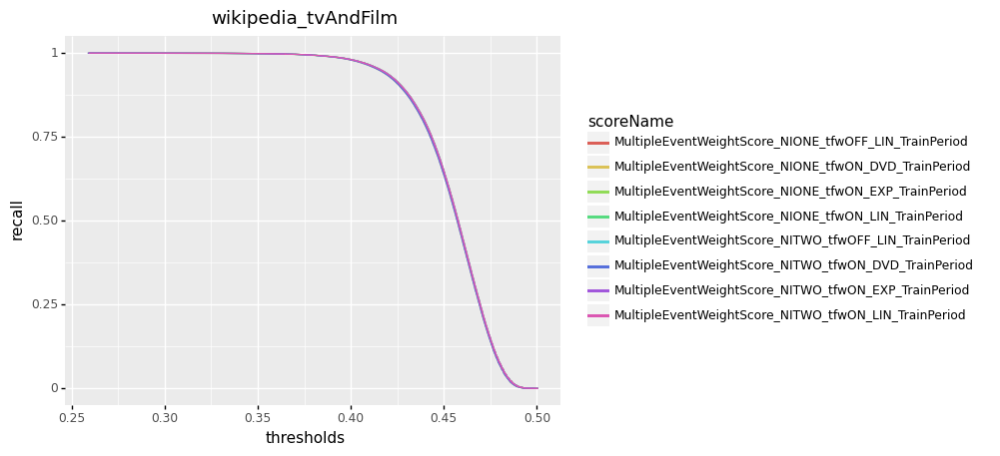


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.400460  0.589242   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.400914  0.589257   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.402764  0.589260   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.400230  0.589259   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.400460  0.589242   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.400914  0.589257   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.402764  0.589260   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.400230  0.589259   

   precision    recall  
0   0.421127  0.980765  
1   0.421269  0.980078  
2   0.421786  0.977309  
3   0.421409  0.979332  
4   0.421127  0.980765  
5   0.421269  0.980078  
6   0.421786  0.977309  
7   0.421409  0.979332  


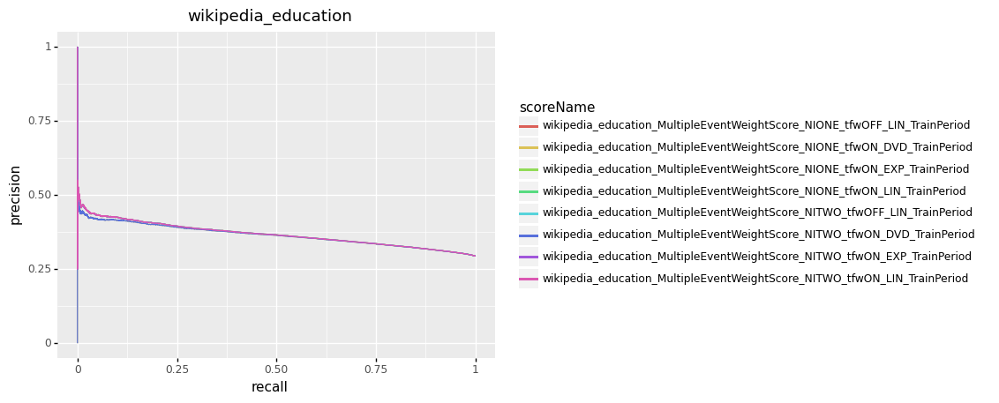

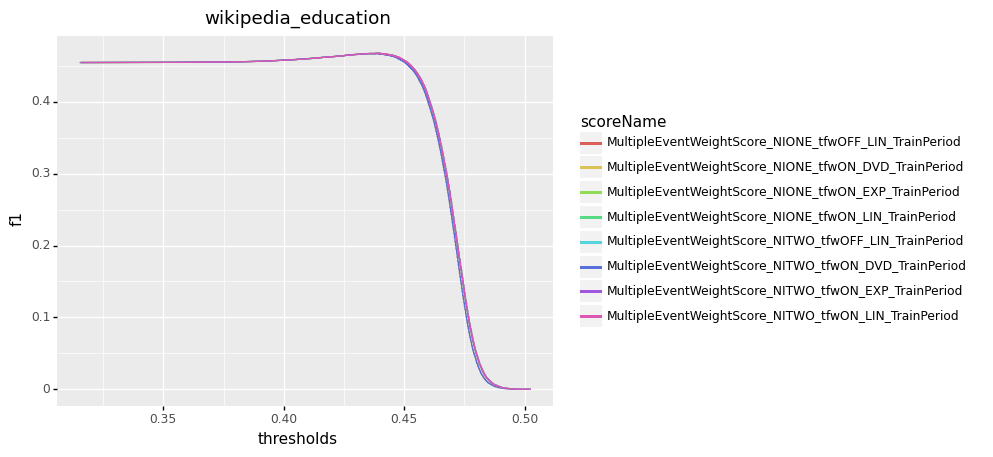

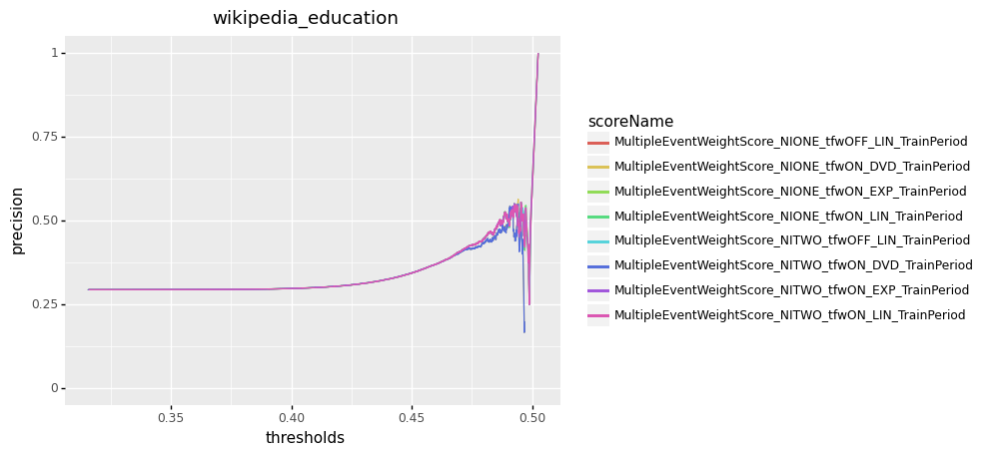

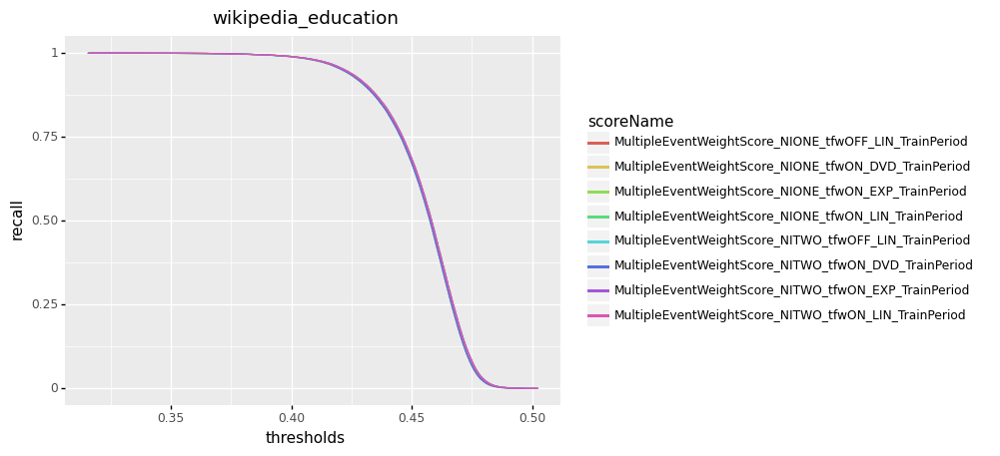


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.439080  0.467654   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.439018  0.467652   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.438851  0.467586   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.438851  0.467193   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.439080  0.467654   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.439018  0.467652   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.438851  0.467586   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.438851  0.467193   

   precision    recall  
0   0.323759  0.841788  
1   0.323747  0.841860  
2   0.323804  0.841044  
3   0.324377  0.834691  
4   0.323759  0.841788  
5   0.323747  0.841860  
6   0.323804  0.841044  
7   0.324377  0.834691  


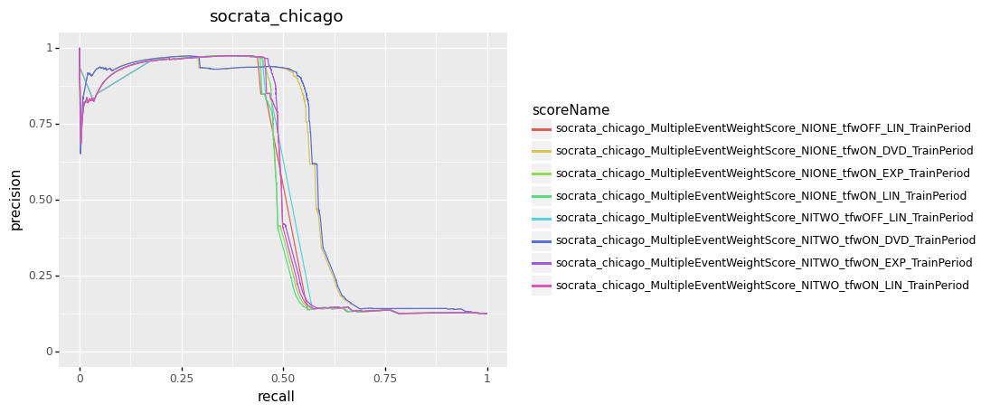

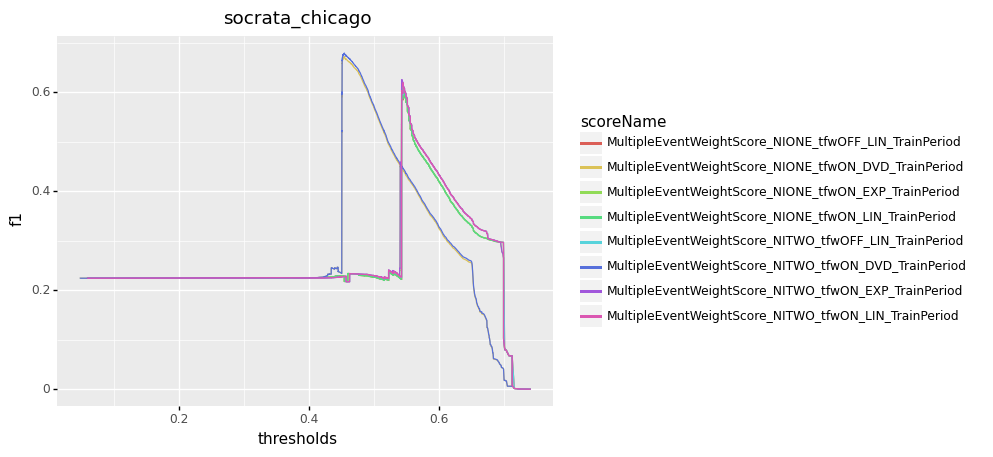

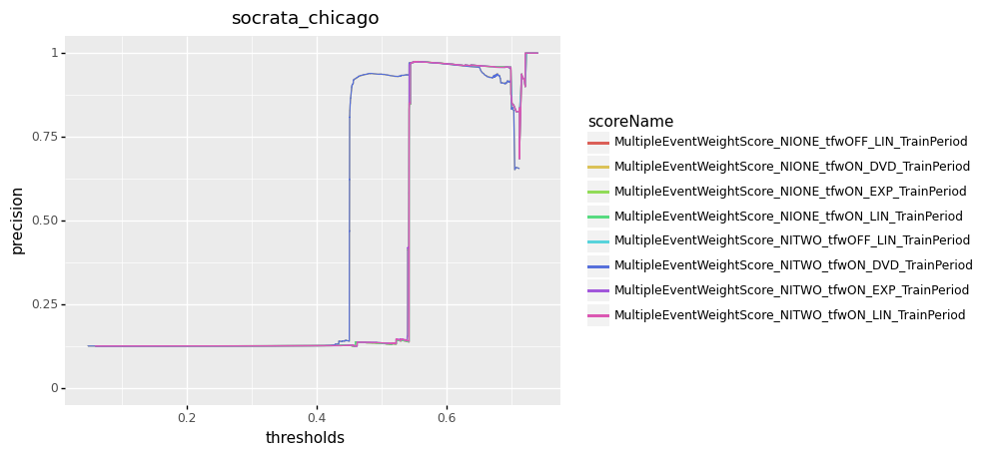

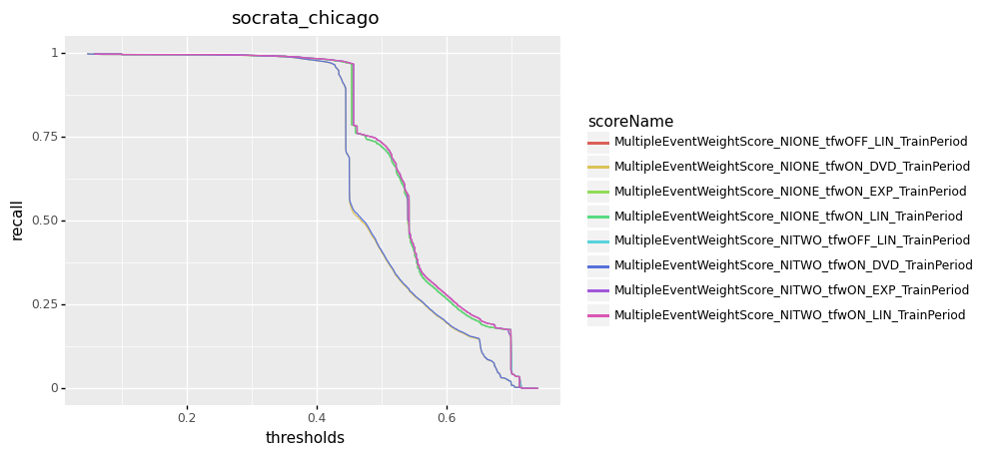


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.544751  0.613529   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.544744  0.618854   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.542971  0.625160   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.453984  0.678370   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.544751  0.602728   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.544744  0.608163   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.542971  0.614349   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.453984  0.671089   

   precision    recall  
0   0.970793  0.448482  
1   0.966569  0.455126  
2   0.965922  0.462128  
3   0.900601  0.544107  
4   0.971039  0.436983  
5   0.966700  0.443627  
6   0.966330  0.450322  
7   0.899570  0.535163  


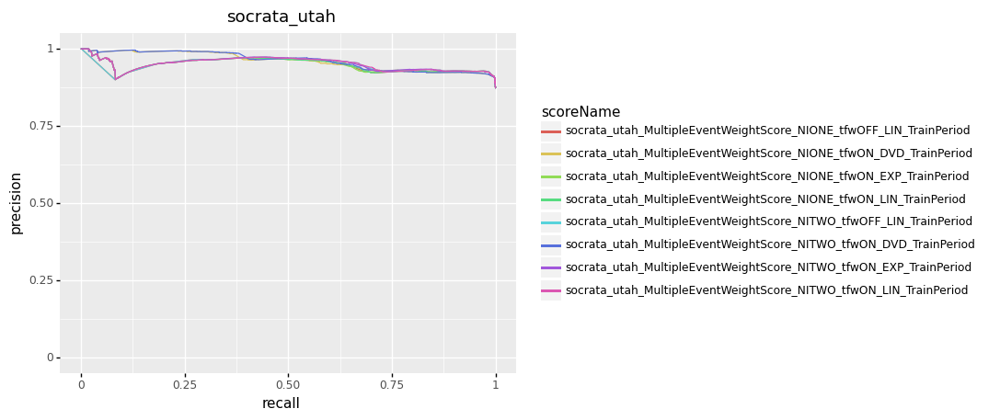

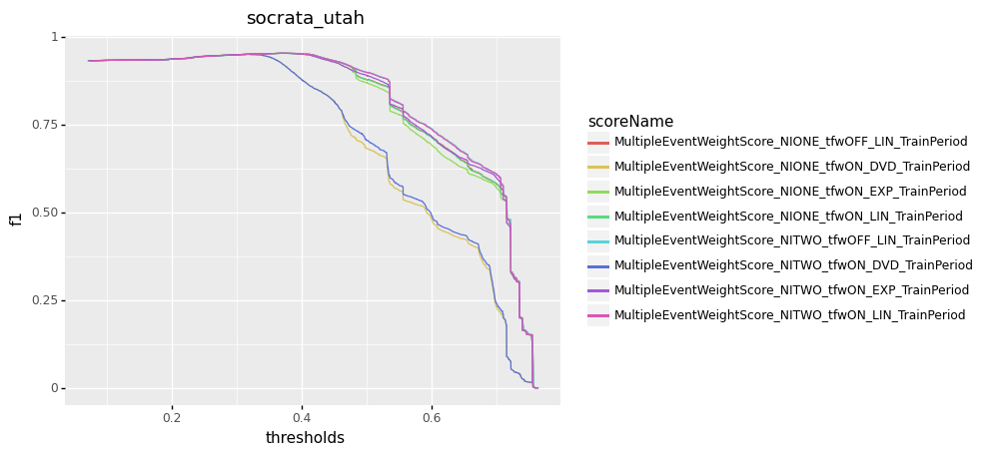

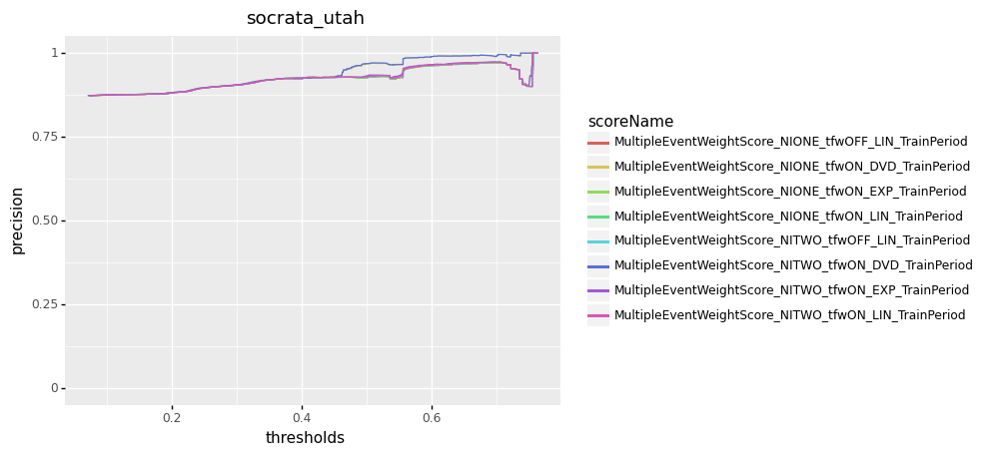

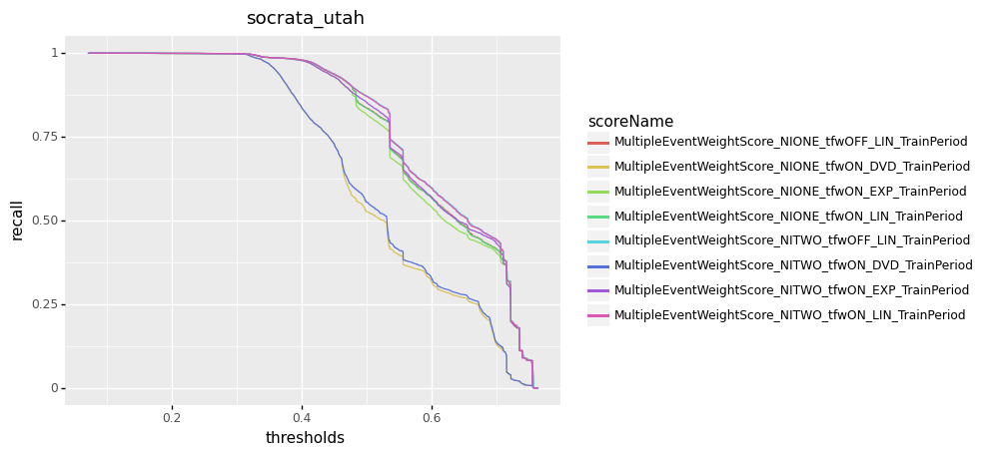


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.369061  0.953906   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.367846  0.953839   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.368486  0.953743   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.314746  0.951067   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.367956  0.953988   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.367846  0.953988   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.368486  0.953817   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.314746  0.951067   

   precision    recall  
0   0.924160  0.985631  
1   0.923892  0.985793  
2   0.924137  0.985308  
3   0.909774  0.996287  
4   0.924171  0.985793  
5   0.924171  0.985793  
6   0.924277  0.985308  
7   0.909774  0.996287  


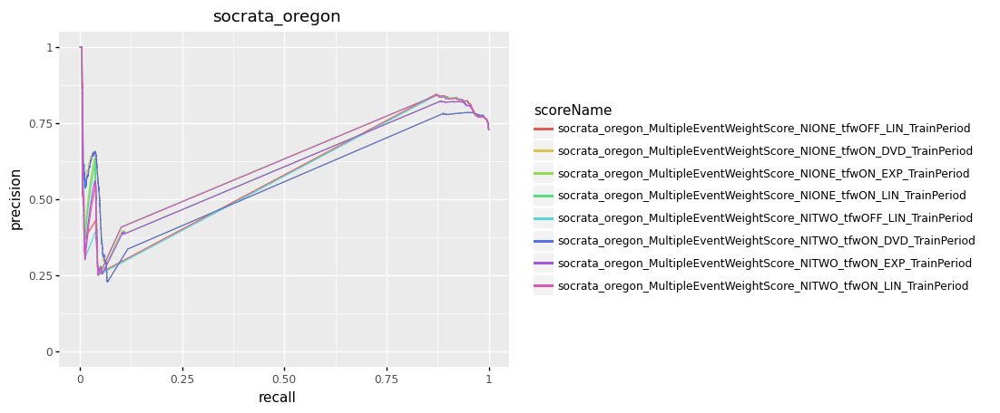

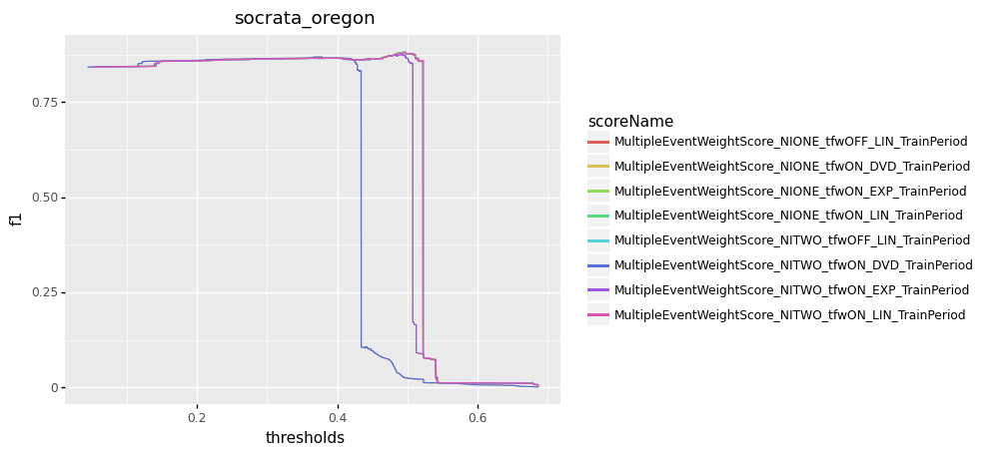

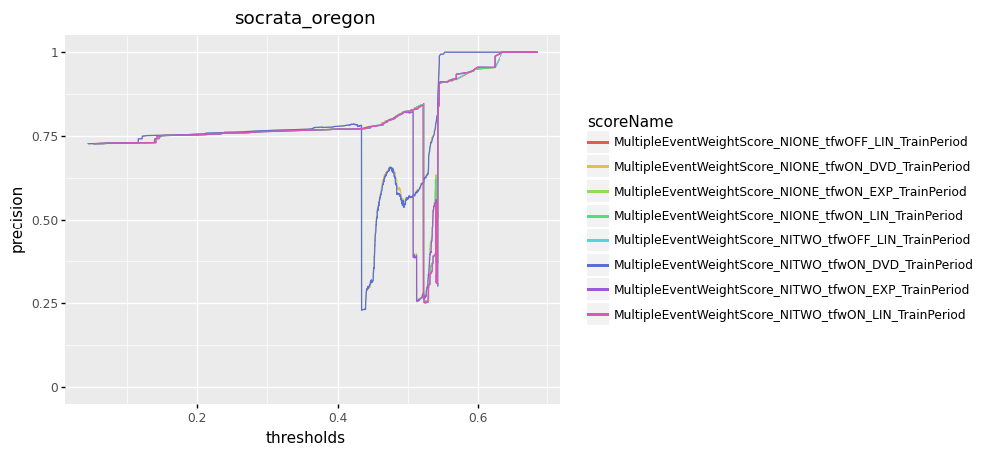

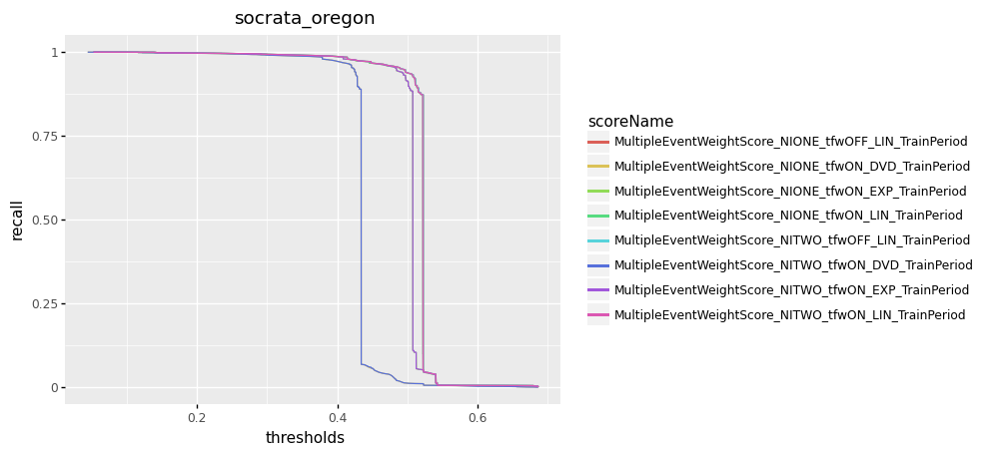


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.497238  0.881318   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.496133  0.881274   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.493945  0.875461   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.370185  0.868779   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.497238  0.881661   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.496127  0.881630   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.492245  0.876361   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.370185  0.868792   

   precision    recall  
0   0.823689  0.947619  
1   0.823535  0.947720  
2   0.820758  0.937977  
3   0.776249  0.986353  
4   0.824518  0.947313  
5   0.824388  0.947415  
6   0.821067  0.939641  
7   0.776270  0.986353  


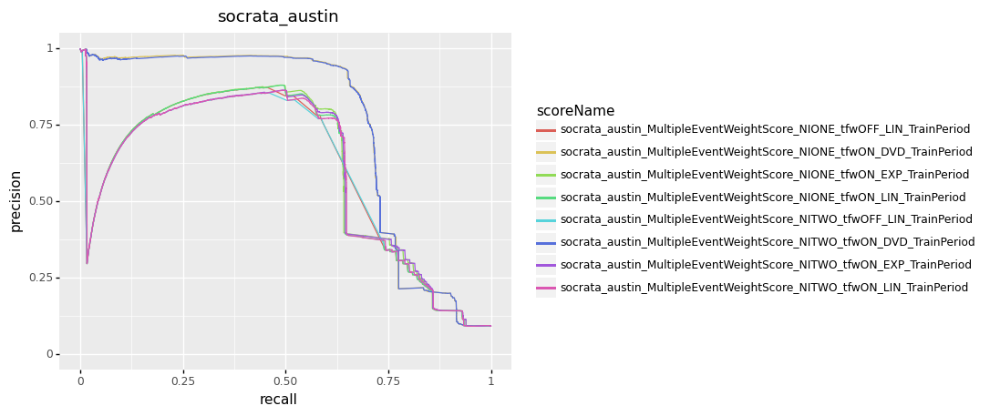

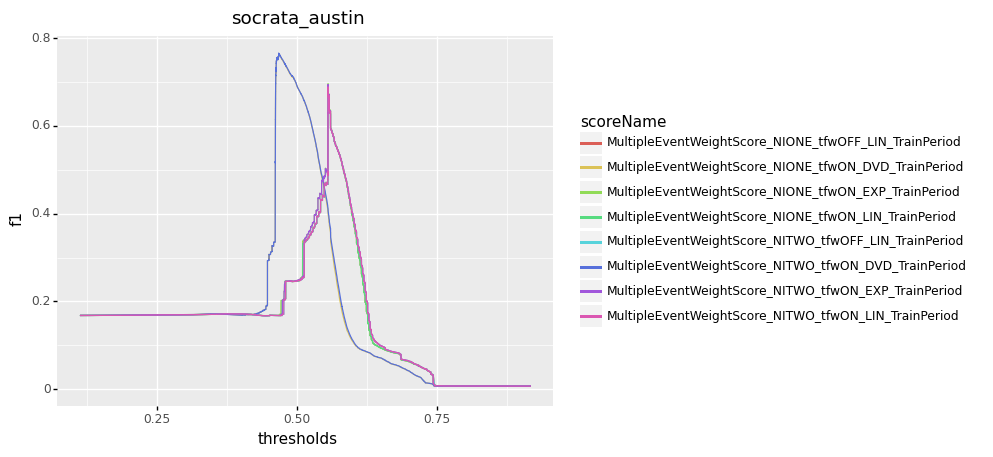

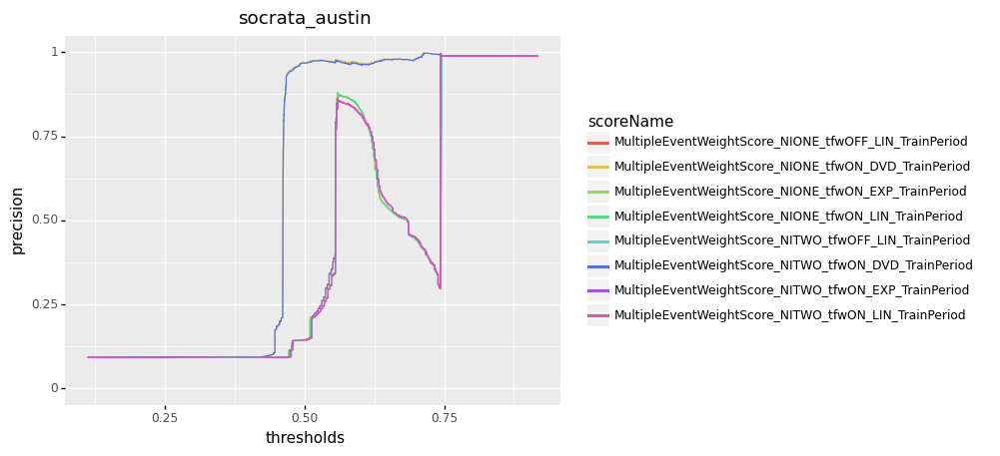

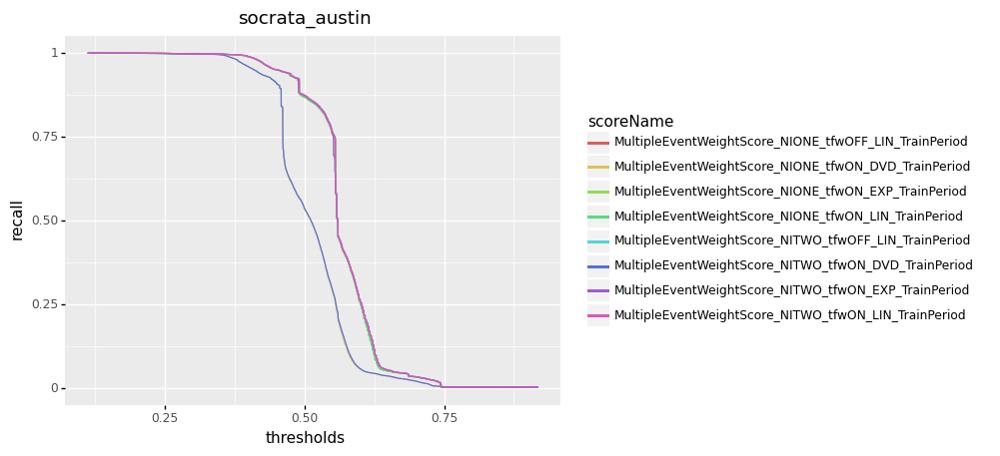


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.555801  0.666731   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.555799  0.688948   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.555765  0.693889   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.467535  0.765538   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.555801  0.668236   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.555799  0.690626   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.555765  0.695710   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.467535  0.765049   

   precision    recall  
0   0.771427  0.587057  
1   0.764044  0.627292  
2   0.781426  0.623989  
3   0.926218  0.652365  
4   0.782297  0.583203  
5   0.774044  0.623438  
6   0.792124  0.620219  
7   0.929077  0.650248  


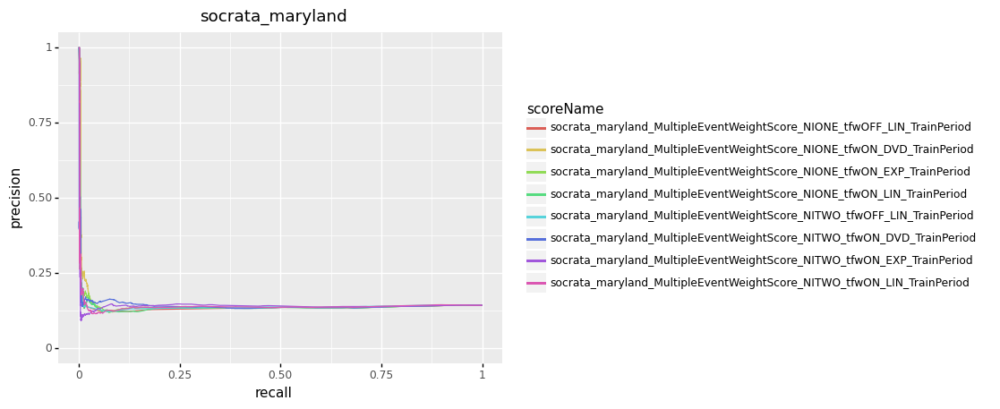

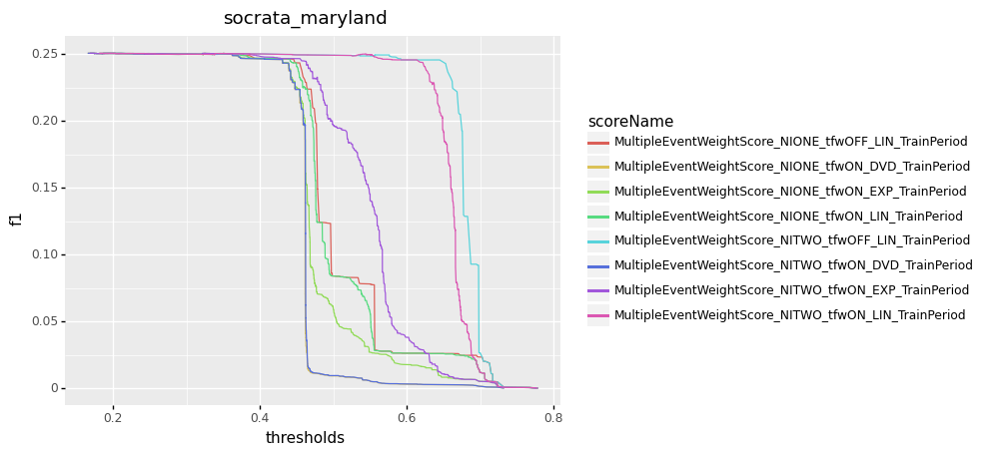

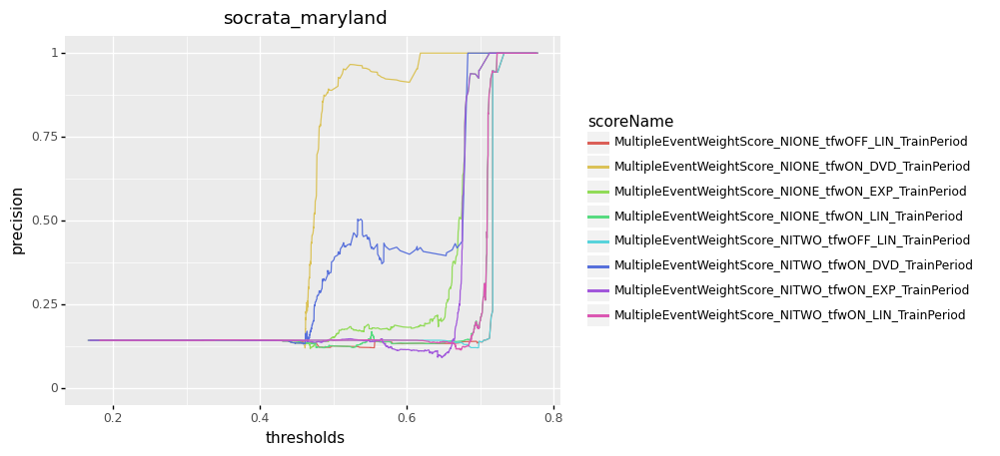

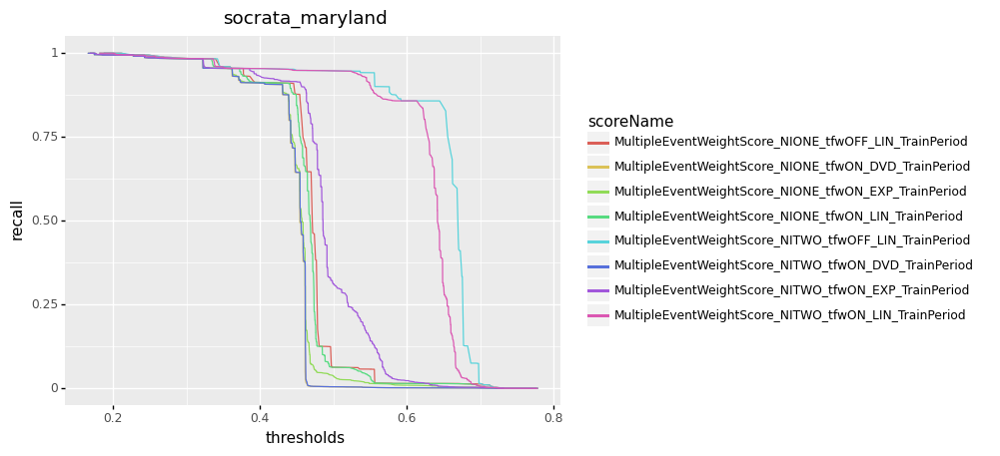


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.186740  0.250737   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.201442  0.250758   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.325043  0.250779   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.174065  0.250756   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.186740  0.250737   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.201442  0.250758   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.325043  0.250779   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.174065  0.250756   

   precision    recall  
0   0.143340  0.999927  
1   0.143368  0.999267  
2   0.144267  0.958245  
3   0.143365  0.999341  
4   0.143340  0.999927  
5   0.143368  0.999267  
6   0.144267  0.958245  
7   0.143365  0.999341  


In [14]:
#Same for different validity:
truthLabel='remainsValidContainment'
datasetNames = df.dataset.unique()
#datasetNames = ['socrata_maryland','socrata_austin']
#pd.set_option('display.max_colwidth', None)
pd.reset_option('display.max_colwidth')
for dsName in datasetNames:
    dsNames = [dsName]
    print(comparePrCurves(truthLabel,scoreNames,dsNames))
    dfF1 = compareF1Curves(truthLabel,scoreNames,dsNames)
    print(dfF1)

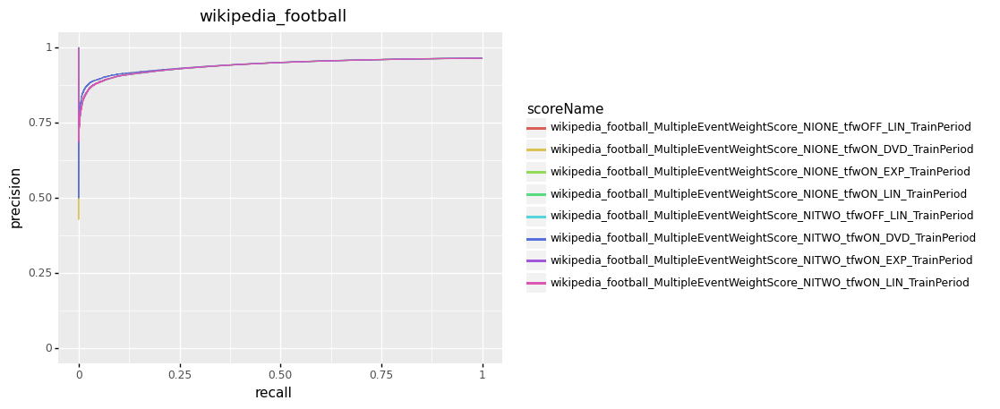

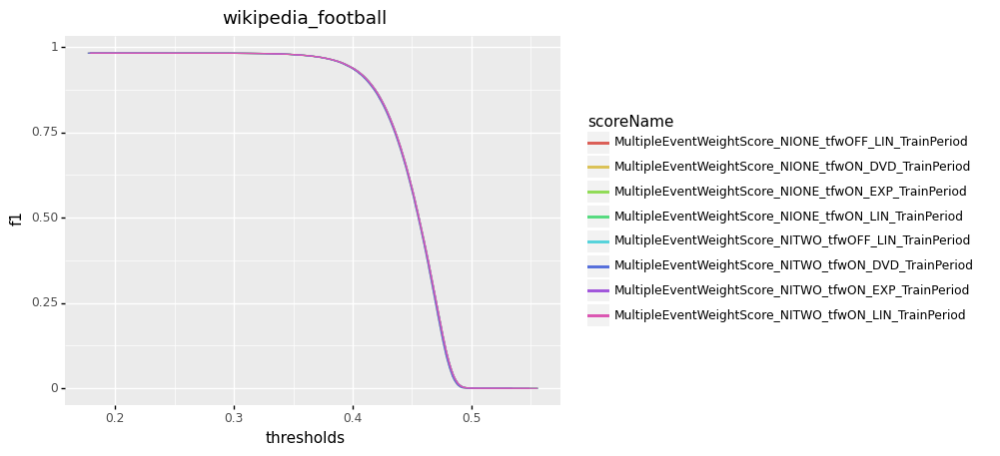

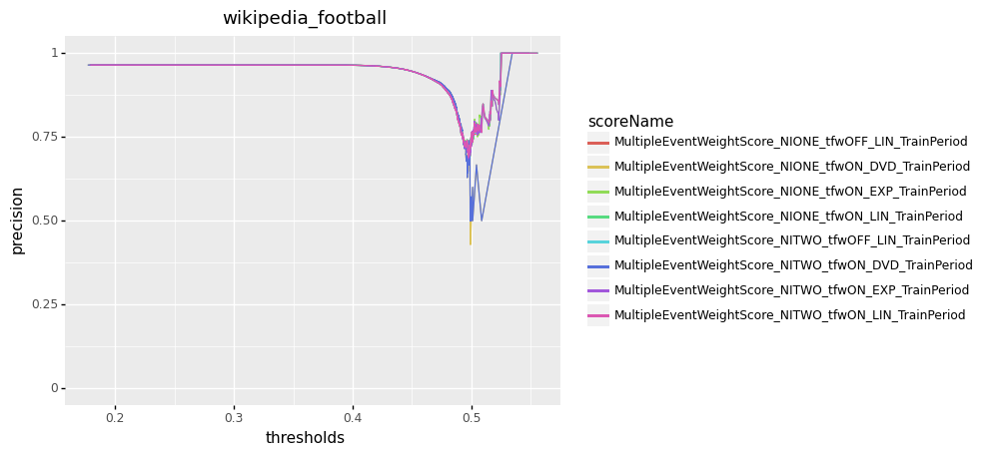

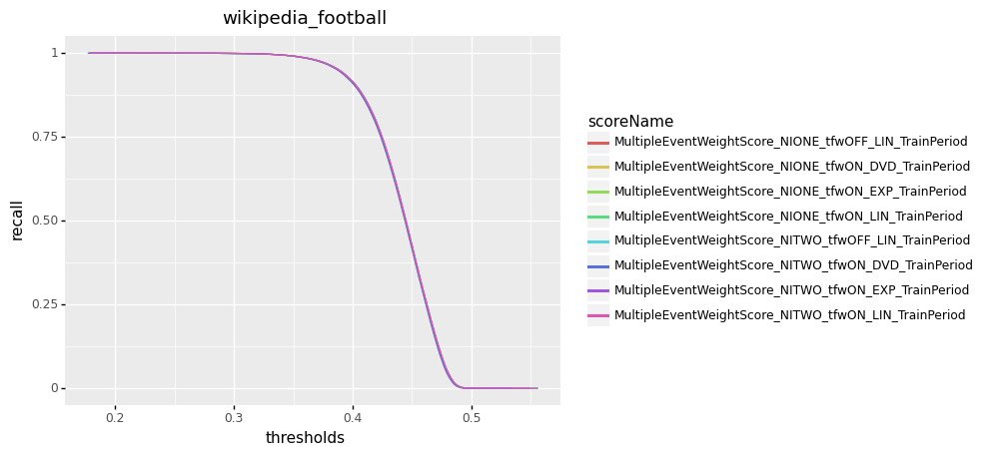


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.179080  0.981936   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.179021  0.981936   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.178297  0.981936   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.176782  0.981936   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.179080  0.981936   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.179021  0.981936   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.178297  0.981936   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.176782  0.981936   

   precision  recall  
0   0.964513     1.0  
1   0.964513     1.0  
2   0.964513     1.0  
3   0.964513     1.0  
4   0.964513     1.0  
5   0.964513     1.0  
6   0.964513     1.0  
7   0.964513     1.0  


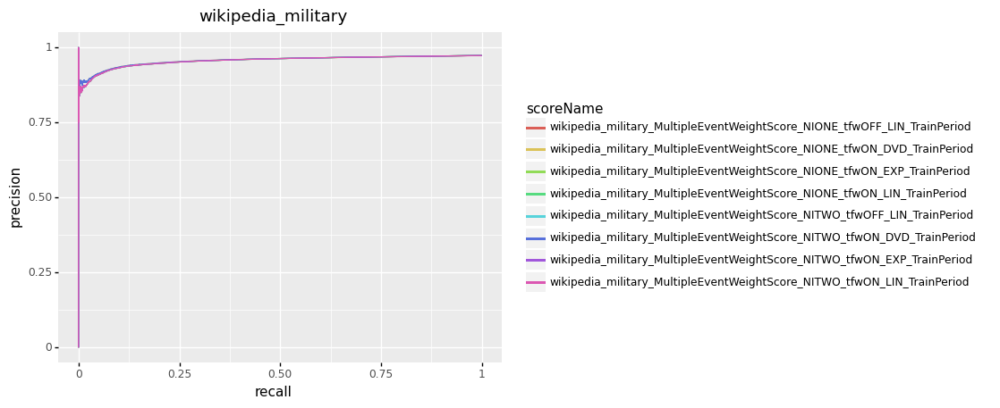

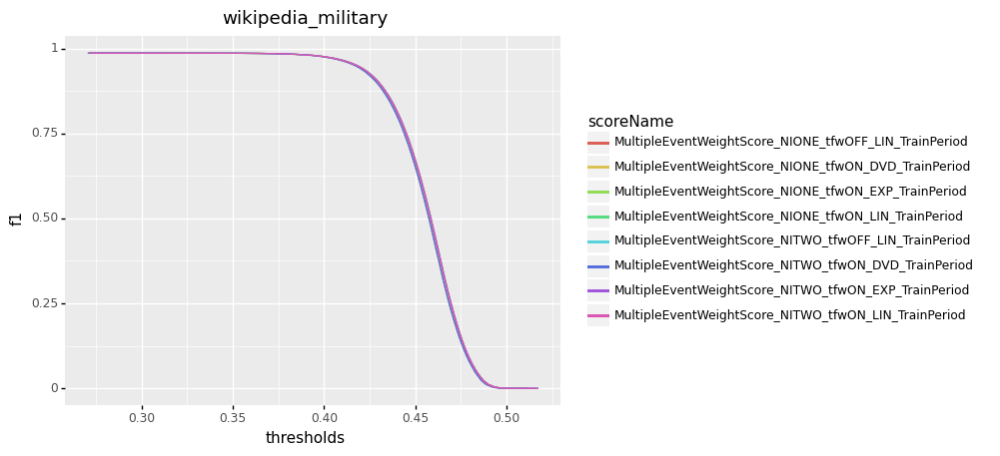

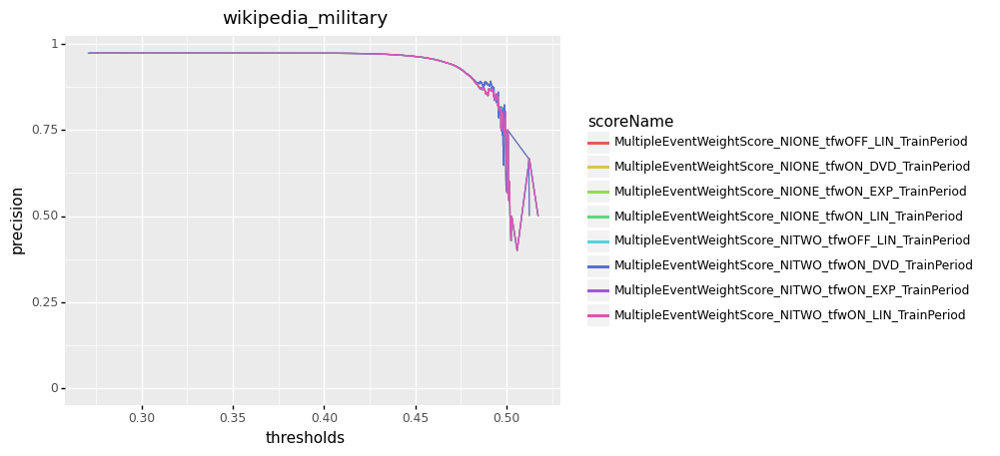

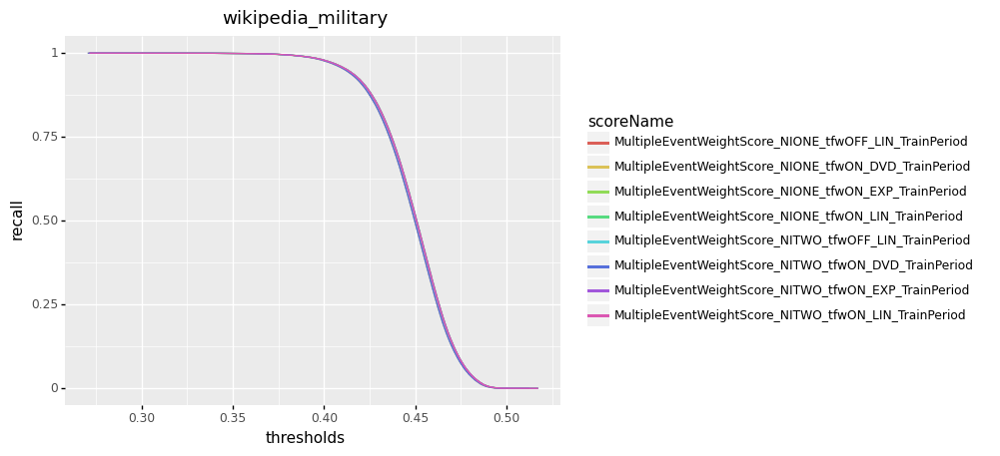


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.271724  0.986373   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.271688  0.986373   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.271269  0.986373   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.270575  0.986373   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.271724  0.986373   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.271688  0.986373   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.271269  0.986373   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.270575  0.986373   

   precision  recall  
0   0.973113     1.0  
1   0.973113     1.0  
2   0.973113     1.0  
3   0.973113     1.0  
4   0.973113     1.0  
5   0.973113     1.0  
6   0.973113     1.0  
7   0.973113     1.0  


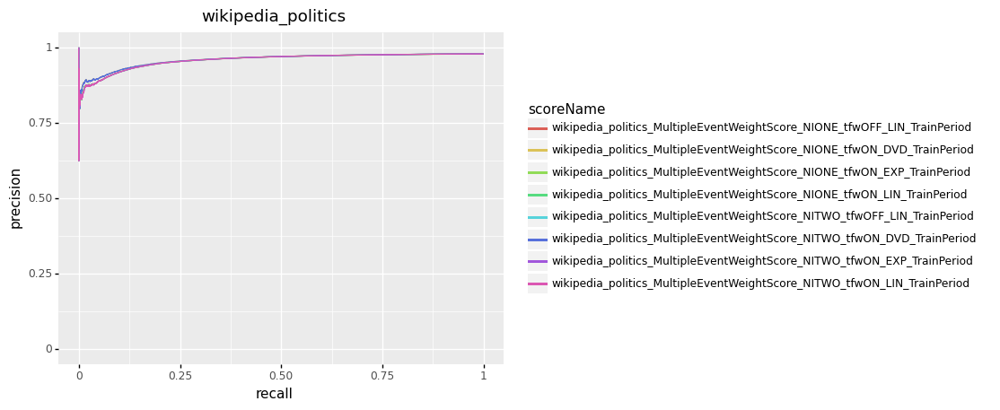

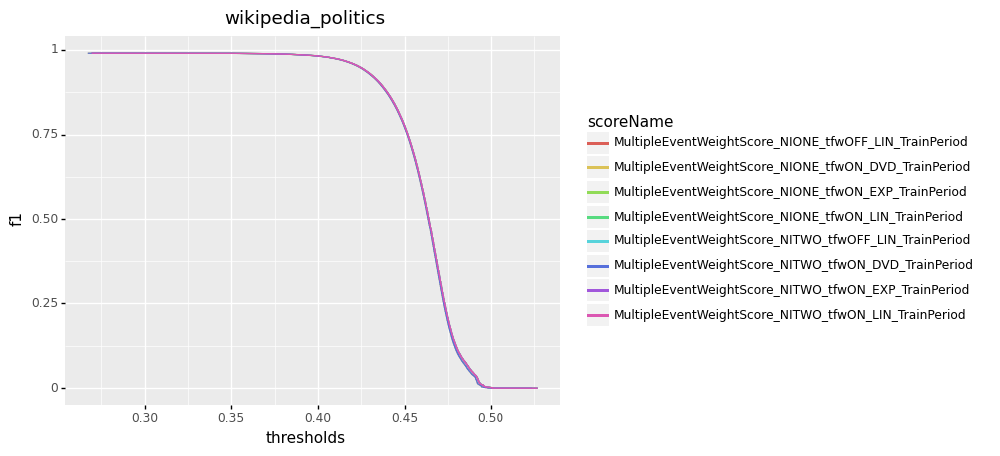

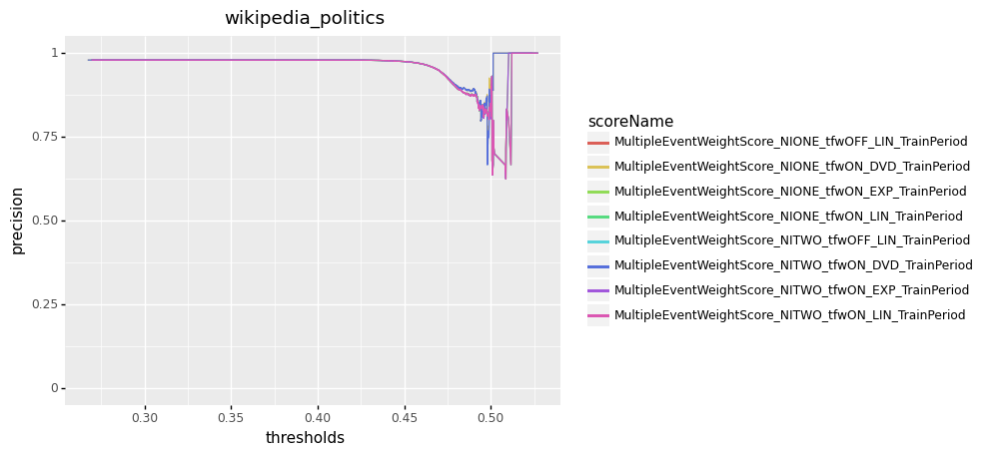

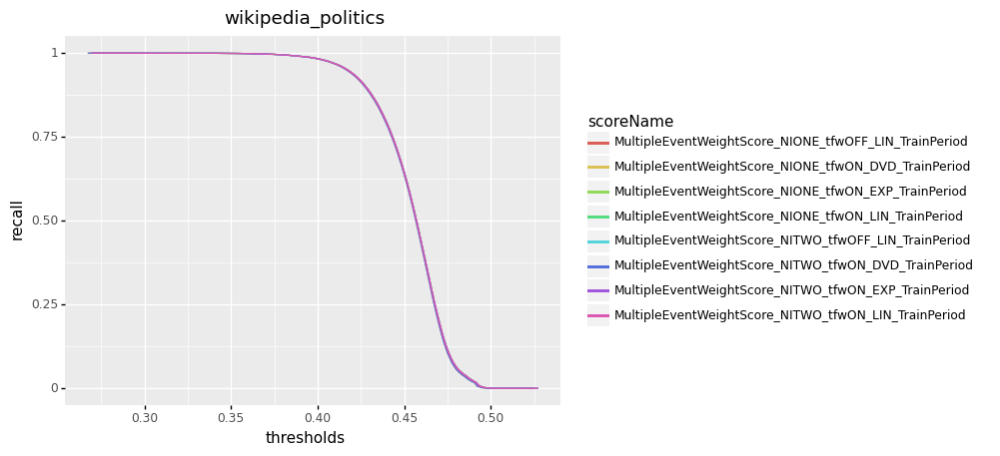


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.269425  0.989574   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.269415  0.989574   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.269261  0.989574   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.267132  0.989574   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.269425  0.989574   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.269415  0.989574   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.269261  0.989574   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.267132  0.989574   

   precision  recall  
0   0.979362     1.0  
1   0.979362     1.0  
2   0.979362     1.0  
3   0.979362     1.0  
4   0.979362     1.0  
5   0.979362     1.0  
6   0.979362     1.0  
7   0.979362     1.0  


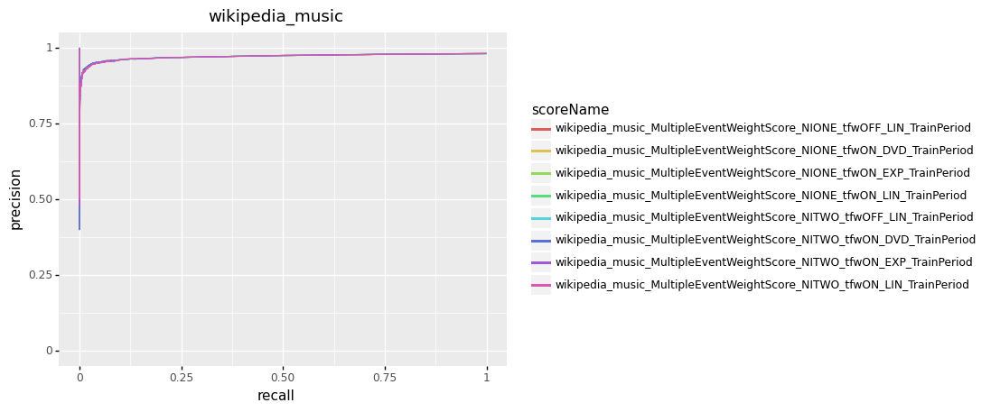

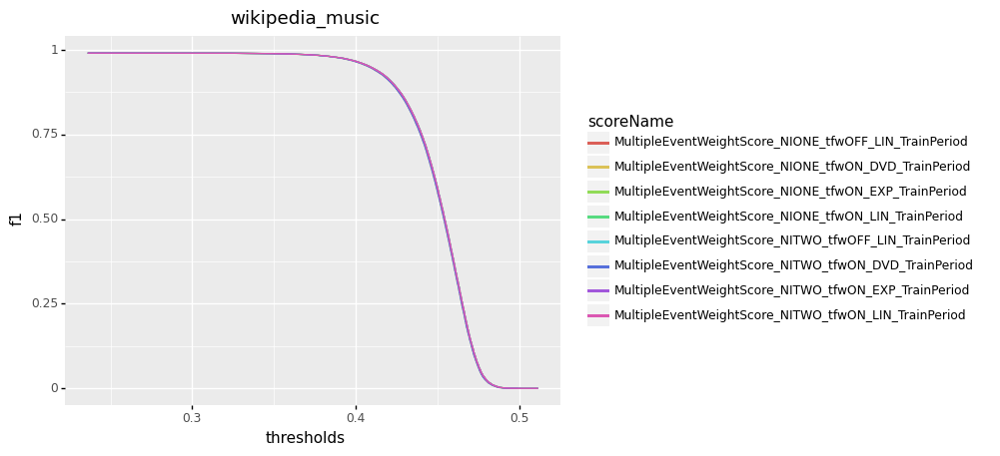

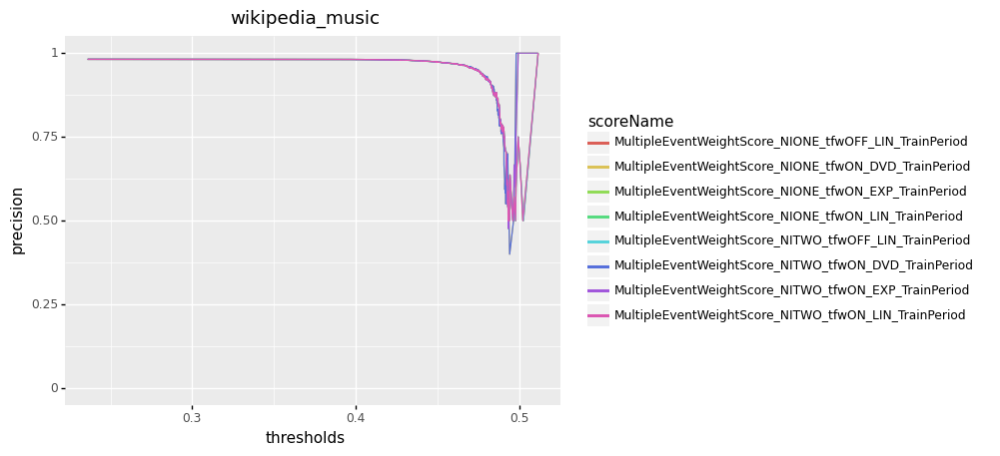

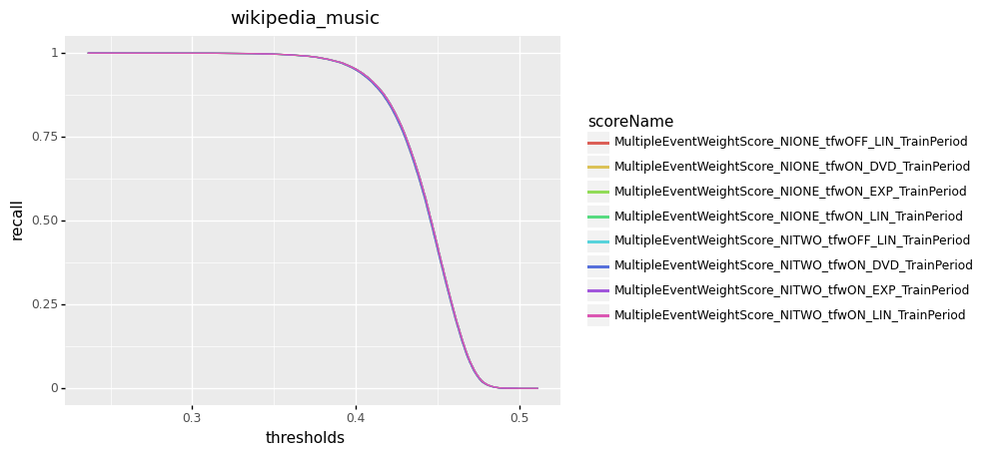


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.236092  0.990665   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.236092  0.990665   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.236092  0.990665   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.236092  0.990665   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.236092  0.990665   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.236092  0.990665   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.236092  0.990665   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.236092  0.990665   

   precision  recall  
0   0.981503     1.0  
1   0.981503     1.0  
2   0.981503     1.0  
3   0.981503     1.0  
4   0.981503     1.0  
5   0.981503     1.0  
6   0.981503     1.0  
7   0.981503     1.0  


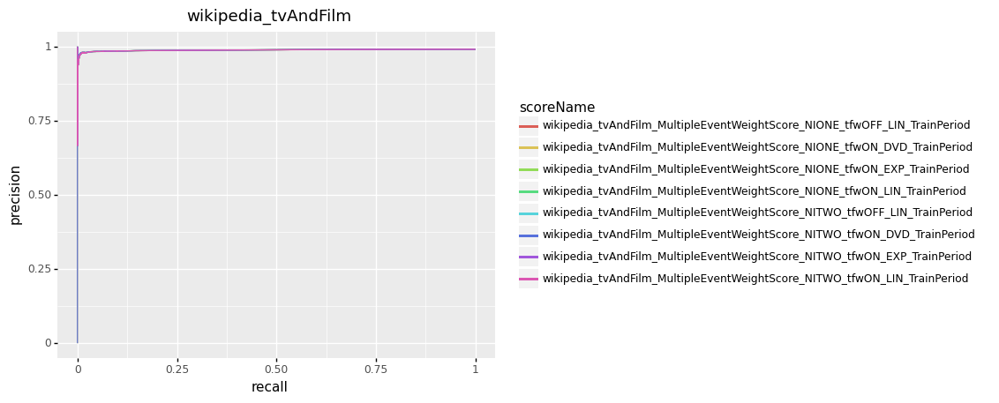

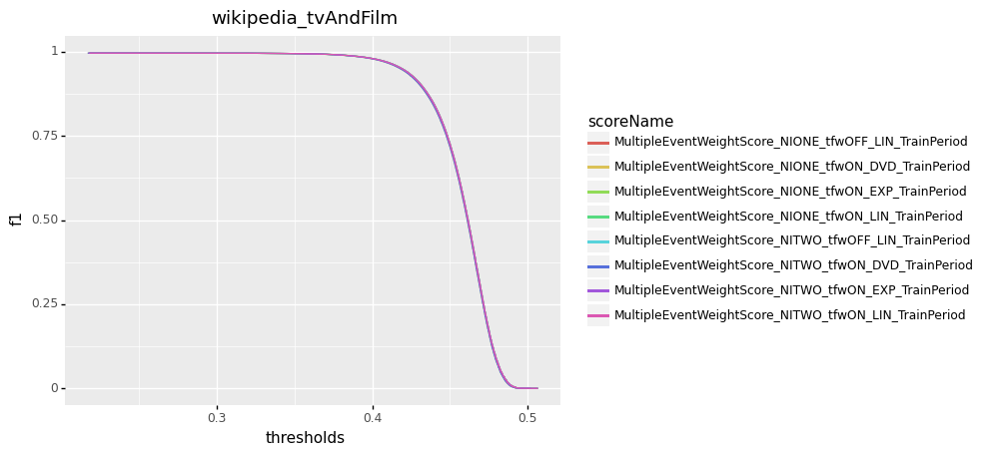

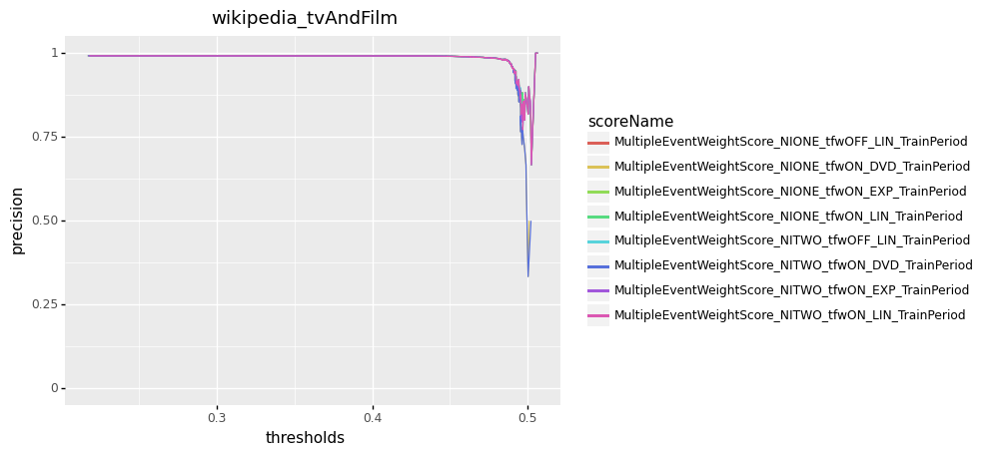

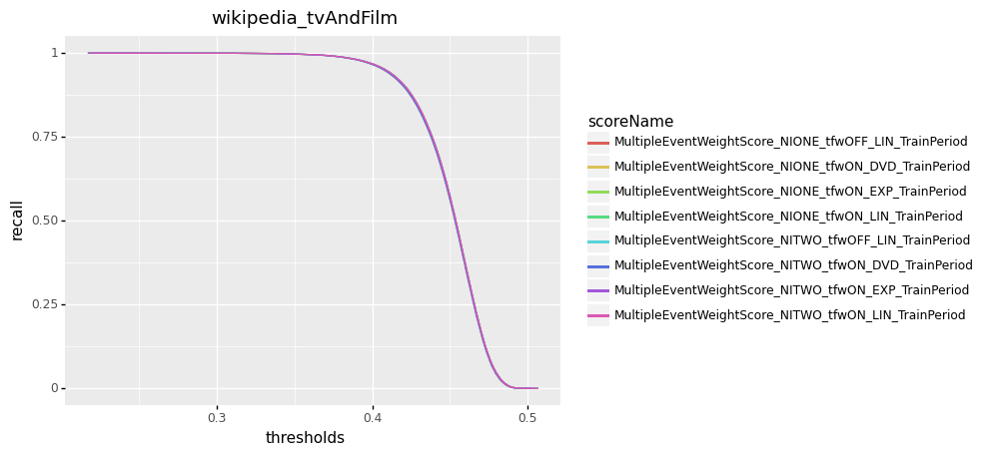


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.218391  0.995971   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.218330  0.995971   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.217734  0.995971   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.217241  0.995971   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.218391  0.995971   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.218330  0.995971   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.217734  0.995971   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.217241  0.995971   

   precision  recall  
0   0.991975     1.0  
1   0.991975     1.0  
2   0.991975     1.0  
3   0.991975     1.0  
4   0.991975     1.0  
5   0.991975     1.0  
6   0.991975     1.0  
7   0.991975     1.0  


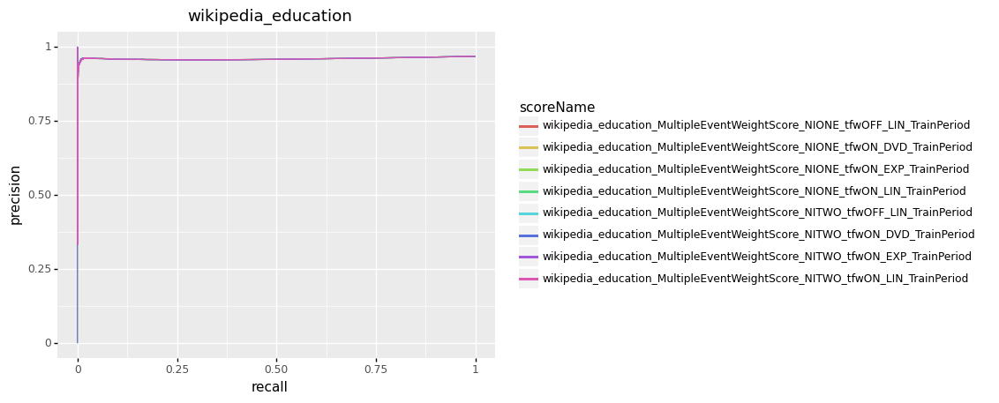

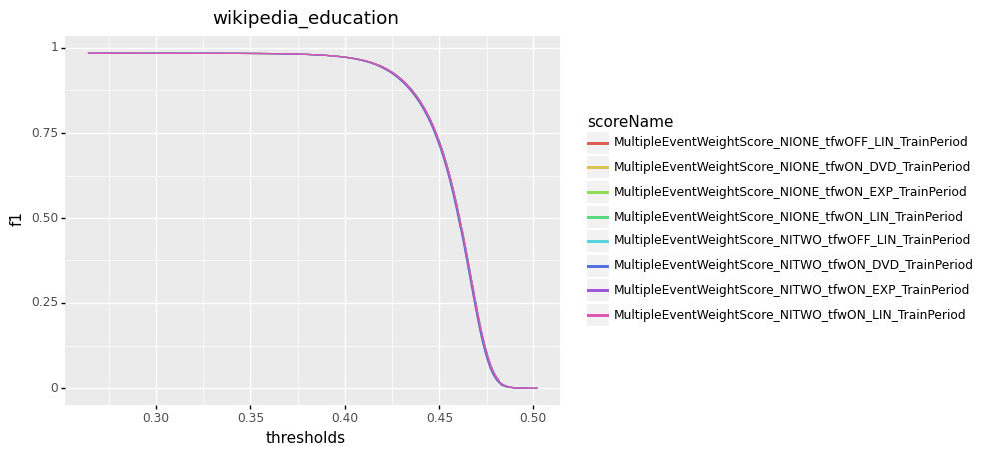

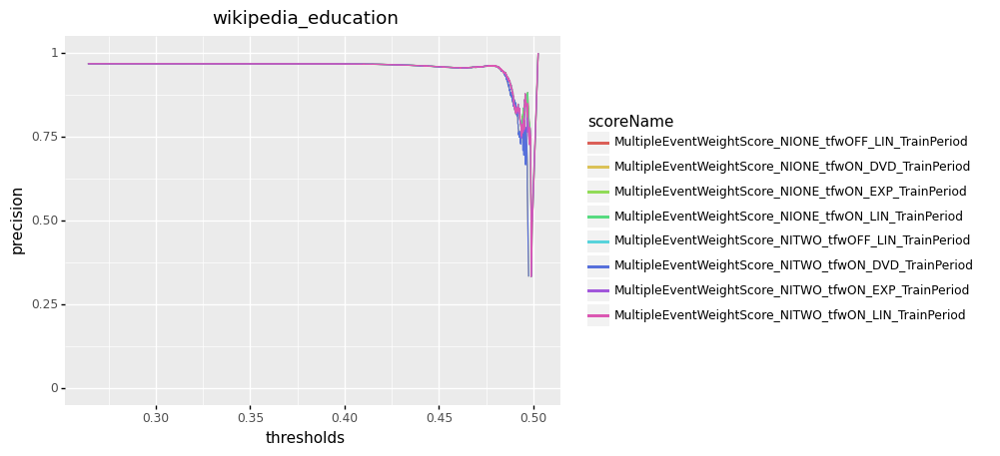

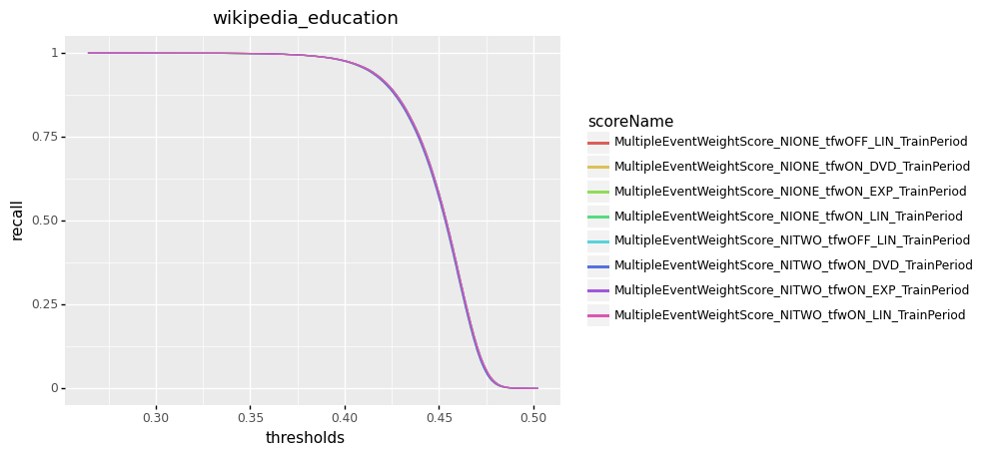


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.264138  0.983905   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.264134  0.983905   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.264081  0.983905   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.263908  0.983905   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.264138  0.983905   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.264134  0.983905   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.264081  0.983905   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.263908  0.983905   

   precision  recall  
0    0.96832     1.0  
1    0.96832     1.0  
2    0.96832     1.0  
3    0.96832     1.0  
4    0.96832     1.0  
5    0.96832     1.0  
6    0.96832     1.0  
7    0.96832     1.0  


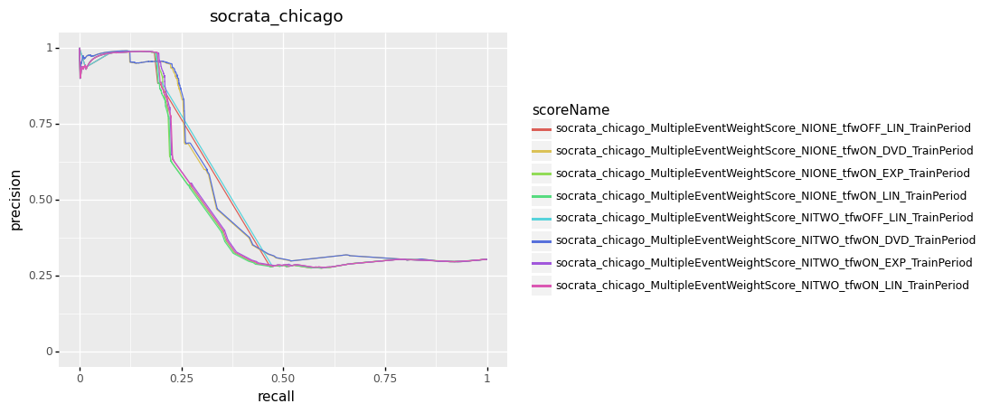

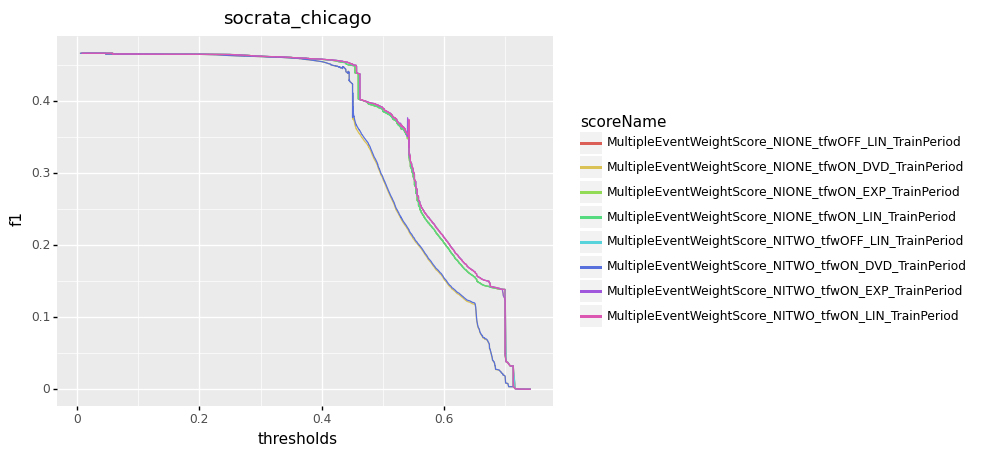

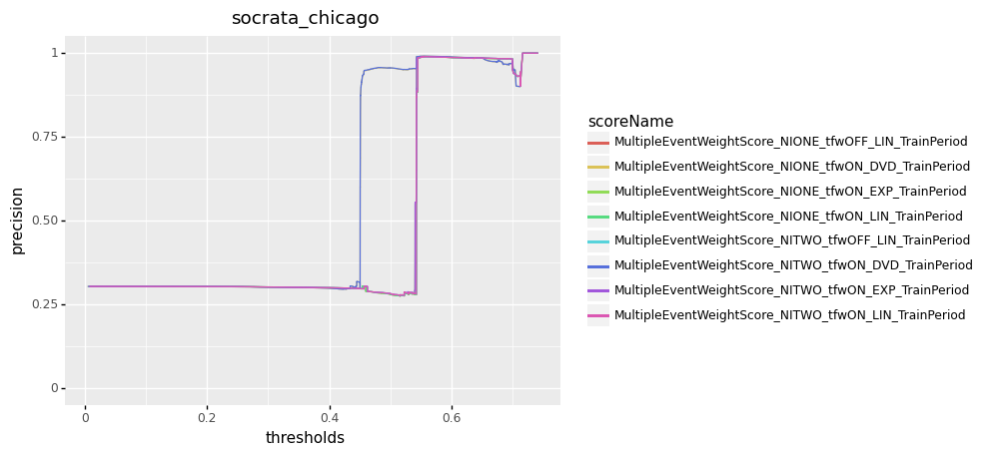

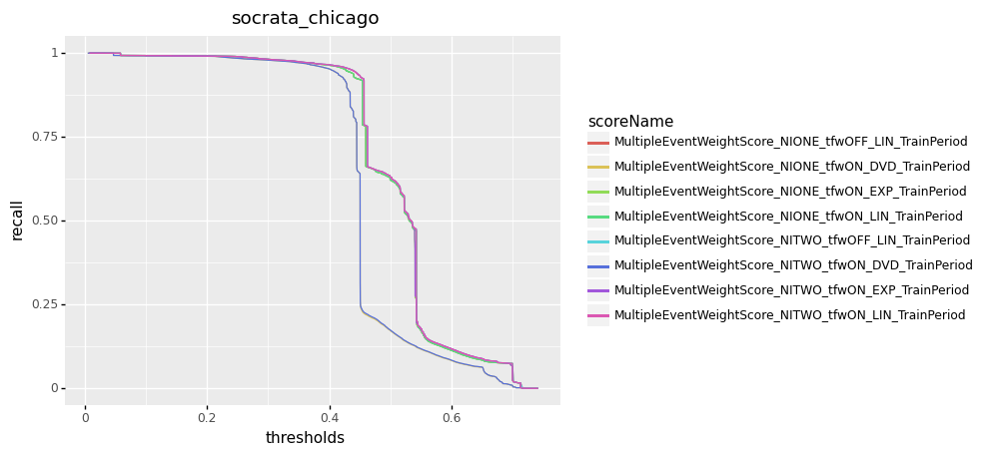


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.035359  0.466352   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.035359  0.466352   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.035355  0.466352   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.027807  0.466340   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.035359  0.466352   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.035359  0.466352   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.035355  0.466352   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.027807  0.466340   

   precision    recall  
0   0.304084  0.999958  
1   0.304084  0.999958  
2   0.304084  0.999958  
3   0.304074  0.999958  
4   0.304084  0.999958  
5   0.304084  0.999958  
6   0.304084  0.999958  
7   0.304074  0.999958  


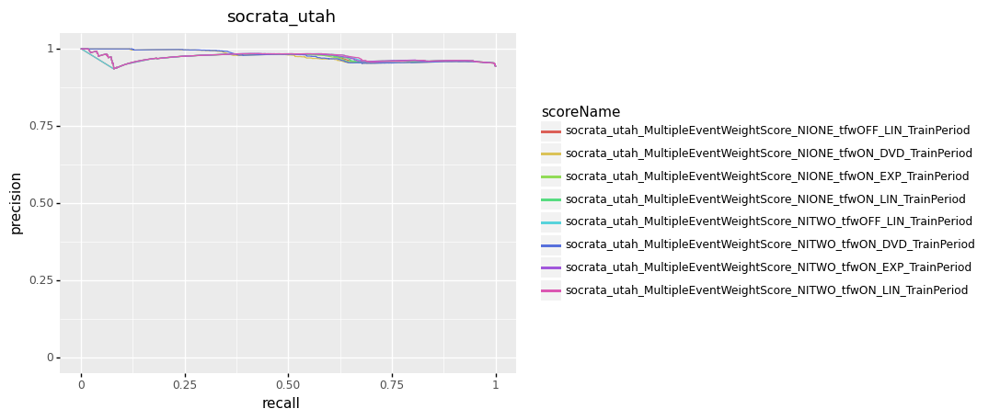

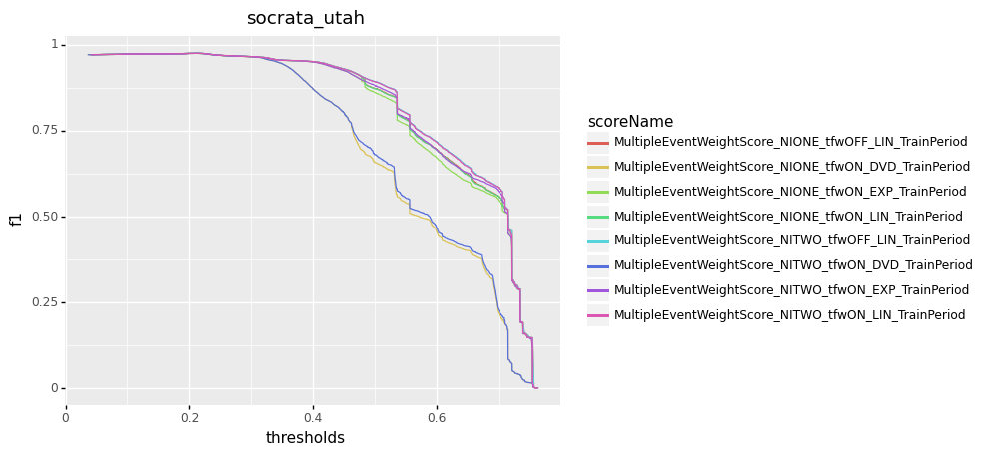

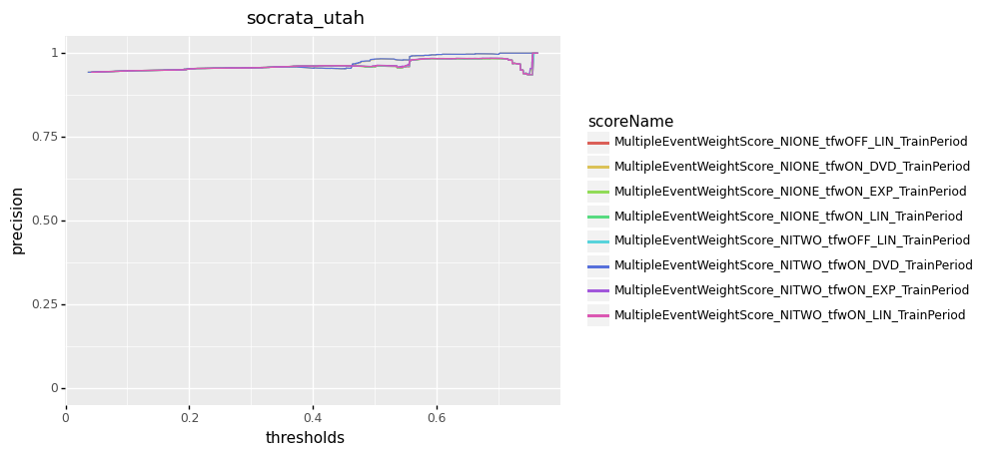

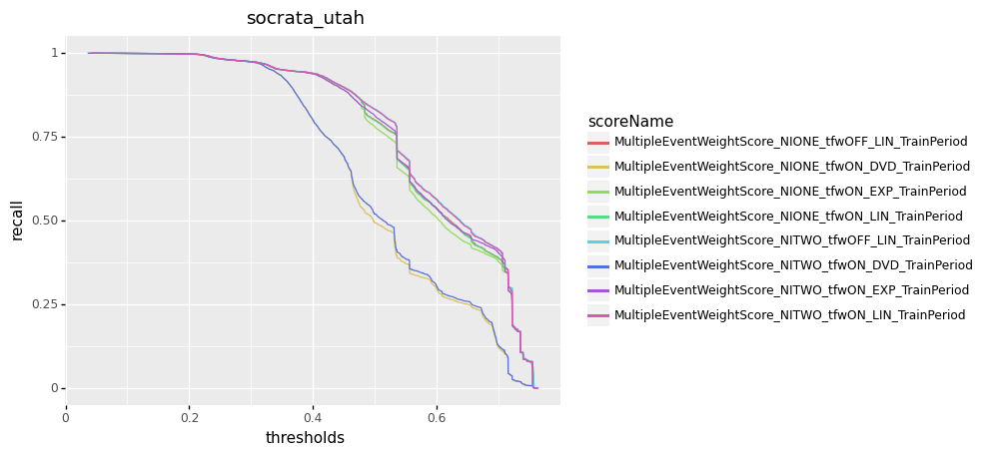


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.212155  0.975133   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.212150  0.975133   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.212074  0.975133   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.201147  0.974927   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.212155  0.975133   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.212150  0.975133   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.212074  0.975133   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.201147  0.974927   

   precision    recall  
0   0.954325  0.996869  
1   0.954325  0.996869  
2   0.954325  0.996869  
3   0.953657  0.997167  
4   0.954325  0.996869  
5   0.954325  0.996869  
6   0.954325  0.996869  
7   0.953657  0.997167  


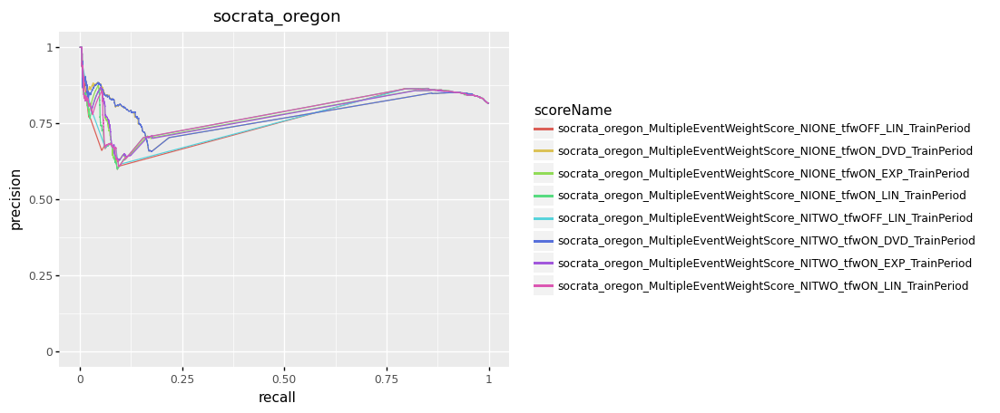

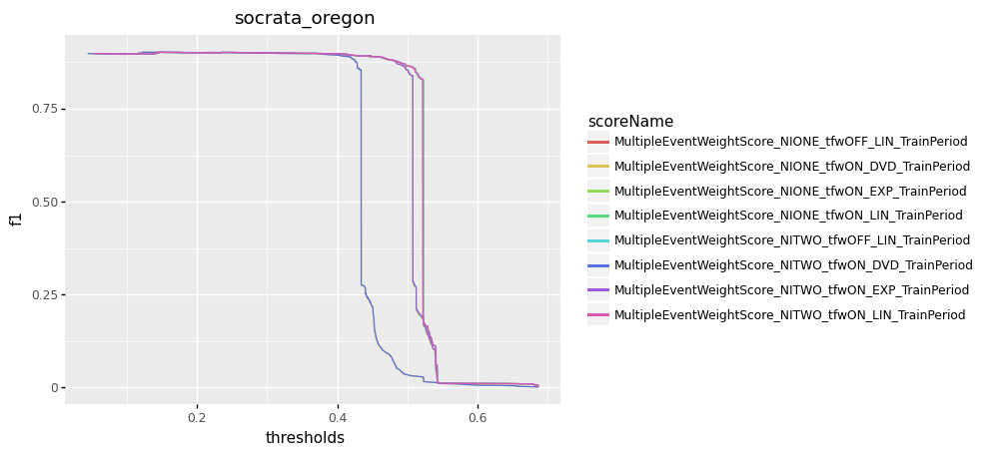

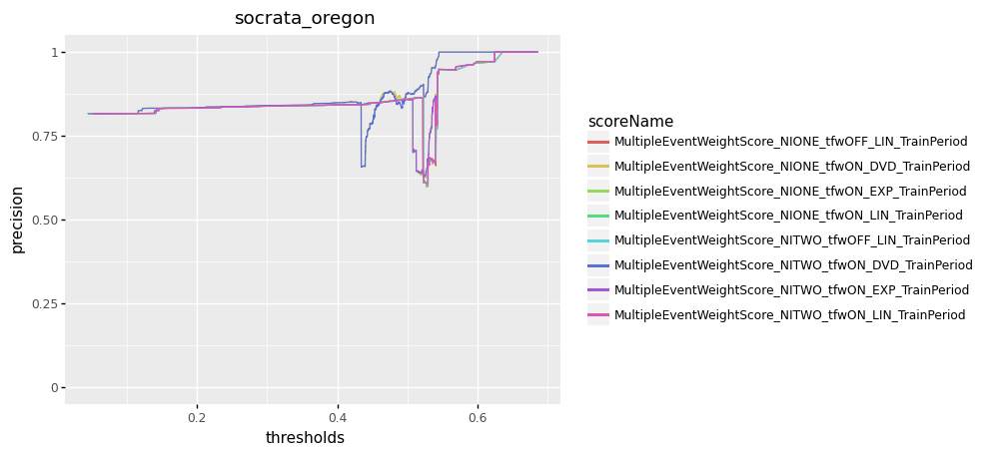

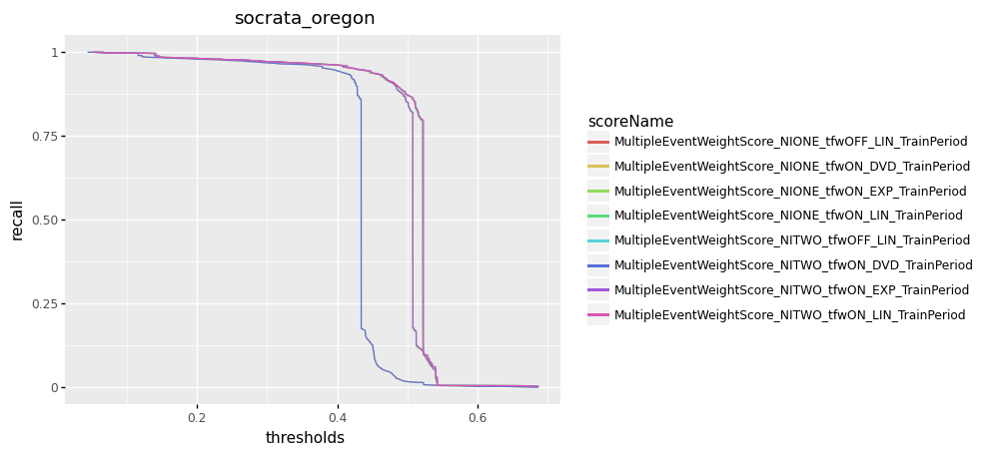


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.151381  0.902276   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.149155  0.902366   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.148916  0.902379   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.125283  0.902539   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.151381  0.902276   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.149155  0.902366   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.148916  0.902379   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.125283  0.902539   

   precision    recall  
0   0.832353  0.985025  
1   0.832290  0.985327  
2   0.832311  0.985327  
3   0.832303  0.985721  
4   0.832353  0.985025  
5   0.832290  0.985327  
6   0.832311  0.985327  
7   0.832303  0.985721  


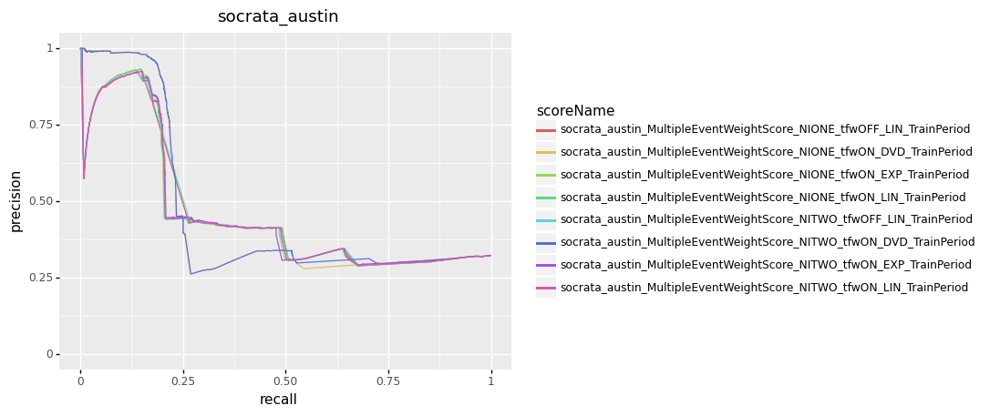

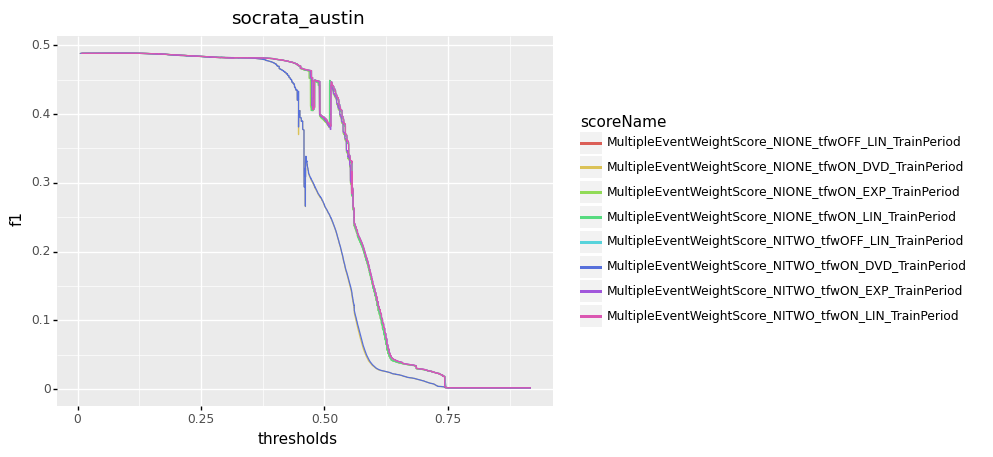

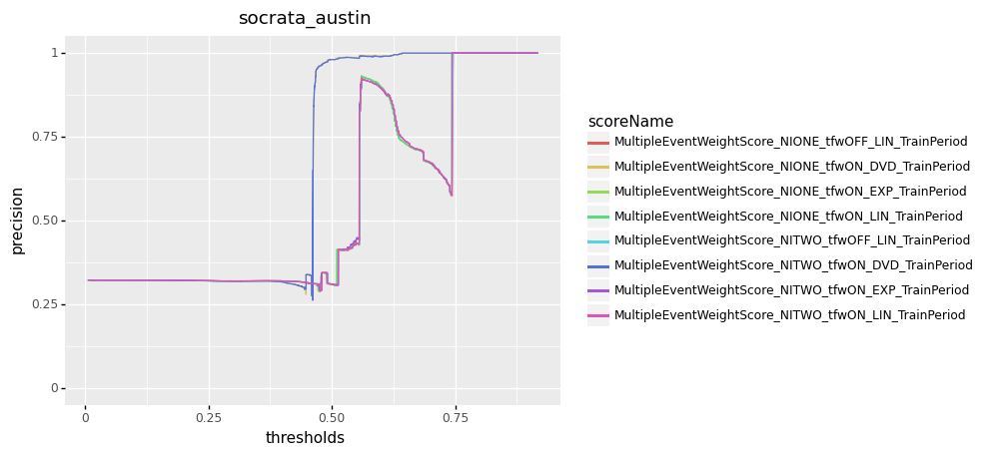

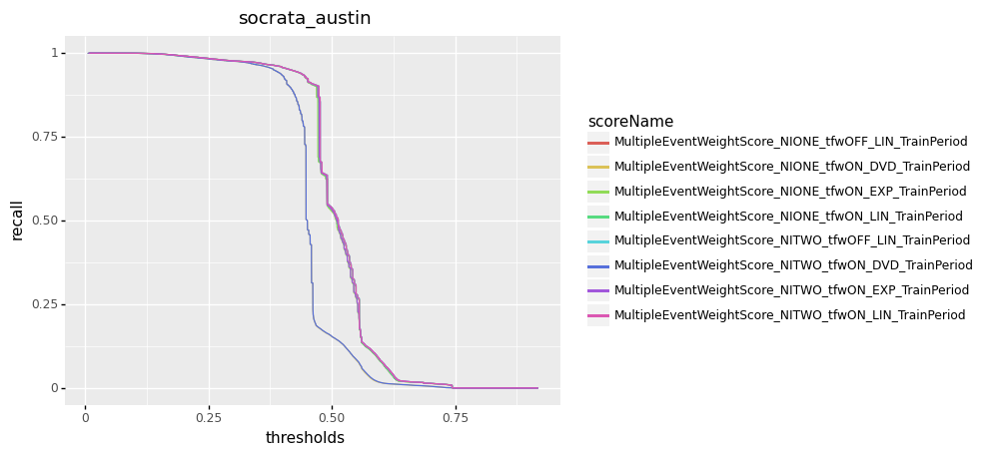


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.101657  0.488451   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.101656  0.488450   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.101635  0.488450   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.075294  0.488470   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.101657  0.488451   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.101656  0.488450   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.101635  0.488450   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.075294  0.488470   

   precision    recall  
0   0.323181  0.999664  
1   0.323180  0.999664  
2   0.323180  0.999664  
3   0.323180  0.999832  
4   0.323181  0.999664  
5   0.323180  0.999664  
6   0.323180  0.999664  
7   0.323180  0.999832  


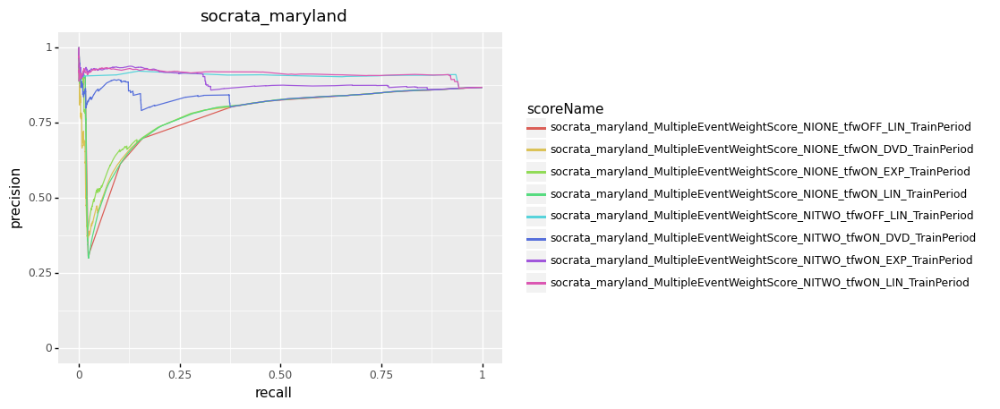

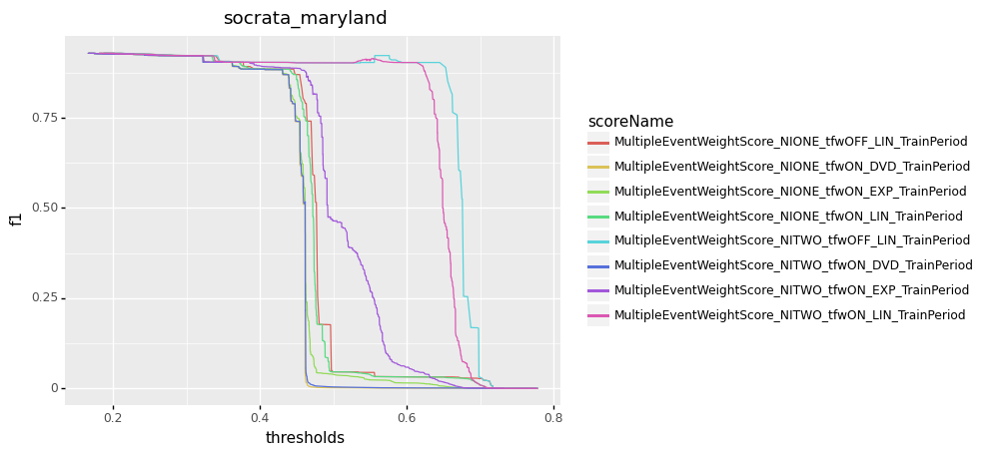

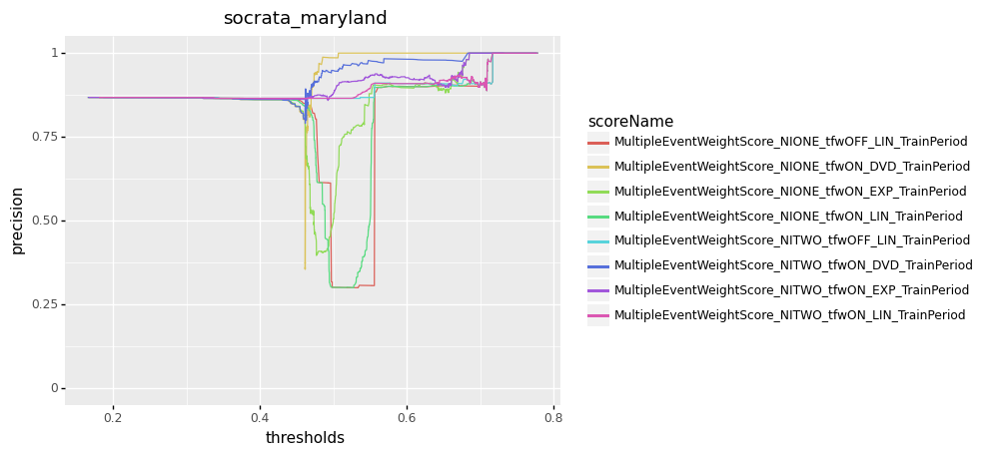

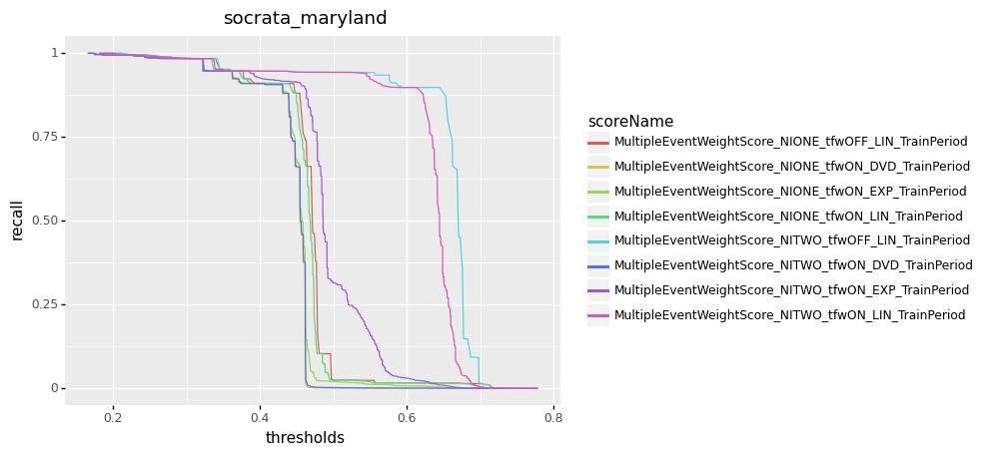


                                           scoreName  bestThreshold   best_F1  \
0  MultipleEventWeightScore_NITWO_tfwOFF_LIN_Trai...       0.186740  0.929262   
1  MultipleEventWeightScore_NITWO_tfwON_LIN_Train...       0.180611  0.929262   
2  MultipleEventWeightScore_NITWO_tfwON_EXP_Train...       0.166396  0.929262   
3  MultipleEventWeightScore_NITWO_tfwON_DVD_Train...       0.165213  0.929262   
4  MultipleEventWeightScore_NIONE_tfwOFF_LIN_Trai...       0.186740  0.929262   
5  MultipleEventWeightScore_NIONE_tfwON_LIN_Train...       0.180611  0.929262   
6  MultipleEventWeightScore_NIONE_tfwON_EXP_Train...       0.166396  0.929262   
7  MultipleEventWeightScore_NIONE_tfwON_DVD_Train...       0.165213  0.929262   

   precision  recall  
0    0.86787     1.0  
1    0.86787     1.0  
2    0.86787     1.0  
3    0.86787     1.0  
4    0.86787     1.0  
5    0.86787     1.0  
6    0.86787     1.0  
7    0.86787     1.0  


In [15]:
#Same for different validity:
truthLabel='remainsValid_0_9_PercentageOfTime'
datasetNames = df.dataset.unique()
#datasetNames = ['socrata_maryland','socrata_austin']
#pd.set_option('display.max_colwidth', None)
pd.reset_option('display.max_colwidth')
for dsName in datasetNames:
    dsNames = [dsName]
    print(comparePrCurves(truthLabel,scoreNames,dsNames))
    dfF1 = compareF1Curves(truthLabel,scoreNames,dsNames)
    print(dfF1)

# Tuples in Concrete Range of Threshold:

In [10]:
dsName = 'socrata_chicago'
scoreName = 'MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod'
dfForThisDs = df[df['dataset']==dsName]
upper=0.75
lower=0.7
dfFiltered = dfForThisDs[(dfForThisDs[scoreName]>lower) & (dfForThisDs[scoreName]<upper)]
print("in range",len(dfFiltered.index),"total",len(dfForThisDs.index),"percentage:",100*len(dfFiltered.index)/len(dfForThisDs.index),"%")

in range 985 total 156919 percentage: 0.6277123866453393 %


# Threshold generalizability for every metric (with regards to different datasets)

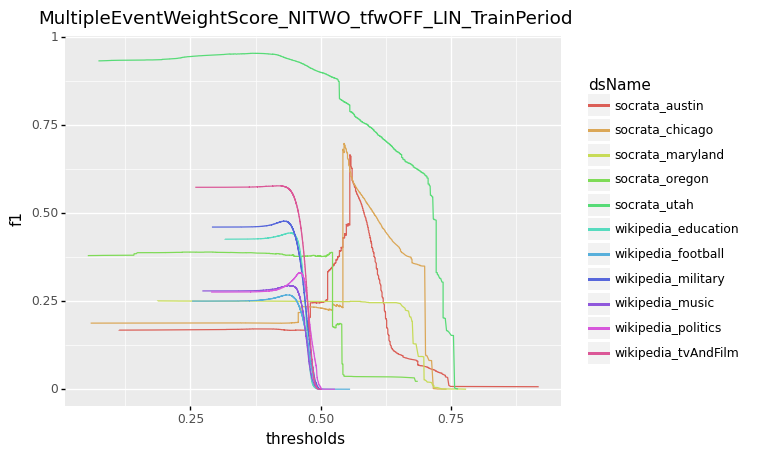

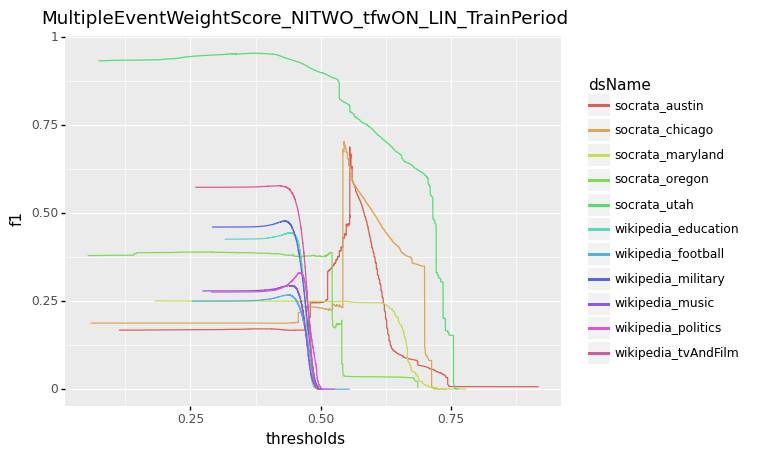

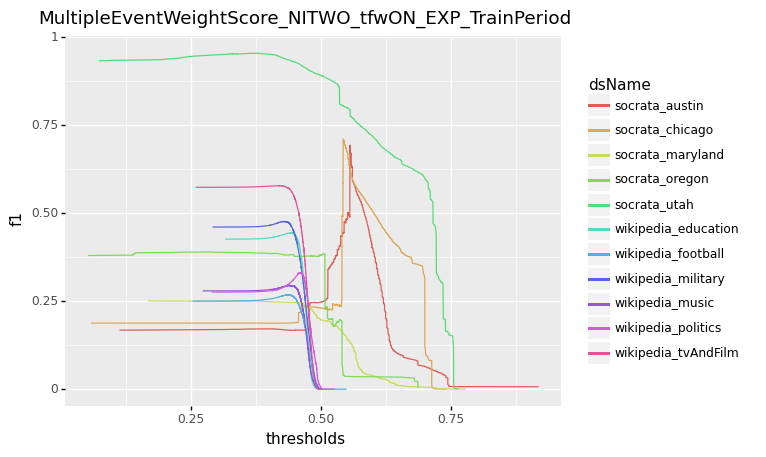

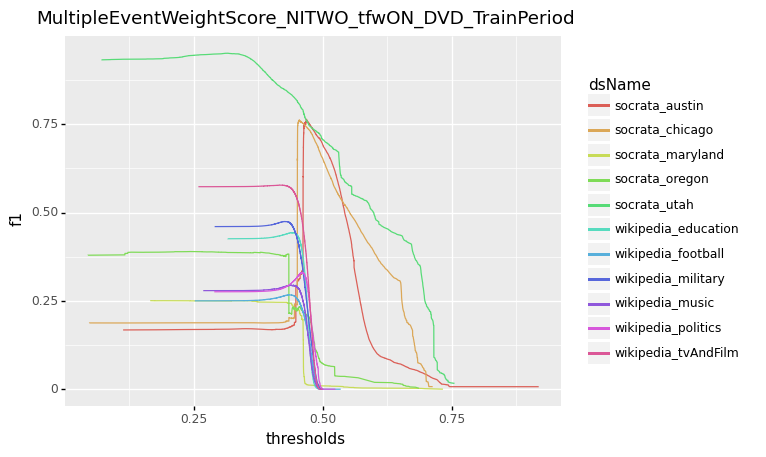

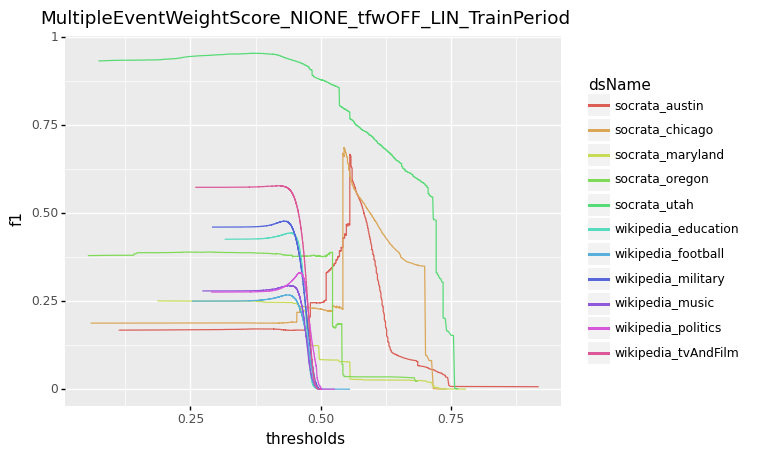

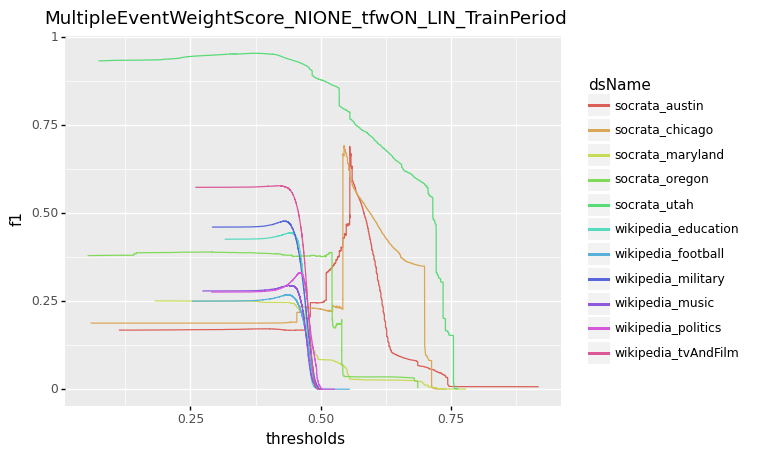

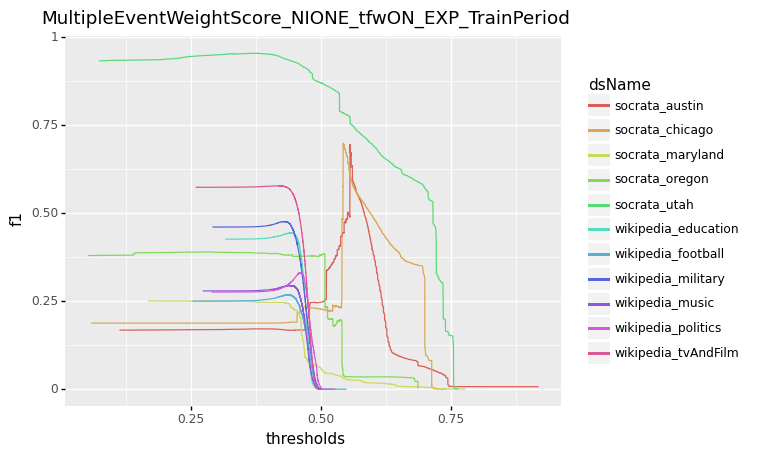

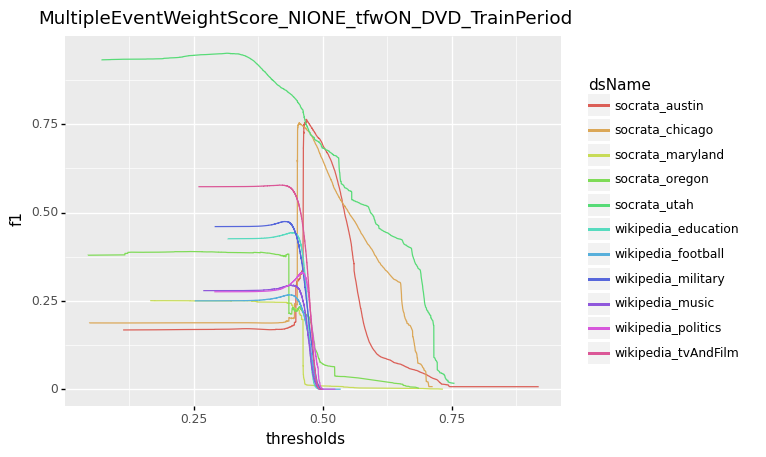

In [13]:
def getThresholdCurves(predScore,datasetNames,truthLabel):
    finalDf = pd.DataFrame()
    #f1Df = pd.DataFrame()
    for dsName in  datasetNames:
        dfForThisDs = df[df['dataset']==dsName]
        #for predScore in predScores:
        dfForThisDsAndScore = dfForThisDs[dfForThisDs[predScore].notnull()]
        y_test = dfForThisDsAndScore[truthLabel]
        y_pred = dfForThisDsAndScore[predScore]
        scoreName = predScore
        precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
        indices = (precision !=0) | (recall!=0)
        precision = precision[indices]
        recall = recall[indices]
        thresholds = thresholds[indices[0:len(indices)-1]]
        f1_scores = 2*recall*precision/(recall+precision)
        f1_scores=f1_scores[0:len(f1_scores)-1]
        d = {'thresholds': thresholds, 'f1': f1_scores}
        prdf = pd.DataFrame(data=d)
        prdf['dsName'] = dsName
        finalDf = finalDf.append(prdf)
    return ggplot(finalDf, aes(x='thresholds', y='f1',color='dsName')) + geom_line()+ labs(title=predScore)

scoreNames = pd.array(['MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod', 
                       'MultipleEventWeightScore_NITWO_tfwON_LIN_TrainPeriod',
                       'MultipleEventWeightScore_NITWO_tfwON_EXP_TrainPeriod',
                       'MultipleEventWeightScore_NITWO_tfwON_DVD_TrainPeriod',
                       'MultipleEventWeightScore_NIONE_tfwOFF_LIN_TrainPeriod',
                       'MultipleEventWeightScore_NIONE_tfwON_LIN_TrainPeriod',
                      'MultipleEventWeightScore_NIONE_tfwON_EXP_TrainPeriod',
                      'MultipleEventWeightScore_NIONE_tfwON_DVD_TrainPeriod'], dtype="string")
truthLabel='remainsValid'
datasetNames = df.dataset.unique()
for scoreName in scoreNames:
    print(getThresholdCurves(scoreName,datasetNames,truthLabel))

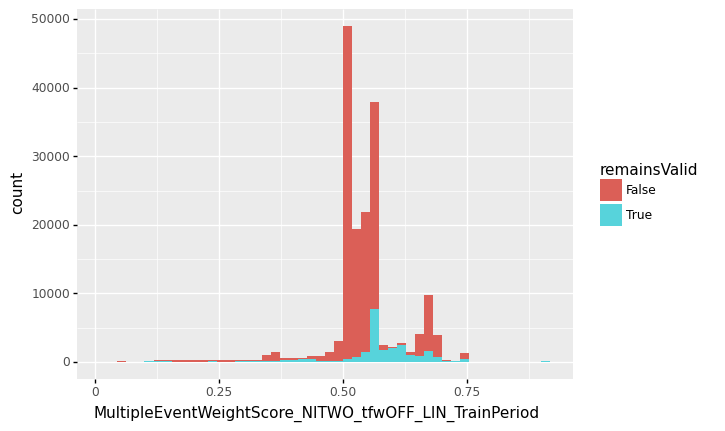

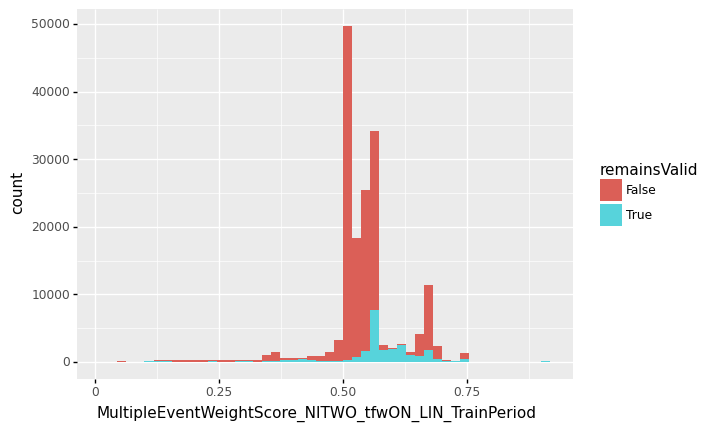

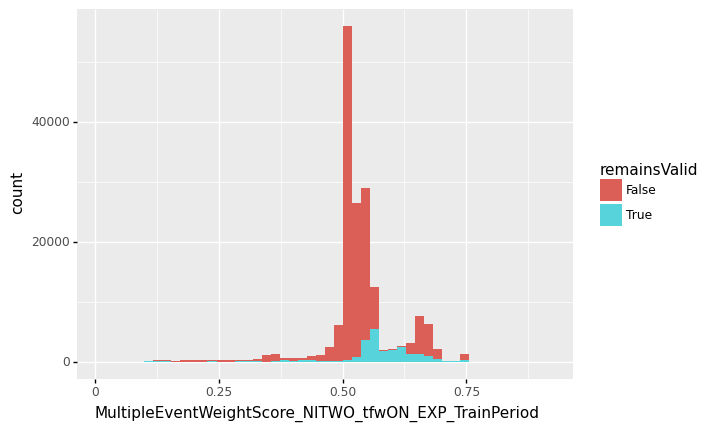

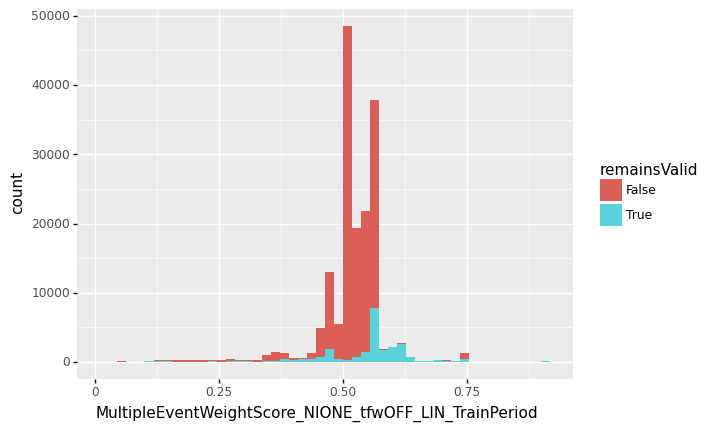

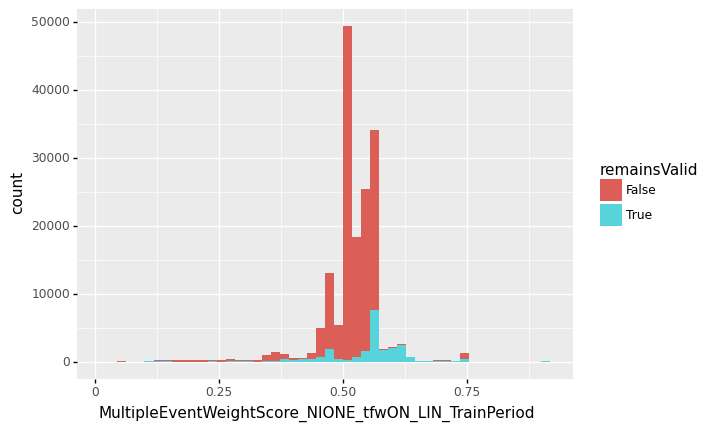

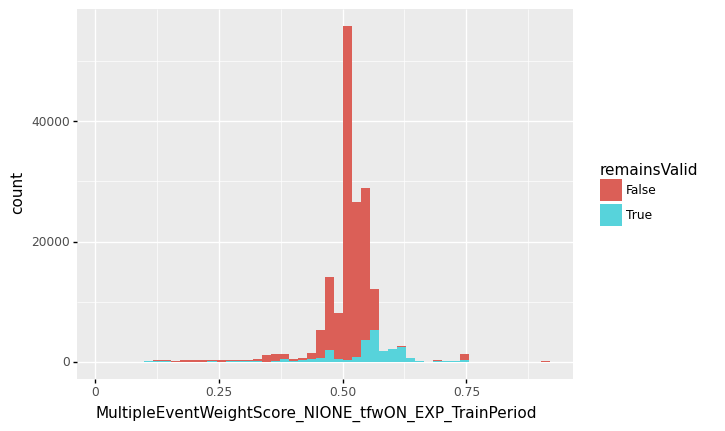

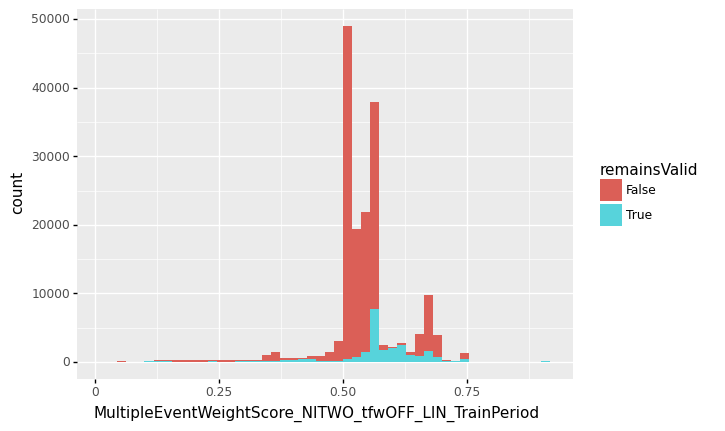

In [55]:
def plotPrCurve(truthLabel,predScore):
    y_test = df[truthLabel]
    y_pred = df[predScore]
    precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
    d = {'precision': precision, 'recall': recall}
    prdf = pd.DataFrame(data=d)
    return ggplot(prdf, aes(x='recall', y='precision')) + geom_line() # line plot
    
def plotF1Curve(truthLabel,predScore):
    y_test = df[truthLabel]
    y_pred = df[predScore]
    precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
    f1_scores = 2*recall*precision/(recall+precision)
    f1_scores=f1_scores[0:len(f1_scores)-1]
    print('Best threshold: ', thresholds[np.argmax(f1_scores)])
    print('Best F1-Score: ', np.max(f1_scores))
    d = {'f1': f1_scores, 'thresholds': thresholds}
    prdf = pd.DataFrame(data=d)
    return ggplot(prdf, aes(x='thresholds', y='f1')) + geom_line()

def getBestF1Threshold(truthLabel,predScore):
    y_test = df[truthLabel]
    y_pred = df[predScore]
    precision, recall, thresholds = precision_recall_curve(y_test,y_pred)
    f1_scores = 2*recall*precision/(recall+precision)
    f1_scores=f1_scores[0:len(f1_scores)-1]
    return thresholds[np.argmax(f1_scores)]

def printBestF1Stats(threshold,truthLabel,predScore):
    y_test = df[truthLabel]
    y_pred = df[predScore]>=threshold
    print('Chosen threshold: ', threshold)
    print("F1",f1_score(y_test, y_pred))
    print("Precision",precision_score(y_test, y_pred))
    print("Recall",recall_score(y_test, y_pred))  
    print("Accuracy",accuracy_score(y_test, y_pred)) 
    print()
    print(pd.crosstab(y_test, y_pred))
    
def printAllDetails(truthLabel,predScore):
    print(ggplot(df, aes(x=predScore, y=after_stat('count'),fill=truthLabel)) + scale_y_log10() + geom_histogram(bins=50))
    print(plotPrCurve(truthLabel,predScore))
    print(plotF1Curve(truthLabel,predScore))
    bestF1Threshold = getBestF1Threshold(truthLabel,predScore)
    printBestF1Stats(bestF1Threshold,truthLabel,predScore)
    
def printHistogram(dsName,truthLabel,predScore):
    dfForThisDs = df[df['dataset']==dsName]
    print(ggplot(df, aes(x=predScore, y=after_stat('count'),fill=truthLabel)) + geom_histogram(bins=50))
    
for predScore in scoreNames:
    printHistogram('socrata_oregon',truthLabel,predScore)
    
scoreName='MultipleEventWeightScore_NITWO_tfwOFF_LIN_TrainPeriod'
printHistogram('socrata_austin',truthLabel,scoreName)
